# Laboratorio 1 - Regresión  

### Grupo 23
- **Estudiante 1** : Juan Sebastián Ardila López
- **Estudiante 2** : William Andrés Bayona Vergara
- **Estudiante 3** : Ana María Hernández Lasso

# Etapa 1. Entendimiento de los Datos
Describir las características más relevantes de los datos y todo el perfilamiento de datos, incluir el análisis de calidad de datos y hacer una preselección de las variables más importantes para la etapa de modelado.

## 1.1 Exploración de datos

### Carga del dataset

Primero, cargaremos el dataset desde el archivo CSV.

In [1]:
import pandas as pd
import numpy as np

#Cargamos el dataset de los datos de entrenamiento
df_futbol = pd.read_csv('./datos_entrenamiento_laboratorio1(train_data).csv')
#Queremos conocer el número de filas y columnas
#Las filas corresponden a las características y métricas de cada jugador
#Las columnas corresponden a los registros
filas, columnas = df_futbol.shape

print("Cantidad de filas:", filas)
print("Cantidad de columnas:", columnas)

#Mostramos las primeras filas de los jugadores para saber cómo son los datos
df_futbol


Cantidad de filas: 57934
Cantidad de columnas: 50


,Jugador,Nacionalidad,Posicion,Edad,Dia_partido,Goles,Tiros Totales,xG,npxG,xAG,...,Malos_controles,Perdida_balon,Pases_recibidos,Pases_progresivos_recibidos,Faltas_cometidas,Centros,Duelos_aereos_ganados,%_de_duelos_aereos_ganados,market_value,contract_date
0,Bruno Fernandes,pt POR,"FW,AM",29-343,"Friday August 16, 2024",0,6,1.2,1.2,0.0,...,1,2,51,7,0,8,0,0.0,€50.00m,30.06.2027
1,Marcus Rashford,eng ENG,LW,26-290,"Friday August 16, 2024",0,0,0.0,0.0,0.7,...,2,1,37,9,1,1,1,100.0,€50.00m,30.06.2026
2,Amad Diallo,ci CIV,RW,22-036,"Friday August 16, 2024",0,0,0.0,0.0,0.1,...,2,2,26,7,0,2,0,0.0,-,30.06.2027
3,Amad Diallo,ci CIV,RW,22-036,"Friday August 16, 2024",-5,0,0.0,0.0,0.1,...,2,2,26,7,0,2,0,0.0,€1000.00m,30.06.2030
4,Alejandro Garnacho,ar ARG,RW,20-046,"Friday August 16, 2024",0,2,0.7,0.7,0.2,...,2,1,12,3,0,1,1,50.0,€45.00m,30.06.2028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57929,Chiedozie Ogbene,ie IRL,RW,27-122,"Saturday August 31, 2024",0,0,0.0,0.0,0.0,...,1,2,16,8,2,2,1,50.0,NaN,NaN
57930,Conor Chaplin,eng ENG,"AM,RW",27-197,"Saturday August 31, 2024",0,0,0.0,0.0,0.0,...,0,0,3,0,0,0,0,NaN,NaN,NaN
57931,Omari Hutchinson,eng ENG,"AM,RW",20-306,"Saturday August 31, 2024",0,2,0.1,0.1,0.0,...,4,2,29,4,1,1,1,50.0,€22.00m,30.06.2030
57932,Kalvin Phillips,eng ENG,DM,28-273,"Saturday August 31, 2024",0,0,0.0,0.0,0.0,...,0,2,27,0,2,3,0,NaN,€12.00m,30.06.2028


### Caracteristicas Generales

In [2]:
#Mostramos la información de las columnas del dataset
df_futbol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57934 entries, 0 to 57933
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Jugador                         57934 non-null  object 
 1   Nacionalidad                    57902 non-null  object 
 2   Posicion                        57934 non-null  object 
 3   Edad                            57886 non-null  object 
 4   Dia_partido                     57934 non-null  object 
 5   Goles                           57934 non-null  int64  
 6   Tiros Totales                   57934 non-null  int64  
 7   xG                              57934 non-null  float64
 8   npxG                            57934 non-null  float64
 9   xAG                             57934 non-null  float64
 10  xAG.1                           57934 non-null  float64
 11  Acciones_que_crean_tiros        57934 non-null  int64  
 12  Pases_intentados                

En el diccionario de datos se hace alusión a 41 columnas. Ahora veamos el por qué en el dataset son 50.

In [3]:
#Veamos el por qué hay varios xAG, ya que no se mencionan las columnas "xAG.1", "xAG.2", "xAG.3" en el diccionario de datos.
df_futbol[["xAG", "xAG.1", "xAG.2", "xAG.3"]]

#Aquí vemos que hay 3 columnas adicionales a las 41.

,xAG,xAG.1,xAG.2,xAG.3
0,0.0,0.0,0.0,0.0
1,0.7,0.7,0.7,0.7
2,0.1,0.1,0.1,0.1
3,0.1,0.1,0.1,0.1
4,0.2,0.2,0.2,0.2
...,...,...,...,...
57929,0.0,0.0,0.0,0.0
57930,0.0,0.0,0.0,0.0
57931,0.0,0.0,0.0,0.0
57932,0.0,0.0,0.0,0.0


In [4]:
#Veamos el por qué hay varios Regates_exitosos, ya que no se mencionan la columna "Regates_exitosos_1" en el diccionario de datos.
df_futbol[["Regates_exitosos", "Regates_exitosos.1"]]

#Aquí vemos que hay 1 columnas adicional a las 41.

,Regates_exitosos,Regates_exitosos.1
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
57929,0,0
57930,0,0
57931,2,2
57932,0,0


In [5]:
#Veamos el por qué hay varios Pases_progresivos, ya que no se mencionan la columna "Pases_progresivos.1" en el diccionario de datos.
df_futbol[["Pases_progresivos", "Pases_progresivos.1"]]

#Aquí vemos que hay 1 columna adicional a las 41.

,Pases_progresivos,Pases_progresivos.1
0,6,6
1,2,2
2,1,1
3,1,1
4,0,0
...,...,...
57929,0,0
57930,1,1
57931,3,3
57932,3,3


In [6]:
#Veamos el por qué hay varios Pases_completados, ya que no se menciona las columnas "Pases_completados.1", "Pases_completados.2" en el diccionario de datos.
df_futbol[["Pases_completados", "Pases_completados.1", "Pases_completados.2"]]

#Aquí vemos que hay 2 columnas adicionales a las 41.

,Pases_completados,Pases_completados.1,Pases_completados.2
0,43,43,43
1,22,22,22
2,28,28,28
3,28,28,28
4,10,10,10
...,...,...,...
57929,12,12,12
57930,4,4,4
57931,29,29,29
57932,27,27,27


In [7]:
#Veamos el por qué hay varios Pases_intentados, ya que no se menciona las columnas "Pases_intentados.1", "Pases_intentados.2" en el diccionario de datos.
df_futbol[["Pases_intentados", "Pases_intentados.1", "Pases_intentados.2"]]

#Aquí vemos que hay 2 columnas adicionales a las 41.

,Pases_intentados,Pases_intentados.1,Pases_intentados.2
0,60,60,60
1,30,30,30
2,33,33,33
3,33,33,33
4,11,11,11
...,...,...,...
57929,16,16,16
57930,4,4,4
57931,32,32,32
57932,35,35,35


### Tipos de Datos

In [8]:
#Según el tipo de dato podemos saber cuáles podrían llegar ser variables categóricas o numéricas, o si hay algo extraño

#Traemos las columnas de tipo object, que suelen ser texto
lista_variables_texto = df_futbol.select_dtypes(include=['object']).columns

#Traemos las columnas de tipo int64, float64
lista_variables_numero = df_futbol.select_dtypes(include=['float64', 'int64']).columns

#Ahora podemos conocerlas mejor
print(lista_variables_texto)
print("-------------")
print(lista_variables_numero)
print("-------------")
print("Cantidad de variables de texto:", len(lista_variables_texto))
print("Cantidad de variables de número:", len(lista_variables_numero))

Index(['Jugador', 'Nacionalidad', 'Posicion', 'Edad', 'Dia_partido',
       'market_value', 'contract_date'],
      dtype='object')
-------------
Index(['Goles', 'Tiros Totales', 'xG', 'npxG', 'xAG', 'xAG.1',
       'Acciones_que_crean_tiros', 'Pases_intentados', 'Pases_intentados.1',
       'Pases_intentados.2', 'Pases_progresivos', 'Pases_progresivos.1',
       'Regates_exitosos', 'Regates_exitosos.1', 'Pases_medios_completados',
       'Pases_largos_completados', 'xAG.2', 'xAG.3', 'xA',
       'Pases_en_ultimo_tercio', 'Pases_balon_vivo', 'Pases_balon_muerto',
       'Pases_al_hueco', 'Pases_centros', 'Pases_completados',
       'Pases_completados.1', 'Pases_completados.2', 'Pases_fuera_de_juego',
       'Valla_no_vencida', 'Errores_defnsivos_ocasion_tiro',
       'Toques_en_zona_ofensiva', 'Toques_en_area_rival',
       '%_de_regates_exitosos', 'Veces_que_fue_barrido_regate',
       'Acarreos_ultimo_tercio', 'Malos_controles', 'Perdida_balon',
       'Pases_recibidos', 'Pases_progr

### Consideraciones sobre los datos

Por ahora, como estamos en la etapa de entendimiento de los datos, dejaremos anotadas las observaciones a las que hemos llegado:

1.  La variable `Edad` está como texto (`object`), pero debería ser trabajada como una variable numérica.  
2. La variable `market_value` también está como texto (`object`), pero debería ser trabajada como una variable numérica. En el diccionario de datos se indica que esta métrica corresponde al valor estimado de mercado del jugador en euros.
3. `contract_date` y `Dia_partido` aparecen como texto, pero en realidad podrían también ser fechas (datetime), y de hecho `contract_date` debería serlo según el diccionario de datos.  
4. Hay columnas cuyo nombre termina en .1, .2, .3. Por ejemplo, la columna `Pases_intentados.1`. Este tipo de columnas son nueve en total, y ninguna de ellas se mencionan en el diccionario de datos. Tampoco brindan información nueva, de hecho toda la información dada es la repetición de la columna original (que si aparece en el diccionario de datos).
5. Hay muchas posiciones diferentes de fútbol en `Posicion`, sería útil darlas en un mismo formato, como el mencionado en el diccionario de datos (Defensa, Delantero, Portero, ...). Además, hay algunos jugadores con más de una posición, siendo una columna multivalor.
6. En la columna `Edad` podemos considerar el número antes del guion (-) presente en los datos.
7. La columna `nacionalidad` tiene el prefijo del país y luego la abreviatura del país. Es de utilidad revisarlo.


Debemos mencionar que estos ajustes no se realizarán en esta etapa, sino en la etapa 2 del Método ASUM-DM: **Preparación de datos.**

### Estadisticas Descriptivas

In [9]:
#Ahora revisaremos las estadísticas descriptivas de variables numéricas

# Calcular estadísticas descriptivas
estadisticas_variables_numero = df_futbol[lista_variables_numero].describe().T

# Agregar mediana
estadisticas_variables_numero['median'] = df_futbol[lista_variables_numero].median()

estadisticas_variables_numero

,count,mean,std,min,25%,50%,75%,max,median
Goles,57934.0,0.513015,16.440600,-5.0,0.0,0.0,0.0,995.0,0.0
Tiros Totales,57934.0,0.792402,1.158538,0.0,0.0,0.0,1.0,12.0,0.0
xG,57934.0,0.088635,0.209810,0.0,0.0,0.0,0.1,2.9,0.0
npxG,57934.0,0.080473,0.186549,0.0,0.0,0.0,0.1,2.9,0.0
xAG,57934.0,0.062784,0.152033,0.0,0.0,0.0,0.1,2.1,0.0
xAG.1,57934.0,0.062784,0.152033,0.0,0.0,0.0,0.1,2.1,0.0
Acciones_que_crean_tiros,57934.0,1.416750,1.727395,0.0,0.0,1.0,2.0,16.0,1.0
Pases_intentados,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0
Pases_intentados.1,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0
Pases_intentados.2,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0


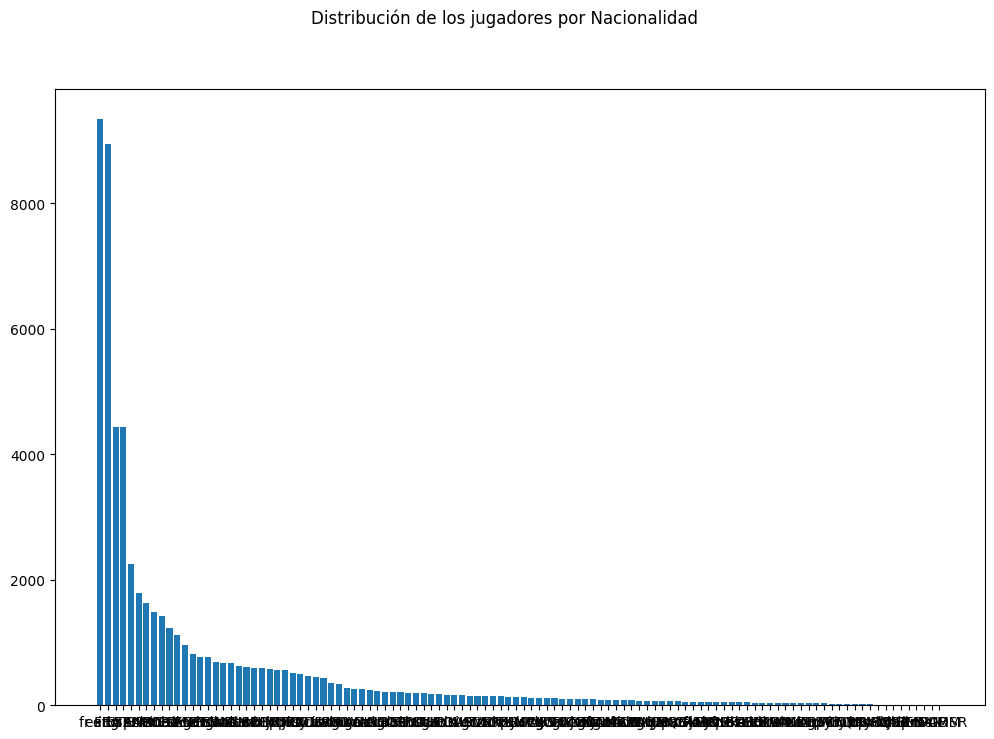

In [10]:
#Continuamos con algunas visualizaciones básicas para comprensión de ciertas variables del dataset

#Empecemos con un grafico de barras para las nacionalidades más frecuentes y menos frecuentes
import matplotlib.pyplot as plt

todas_nacionalidades = df_futbol['Nacionalidad'].value_counts()

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.bar(todas_nacionalidades.index, todas_nacionalidades.values)

fig.suptitle("Distribución de los jugadores por Nacionalidad")

plt.show()

Son muchas nacionalidades, no se lee nada, así que hacemos tops para entender mejor

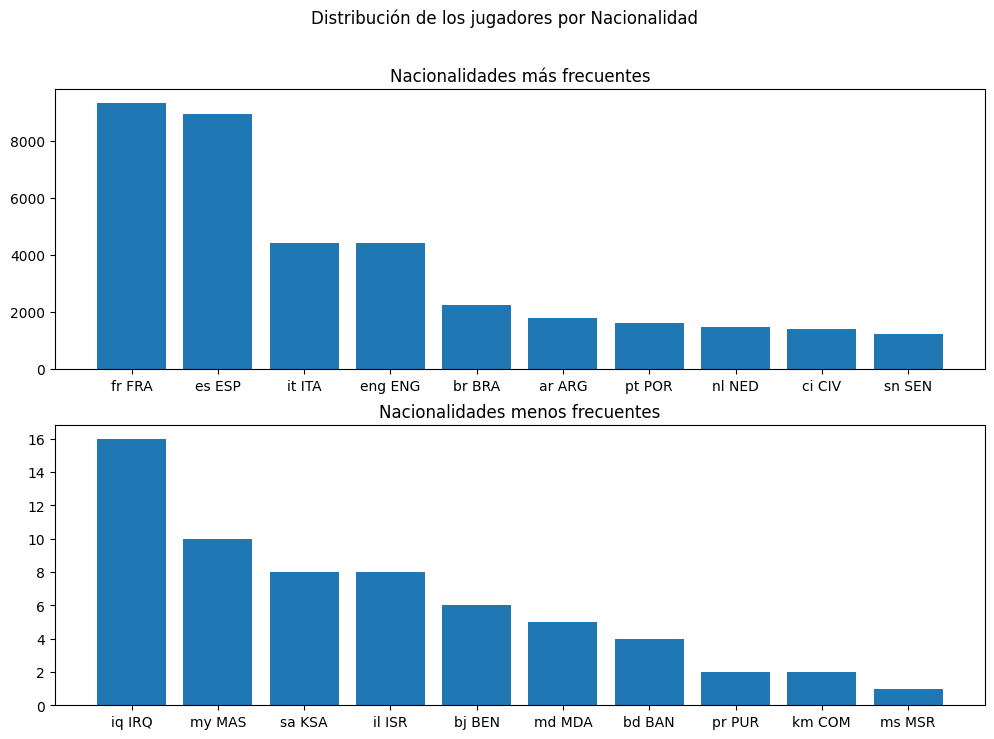

In [11]:

#Top 10 nacionalidades más frecuentes
top_nacionalidades = df_futbol['Nacionalidad'].value_counts().head(10)
#Top 10 nacionalidades menos frecuentes
pocas_nacionalidades = df_futbol['Nacionalidad'].value_counts().tail(10)

#Creamos la figura
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

#Graficamos las nacionalidades más frecuentes
ax[0].bar(top_nacionalidades.index, top_nacionalidades.values) #El indice nos da la nacionalidad y values nos da la frecuencia
ax[0].set_title('Nacionalidades más frecuentes')

ax[1].bar(pocas_nacionalidades.index, pocas_nacionalidades.values)
ax[1].set_title('Nacionalidades menos frecuentes')

fig.suptitle("Distribución de los jugadores por Nacionalidad")

plt.show()

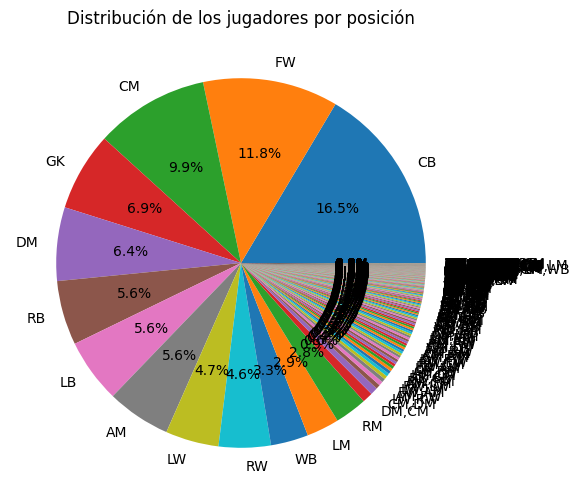

In [12]:
#Ahora visualizaremos la distribución de las posiciones de futbol mediante un pie chart

posiciones = df_futbol['Posicion'].value_counts()

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(posiciones, labels=posiciones.index, autopct='%1.1f%%')
ax.set_title("Distribución de los jugadores por posición")
plt.show()

Ahora mismo es posible revisar algunos de los distintos tipos de posiciones actuales:

In [13]:
#Se revisan los diferentes valores de la columna Posición
df_futbol['Posicion'].value_counts().reset_index()

,Posicion,count
0,CB,9537
1,FW,6858
2,CM,5763
3,GK,3987
4,DM,3729
...,...,...
447,"CM,DM,LW",1
448,"WB,LB,LM",1
449,"LW,WB,LM",1
450,"FW,WB,RM",1


Así podemos ver que hay muchas posiciones diferentes, aunque las posiciones generales de fútbol reales no son tantas. Esta casilla es multivalor y además no hay categorías generales. Podemos dejar eso en stand-by mientras llegamos a la etapa de Preparación de Datos.

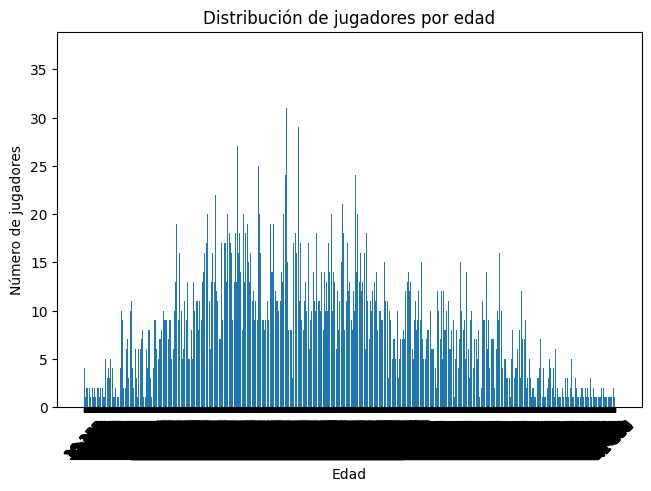

In [14]:
#Continuemos un grafico de barras para las edad


conteo_de_edades = df_futbol['Edad'].value_counts().sort_index() #Hagamoslo ordenado para no perdernos
plt.figure(layout='constrained')
plt.bar(conteo_de_edades.index, conteo_de_edades.values)
plt.title("Distribución de jugadores por edad")
plt.xlabel("Edad")
plt.ylabel("Número de jugadores")
plt.xticks(rotation=45)
plt.show()


Vemos que hay muchas edades, ya que siempre viene la edad escrita y luego un guion (-) con otra información. Podemos graficarlo más adelante únicamente con la edad que está antes del guion -. También lo dejaremos en stand-by mientras llegamos a la etapa de Preparación de datos.

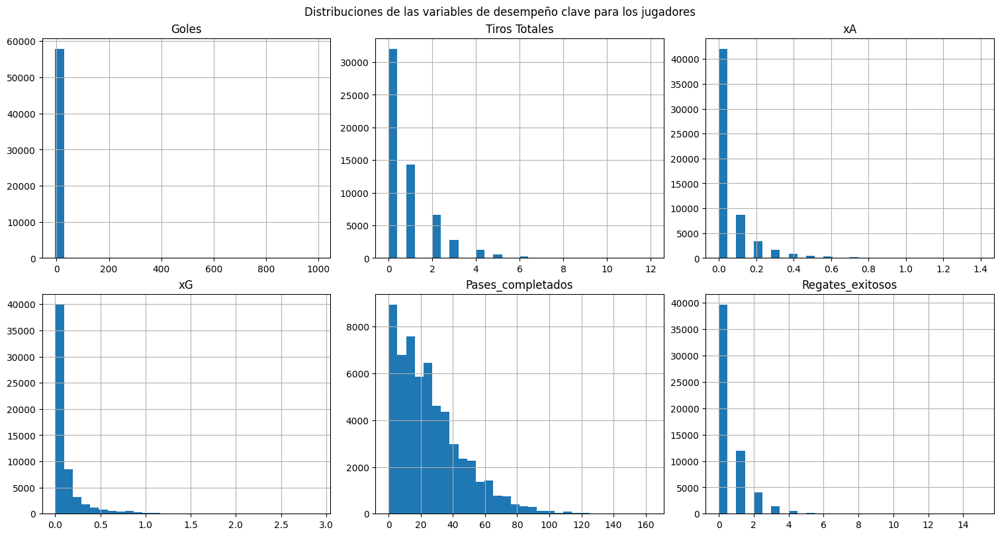

In [15]:
#Veamos ahora cómo son las distribuciones de las variables de desempeño clave para los jugadores

variables_clave = ['Goles', 'Tiros Totales', 'xA','xG', 'Pases_completados', 'Regates_exitosos']

#Cramos la figura
fig, ax = plt.subplots(2, 3, figsize=(15, 8), layout='constrained')

#Recorremos las variables clave para graficar
contador = 0
for i in range(0,2):
  for j in range(0,3):
    ax[i][j].hist( df_futbol[variables_clave[contador]], bins=30)
    ax[i][j].set_title(variables_clave[contador])
    ax[i][j].grid(True)
    contador += 1


fig.suptitle("Distribuciones de las variables de desempeño clave para los jugadores")

plt.show()

Podemos realizar un boxplot para aquellar variables del dataset con alta desviación estándar

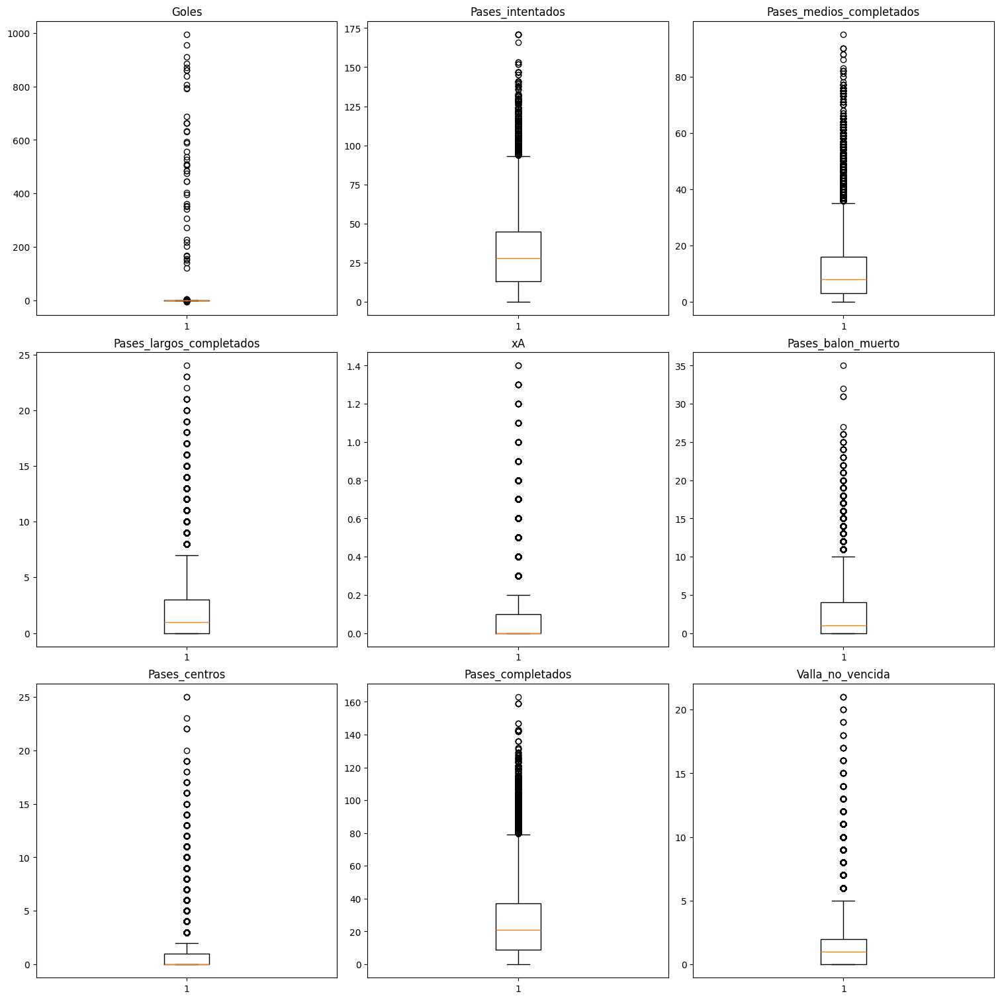

In [16]:
variables_clave = ['Goles', 'Pases_intentados', 'Pases_medios_completados', 'Pases_largos_completados', 'xA', 'Pases_balon_muerto', 'Pases_centros', 'Pases_completados', 'Valla_no_vencida']

#Creamos la figura
fig, ax = plt.subplots(3, 3 , figsize=(15, 15), layout='constrained')

#Recorremos las variables clave para graficar
contador = 0
for i in range(0,3):
  for j in range(0,3):
    ax[i][j].boxplot(df_futbol[variables_clave[contador]])
    ax[i][j].set_title(variables_clave[contador])
    contador += 1

plt.show()

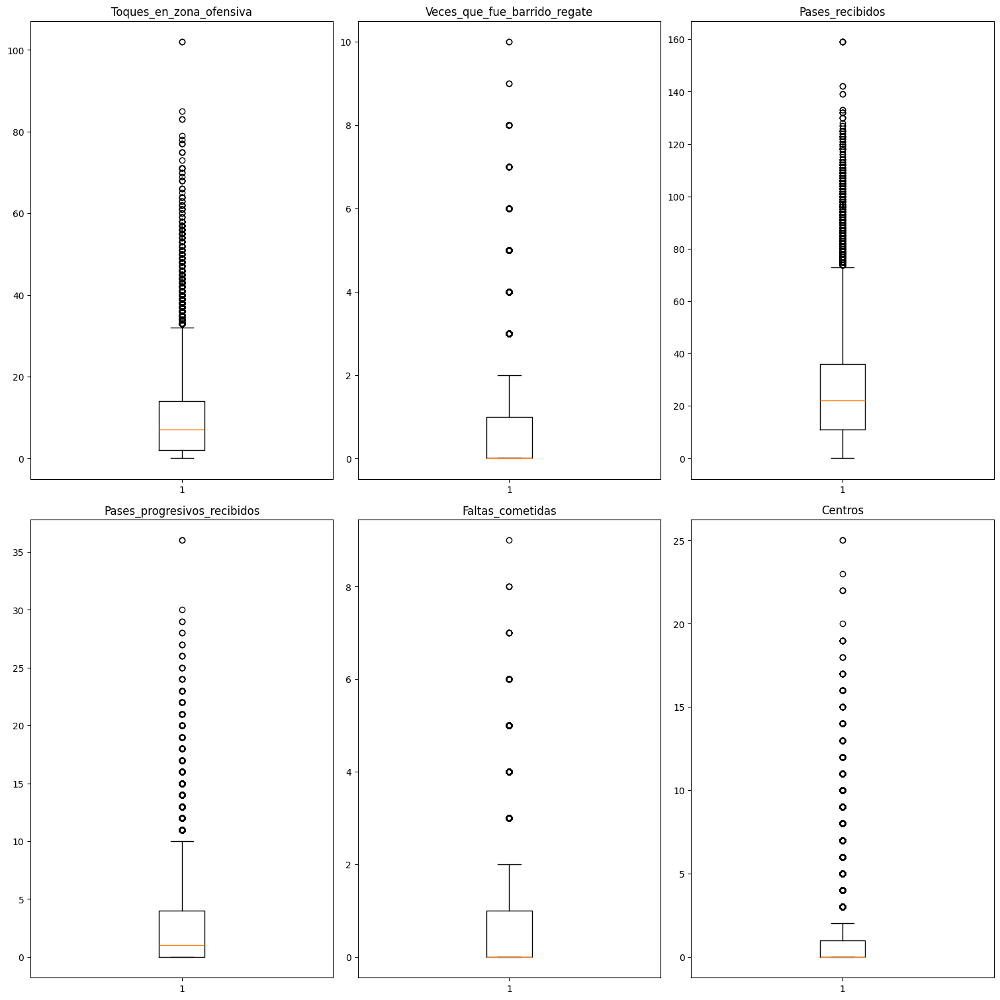

In [17]:
variables_clave = ['Toques_en_zona_ofensiva', 'Veces_que_fue_barrido_regate', 'Pases_recibidos', 'Pases_progresivos_recibidos', 'Faltas_cometidas',
                   'Centros']

#Creamos la figura
fig, ax = plt.subplots(2, 3, figsize=(15, 15), layout='constrained')

#Recorremos las variables clave para graficar
contador = 0
for i in range(0,2):
    for j in range(0,3):
        ax[i][j].boxplot(df_futbol[variables_clave[contador]].dropna())
        ax[i][j].set_title(variables_clave[contador])
        contador += 1

plt.show()


## Descripción del entendimiento de datos
Nos compartieron un dataset de entrenamiento con la información del rendimiento de 57934 jugadores de fútbol en partidos. Inicialmente, se identificaron 43 posibles variables numéricas y 7 posibles variables categóricas. Con el ajuste de las columnas `Edad` y `market_value` de texto a número, pues son variables numéricas; así como obviando las nueve columnas adicionales que no están en el diccionario de datos (las cuales terminan en sufijos como .1, .2, .3), tenemos 36 variables numéricas y 5 categóricas. En total, tenemos 41 columnas.

De esas columnas, podemos llegar a la siguiente información:

1. Generalidades del jugador: Compuesto por siete columnas, incluyendo Jugador (su nombre), edad, nacionalidad, posición, contract_date, market_value, dia partido (día en que se disputó el partido).

2. Métricas avanzadas de rendimiento: Compuesto por cinco columnas, incluyendo xG, npxG, xA, xAG y PSxG

3. Rendimiento tradicional del jugador: Compuesto por veintinueve columnas, incluyendo goles, tipos de pases, centros, duelos ganados, tiros, regates, acarreos, controles, pérdidas del balón, toques, faltas, errores y vallas

Ahora bien, gracias a las visualizaciones realizadas, entendemos que:

### Interpretación de visualización de variables categóricas:
En general, hay una gran cantidad de jugadores de Francia y España, seguidos por Italia e Inglaterra. Esto muestra que la mayoría de jugadores son europeos.


### Interpretación de visualización de variables numéricas:
- Podemos visualizar que la mayoría de variables de desempeño claves tienen distribuciones similares, en las cuales la mayoría de los jugadores tienen valores de cero o cercanos a cero. Esto quiere decir que unos pocos anotan goles, realizan regates o tienen un alto xG.

- La mayoría de métricas presentan distribuciones con muchos valores bajos y pocos valores muy altos, lo cual es esperable para un partido de fútbol. Esto es visible en los diagramas boxplot.

- Gráficamente, en el boxplot de la variable Goles se identifican valores irreales, ya que hay outliers cercanos o superiores a 200, así como valores negativos, los cuales no tienen sentido en el contexto de un solo partido.

### Interpretación de estadísticas descriptivas:
Finalmente, teniendo en cuenta las reglas de negocio, y una vez hemos comprendido las estadísticas descriptivas de las variables numéricas, también podemos afirmar:

1. Variables como Tiros Totales, xG, npxG, regates exitosos y duelos aéreos ganados presentan medianas y cuartiles (25%, 50%, 75%) iguales a 0. Esto nos muestra que en la mayoría de los registros que tenemos de los jugadores, sabemos que ellos no realizaron estas acciones durante el partido.

2. Algunas variables como los pases presentan una desviación estándar alta en comparación con su media. Por ejemplo, los pases intentados tienen una media de 31.65 y una desviación estándar de 22.96. Esto nos puede indicar que hay jugadores con un número de pases muy alto, mientras otros con un número de pases muy bajo. No todos intervienen en el partido de forma similar en cuanto a sus pases intentados. Esta tendencia suele verse con los diferentes tipos de pases.

### Identificación de reglas de negocio relevantes:

1. El número de goles no debería ser negativo.
2. El número máximo de métricas como goles, pases intentados, pases de balón vivo, pases completados, pases recibidos y centros no debería ser un valor irreal o exagerado.  



## 1.2 Análisis de calidad de los datos




### Completitud: revisar valores nulos

%_de_regates_exitosos             28722
%_de_duelos_aereos_ganados        20957
contract_date                     12916
market_value                      12894
Edad                                 48
Nacionalidad                         32
Jugador                               0
Posicion                              0
Dia_partido                           0
Goles                                 0
xAG.1                                 0
Acciones_que_crean_tiros              0
Pases_intentados                      0
Pases_intentados.1                    0
Tiros Totales                         0
xG                                    0
npxG                                  0
xAG                                   0
Regates_exitosos                      0
Pases_progresivos.1                   0
Pases_progresivos                     0
Pases_intentados.2                    0
Regates_exitosos.1                    0
Pases_medios_completados              0
Pases_largos_completados              0


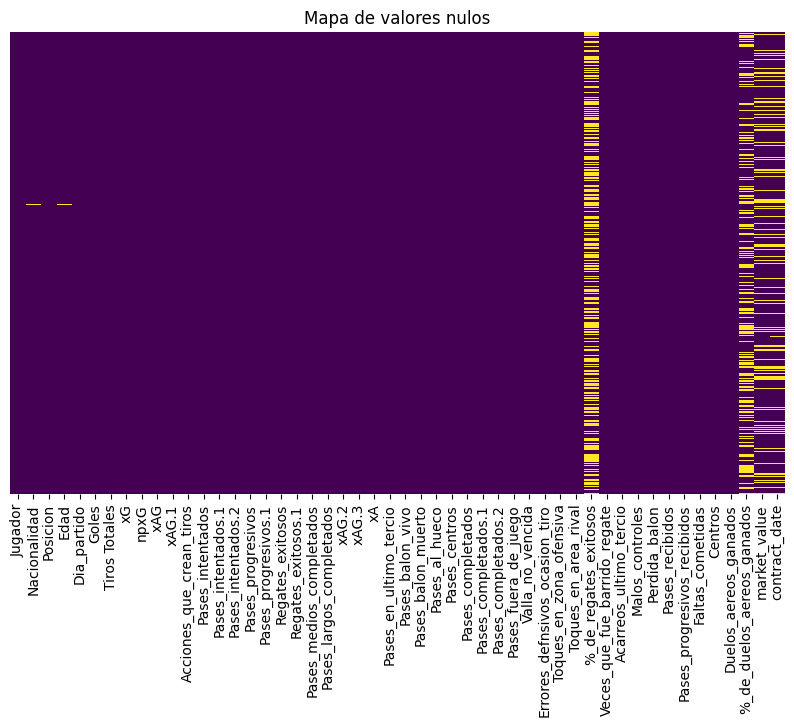

In [18]:
import seaborn as sns

#Veamos cuantos nulos hay en cada casilla
nulos = df_futbol.isnull().sum()
#Ordenamos los nulos de mayor a menor
nulos = nulos.sort_values(ascending=False)
display(nulos)

#Hacemos el mapa de valores nulos
#Los valores nulos se encuentran en amarillo.
plt.figure(figsize=(10, 6))
sns.heatmap(df_futbol.isnull(), cbar=False, yticklabels=False, cmap='viridis')
plt.title('Mapa de valores nulos')
plt.show()


Las variables con valores nulos son `%_de_regates_exitosos` (28.722 nulos), `%_de_duelos_aereos_ganados` (20.957 nulos), `contract_date` (12.916 nulos), `market_value` (12.894 nulos), `Edad` (48 nulos) y `Nacionalidad` (32 nulos). El resto de las variables no presenta nulos.

### Unicidad: revisar filas duplicadas completas y duplicados parciales


In [19]:
#Revisamos las filas duplicadas completas
num_duplicados = df_futbol.duplicated().sum()
print("Número de filas duplicadas completas:", num_duplicados)

#Revisamos las filas duplicadas parciales por Jugador, Posición y Día del partido
variables_para_duplicados = ['Jugador', 'Posicion', 'Dia_partido']

#Si deberia ser segun esos parametros??

duplicados_parciales = df_futbol.duplicated(subset=variables_para_duplicados, keep=False)
num_duplicados_parciales = duplicados_parciales.sum()
print("Número de duplicados parciales (según Jugador, Posicion y Dia Partido):", num_duplicados_parciales)

# Mostrar algunos ejemplos
print("Ejemplos de duplicados parciales:")
display(df_futbol[duplicados_parciales].head(10))

Número de filas duplicadas completas: 10483
Número de duplicados parciales (según Jugador, Posicion y Dia Partido): 25265
Ejemplos de duplicados parciales:


,Jugador,Nacionalidad,Posicion,Edad,Dia_partido,Goles,Tiros Totales,xG,npxG,xAG,...,Malos_controles,Perdida_balon,Pases_recibidos,Pases_progresivos_recibidos,Faltas_cometidas,Centros,Duelos_aereos_ganados,%_de_duelos_aereos_ganados,market_value,contract_date
0,Bruno Fernandes,pt POR,"FW,AM",29-343,"Friday August 16, 2024",0,6,1.2,1.2,0.0,...,1,2,51,7,0,8,0,0.0,€50.00m,30.06.2027
1,Marcus Rashford,eng ENG,LW,26-290,"Friday August 16, 2024",0,0,0.0,0.0,0.7,...,2,1,37,9,1,1,1,100.0,€50.00m,30.06.2026
2,Amad Diallo,ci CIV,RW,22-036,"Friday August 16, 2024",0,0,0.0,0.0,0.1,...,2,2,26,7,0,2,0,0.0,-,30.06.2027
3,Amad Diallo,ci CIV,RW,22-036,"Friday August 16, 2024",-5,0,0.0,0.0,0.1,...,2,2,26,7,0,2,0,0.0,€1000.00m,30.06.2030
4,Alejandro Garnacho,ar ARG,RW,20-046,"Friday August 16, 2024",0,2,0.7,0.7,0.2,...,2,1,12,3,0,1,1,50.0,€45.00m,30.06.2028
5,Mason Mount,eng ENG,AM,25-219,"Friday August 16, 2024",0,1,0.3,0.3,0.1,...,1,3,18,3,1,0,1,100.0,€28.00m,30.06.2028
6,Joshua Zirkzee,nl NED,FW,23-086,"Friday August 16, 2024",1,1,0.1,0.1,0.0,...,1,0,6,1,0,0,0,NaN,€30.00m,30.06.2029
7,Kobbie Mainoo,eng ENG,DM,19-119,"Friday August 16, 2024",0,1,0.0,0.0,0.0,...,1,4,36,1,3,0,2,40.0,€50.00m,30.06.2027
8,Scott McTominay,sct SCO,DM,27-252,"Friday August 16, 2024",0,0,0.0,0.0,0.0,...,0,0,2,0,0,0,1,100.0,€50.00m,30.06.2028
9,Casemiro,br BRA,DM,32-175,"Friday August 16, 2024",0,3,0.2,0.2,1.0,...,0,0,50,0,1,3,2,50.0,€10.00m,30.06.2026


### Consistencia: Revisar los formatos de los datos y si los datos se contradicen o no entre sí (si hay incoherencias entre ellos)


In [20]:

#Los pases que fueron completados no deberian ser mayores que los pases intentados
inconsistencia_de_pases = df_futbol[df_futbol['Pases_completados'] > df_futbol['Pases_intentados']]

#Los goles no deberian ser mayores que los tiros
inconsistencia_de_goles = df_futbol[df_futbol['Goles'] > df_futbol['Tiros Totales']]

#El porcentaje de regates exitosos puede ser mayor a cero solo si en efeco hubo regates existosos
if '%_de_regates_exitosos' in df_futbol.columns:
    inconsistencia_de_regates = df_futbol[(df_futbol['%_de_regates_exitosos'] > 0) & (df_futbol['Regates_exitosos'] == 0)]


#El porcentaje de duelos aéreos puede ser mayor a cero solo si en efecto hubo duelos aereos ganados
if '%_de_duelos_aereos_ganados' in df_futbol.columns:
    inconsistencia__de_duelos = df_futbol[(df_futbol['%_de_duelos_aereos_ganados'] > 0) & (df_futbol['Duelos_aereos_ganados'] == 0)]


print("Filas con goles > tiros:", len(inconsistencia_de_goles))
print("Filas con pases completados > intentados:", len(inconsistencia_de_pases))
print("Filas con % regates > 0 pero regates exitosos = 0:", len(inconsistencia_de_regates))
print("Filas con % duelos aéreos > 0 pero duelos ganados = 0:", len(inconsistencia__de_duelos))



Filas con goles > tiros: 235
Filas con pases completados > intentados: 0
Filas con % regates > 0 pero regates exitosos = 0: 0
Filas con % duelos aéreos > 0 pero duelos ganados = 0: 0


Encontramos que hay 235 registros donde el número de goles es mayor que el número de tiros, lo cual resulta inconsistente en el contexto del fútbol.



### Validez: revisar que los valores estén dentro de rangos lógicos y tengan sentido para el contexto

In [21]:
#Volvamos a revisar las estadísticas descriptivas de variables numéricas

# Calcular estadísticas descriptivas
estadisticas_variables_numero = df_futbol[lista_variables_numero].describe().T

# Agregar mediana
estadisticas_variables_numero['median'] = df_futbol[lista_variables_numero].median()

estadisticas_variables_numero

,count,mean,std,min,25%,50%,75%,max,median
Goles,57934.0,0.513015,16.440600,-5.0,0.0,0.0,0.0,995.0,0.0
Tiros Totales,57934.0,0.792402,1.158538,0.0,0.0,0.0,1.0,12.0,0.0
xG,57934.0,0.088635,0.209810,0.0,0.0,0.0,0.1,2.9,0.0
npxG,57934.0,0.080473,0.186549,0.0,0.0,0.0,0.1,2.9,0.0
xAG,57934.0,0.062784,0.152033,0.0,0.0,0.0,0.1,2.1,0.0
xAG.1,57934.0,0.062784,0.152033,0.0,0.0,0.0,0.1,2.1,0.0
Acciones_que_crean_tiros,57934.0,1.416750,1.727395,0.0,0.0,1.0,2.0,16.0,1.0
Pases_intentados,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0
Pases_intentados.1,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0
Pases_intentados.2,57934.0,31.659716,22.963272,0.0,13.0,28.0,45.0,171.0,28.0


1. El valor mínimo de goles es -5, lo cual es un valor inválido, no pueden existir goles negativos en un partido de fútbol.

2. El valor máximo de goles es de 995, pero es imposible que el número de goles anotados en un mismo partido sea ese. Estos valores máximos que son poco comunes también se ven en otras métricas como los pases intentados, pases de balón vivo, pases completados, pases recibidos y centros.

3. Las variables que son de porcentajes, como `%_de_regates_exitosos` y `%_de_duelos_aereos_ganados` deberían estar en el rango de 0 a 100, y en efecto se ha confirmado que lo están, al ver sus valores min y max.

## Enfoque analítico

Para el caso de FutAlpes, donde hemos sido contratados para construir un modelo de aprendizaje automático capaz de predecir el precio de un jugador a partir de sus estadísticas, identificamos lo siguiente:

- **Tipo de analítica**: Predictiva, porque queremos conocer un valor futuro o estimar qué va a pasar. En este caso: ¿Cuál va a ser el valor del mercado de un jugador según sus métricas y características?

- **Tipo de aprendizaje**: Supervisado, ya que contamos con un dataset etiquetado. Es decir, tenemos las características y métricas de los jugadores (las variables explicativas, (ej. xA, goles) y también la etiqueta, es decir, conocemos los datos de la variable objetivo (market_value) de nuestro dataset.

- **Tipo de tarea supervisada**: Regresión/Estimación, porque la variable objetivo (market_value) es numérica continua, el valor en euros puede llegar a tener decimales.

## Preselección de variables
En esta etapa se realiza una primera depuración de las variables del dataset, con el fin de mantener únicamente aquellas que puedan aportar información útil en la predicción del valor de mercado de los jugadores. Más adelante se aplicará un segundo filtro, ya con base en criterios estadísticos y de desempeño del modelo, para decidir cuáles se utilizan finalmente y cuáles se descartan.

En esta primera revisión, podemos descartar:

- Las variables `%_regates_exitosos` y `%_duelos_aereos_ganados`, ya que son métricas que se pueden derivar con sus equivalentes en frecuencia (Regates_exitosos y Duelos_aereos_ganados). Mantener los porcentajes generaría redundancia en la información que ya tenemos, porque están altamente correlacionados con las variables de frecuencia.

- La variable `Dia_partido`, ya que el día específico en el que se registró un partido no influye en el valor de un jugador.

- La variable `contract_date`, pues en la base de datos solo aparece como contratos vigentes, por lo que es común y constante para todos y no diferencia a los jugadores.

- La variable `Jugador`, ya que el nombre del jugador no explica su valor en el mercado.

De esta forma, el dataset queda más limpio. Por ahora, podemos conservar las demás variables hasta los próximos filtros.

# Etapa 2. Preparación de datos
Solucionar los problemas de calidad de datos previamente identificados que afecten el modelo a construir. Además, debe aplicar todos los proceso de preprocesamiento de datos necesarios para la construcción del modelo de regresión.


## Sobre formateos y limpieza de datos:

### Eliminar las casillas con terminación .1, .2, .3
Hemos observado que las casillas con ese tipo de terminaciones no aportan contenido, ya que son el duplicado de la columna original de datos que no lleva esa terminación. Por ello, al ver que no aporta datos nuevos y que son tan solo réplicas, podemos eliminarlas para evitar ruido. Nos podemos quedar con las columnas originales, sin los sufijos.

In [22]:
columnas_a_eliminar = []

for columna in df_futbol.columns:
    if columna.endswith(('.1', '.2', '.3')):
        columnas_a_eliminar.append(columna)

print("Columnas a eliminar:", columnas_a_eliminar)

# Eliminamos esas columnas
df_futbol = df_futbol.drop(columns=columnas_a_eliminar)

print("Columnas eliminadas:", len(columnas_a_eliminar))
print("Shape final del dataset:", df_futbol.shape)

Columnas a eliminar: ['xAG.1', 'Pases_intentados.1', 'Pases_intentados.2', 'Pases_progresivos.1', 'Regates_exitosos.1', 'xAG.2', 'xAG.3', 'Pases_completados.1', 'Pases_completados.2']
Columnas eliminadas: 9
Shape final del dataset: (57934, 41)


### Convertir las casillas contract_date y Dia_partido a datetime

Las variables `contract_date` y `Dia_partido` se encontraban en formato de texto (object), lo que dificulta más adelante el realizar operaciones temporales en caso de ser necesario. Por ello se convirtieron al tipo datetime, lo que permite hacer este tipo de cálculos con años, meses y días. Nos da mayor control sobre estos datos y su manejo.

In [23]:
#Conversión de las fechas a datetime
df_futbol["Dia_partido"] = pd.to_datetime(df_futbol["Dia_partido"], errors="coerce", dayfirst=True)
df_futbol["contract_date"] = pd.to_datetime(df_futbol["contract_date"], errors="coerce", dayfirst=True)


#Veamos como quedaron
print(df_futbol[["Dia_partido", "contract_date"]].dtypes)
print("----------" + "\n")
print(df_futbol[["Dia_partido", "contract_date"]].head())


Dia_partido      datetime64[ns]
contract_date    datetime64[ns]
dtype: object
----------

  Dia_partido contract_date
0  2024-08-16    2027-06-30
1  2024-08-16    2026-06-30
2  2024-08-16    2027-06-30
3  2024-08-16    2030-06-30
4  2024-08-16    2028-06-30



### Simplificación del formato en la columna de Nacionalidad

La variable Nacionalidad contenía prefijos adicionales junto con el código de país (ej. ‘eng ENG’, ‘pt POR’). Para estandarizar la información y facilitar su codificación en el modelo, se mantuvo únicamente el código de 3 letras correspondiente a la nacionalidad. Esto asegura consistencia y evita duplicidad de categorías irrelevantes.

In [24]:
#Pedimos que extraiga cualquier secuencia de mayusculas, pues en realidad las abreviaturas de los países están en mayúsculas (ej. ENG)
df_futbol["Nacionalidad"] = df_futbol["Nacionalidad"].str.extract(r'([A-Z]+)')

df_futbol["Nacionalidad"]

0        POR
1        ENG
2        CIV
3        CIV
4        ARG
        ... 
57929    IRL
57930    ENG
57931    ENG
57932    ENG
57933    SWE
Name: Nacionalidad, Length: 57934, dtype: object

### Eliminar registros con valores de goles irreales
Según el diccionario de datos, Goles es el número de goles anotados en el partido. Ahora bien, tenemos registros con valores irreales, mayores a 6, o incluso números negativos, como observamos en la fase anterior.

Por ello, hemos decidido:

- Eliminar registros con goles < 0, ya que ese hecho no tiene ningún sentido en la realidad.

- Eliminar registros con goles > 6, porque en un partido profesional jamás se superan esos valores, de hecho el máximo para las ligas profesionales de alto nivel en Europa, los máximos suelen ser 6 goles en un partido

Hay que tener en cuenta que la eliminación de registros con goles negativos o superiores a 6 no representa una pérdida significativa de información, ya que los boxplots muestran que estos casos son outliers frente al gran volumen de datos válidos que tenemos.


In [25]:
#Nos queremos quedar con los registros válidos de goles (entre 0 y 6)
#Hacemos filtrado, con eso ya se descartan los otros registros
total_registros = df_futbol.shape[0]


df_futbol = df_futbol[(df_futbol["Goles"] >= 0) & (df_futbol["Goles"] <= 6)]

#Guardamos tamaño final de esa columna, que justo es la primera
total_filtrado = df_futbol.shape[0]

#Entonces esto fue lo que paso:
print("Registros iniciales:", total_registros)
print("Registros después de filtrar Goles:", total_filtrado)
print("Registros eliminados:", total_registros - total_filtrado)
print("Porcentaje eliminado:", round(((total_registros - total_filtrado) / total_registros) * 100, 4), "%")

Registros iniciales: 57934
Registros después de filtrar Goles: 57885
Registros eliminados: 49
Porcentaje eliminado: 0.0846 %


### Edad como variable numérica
Hay que trabajar la edad como variable numérica, y podemos tomar únicamente el valor antes del guion (-) en dicha columna, ya que ese es el correspondiente a la edad en años. Esto concuerda con la descripción en el diccionario de datos.

In [26]:
#Solo queremos el valor antes del guion, lo ponemos en esa misma columna como un número entero, pues es la edad en años

#Ponemos el parametro errors='coerce' porque toma todo lo que no puede convertir a número entero (como los valores NaN) y
#los pasa a NaN
df_futbol['Edad'] = pd.to_numeric(df_futbol['Edad'].str.split('-').str[0], errors='coerce')

print(df_futbol["Edad"].dtype)

float64


### Formateo del precio de jugador: de texto a número

Para poder trabajar en el entrenamiento del precio del jugador, es eficiente y cómodo hacer que la variable objetivo (en nuestro caso) sea numérica.


In [27]:
# Quitamos el símbolo € y la letra m
df_futbol["market_value"] = (df_futbol["market_value"]
                             .str.replace("€", "", regex=False)
                             .str.replace("m", "e6", regex=False)
                             .str.replace("k", "e3", regex=False))

df_futbol["market_value"] = pd.to_numeric(df_futbol["market_value"], errors="coerce")


print(df_futbol["market_value"].head(5))
print(df_futbol["market_value"].dtype)

0    50000000.0
1    50000000.0
2           NaN
4    45000000.0
5    28000000.0
Name: market_value, dtype: float64
float64


Ahora es posible ver las estadísticas descriptivas de edad y precio del jugador

In [28]:
#Ahora revisaremos las estadísticas descriptivas de variables numéricas

# Calcular estadísticas descriptivas
estadisticas_variables_numero_mas = df_futbol[['Edad', 'market_value']].describe().T

# Agregar mediana
estadisticas_variables_numero_mas['median'] = df_futbol[['Edad', 'market_value']].median()

estadisticas_variables_numero_mas

,count,mean,std,min,25%,50%,75%,max,median
Edad,57837.0,2.591505e+01,4.308364e+00,16.0,23.0,25.0,29.0,4.200000e+01,25.0
market_value,44816.0,2.385980e+07,2.548096e+08,50000.0,3600000.0,10000000.0,24000000.0,9.999990e+09,10000000.0


Es importante notar que la media de la edad es aproximadamente 26.0 años y la media del market_value es aproximadamente 25,067,330 de euros


## Sobre datos duplicados:


### Registros o filas completamente duplicadas
Este tipo de registros no aportan nada, por lo cual es posible eliminarlos.



In [29]:
antes_de_quitar = df_futbol.shape[0]
#Nos quedamos con uno solo, no con duplicados
df_futbol = df_futbol.drop_duplicates(keep="first")
despues_de_quitar = df_futbol.shape[0]

print("Duplicados que hemos eliminado:", antes_de_quitar - despues_de_quitar)

Duplicados que hemos eliminado: 10482


### Duplicados parciales por Jugador, Posicion, Dia_partido

Esperamos una fila por jugador en un partido, no varias. No es que juegue dos partidos distintos en el mismo día. Es probable que se haya registrado dos veces por diferentes personas o proveedores.

- Decidimos quedarnos con una sola fila por jugador para un dia de partido.



In [30]:
columnas_parciales_quitar = ['Jugador', 'Posicion', 'Dia_partido']
antes_parciales = df_futbol.shape[0]
#Nos quedamos con uno solo tambien
df_futbol = df_futbol.sort_values(columnas_parciales_quitar).drop_duplicates(subset=columnas_parciales_quitar, keep='first')
despues_parciales = df_futbol.shape[0]

print("Duplicados parciales eliminados:", antes_parciales - despues_parciales)

Duplicados parciales eliminados: 2807


## Sobre reglas de consistencia


Encontramos 235 casos con Goles > Tiros Totales, lo cual es imposible en el contexto de un partido.

- Vamos a eliminar esos registros, ya que son pocos. No hay forma de corregir, ya que y hacer que Tiros Totales > Goles, ya que tendríamos que dar un valor inventado.


In [31]:
#Hallamos esos datos incosistentes en el dataset
inconsistentes = df_futbol['Goles'] > df_futbol['Tiros Totales']
num_inconsistentes = inconsistentes.sum()

print("Registros inconsistentes (Goles > Tiros):", num_inconsistentes)

Registros inconsistentes (Goles > Tiros): 135


## Sobre datos nulos:


### Eliminación de registros sin precio de jugador (NaN en market_value)

Dado que nuestra variable objetivo es el precio del jugador, no tiene mucho sentido entrenar el modelo con datos que no tengan dicha variable. Es por esto que, eliminamos los registros que no cuenten con este valor. Posteriormente, volvemos a revisar el estado de nuestro dataframe

OJO: No vamos a imputar esta variable, que es la objetivo, porque estaríamos inventando lo que justamente queremos predecir, lo cual puede generar ruido.

In [32]:
df_futbol.dropna(subset=["market_value"], inplace=True) #El inplace = True hace que la eliminación se aplique en nuestro df directamente
df_futbol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34466 entries, 25245 to 36589
Data columns (total 41 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Jugador                         34466 non-null  object        
 1   Nacionalidad                    34448 non-null  object        
 2   Posicion                        34466 non-null  object        
 3   Edad                            34448 non-null  float64       
 4   Dia_partido                     34173 non-null  datetime64[ns]
 5   Goles                           34466 non-null  int64         
 6   Tiros Totales                   34466 non-null  int64         
 7   xG                              34466 non-null  float64       
 8   npxG                            34466 non-null  float64       
 9   xAG                             34466 non-null  float64       
 10  Acciones_que_crean_tiros        34466 non-null  int64         
 11  Pas

In [33]:
df_futbol.describe().T

,count,mean,min,25%,50%,75%,max,std
Edad,34448.0,25.75688,16.0,23.0,25.0,28.0,41.0,4.071112
Dia_partido,34173,2025-01-08 21:40:16.117987840,2024-08-15 00:00:00,2024-10-28 00:00:00,2025-01-13 00:00:00,2025-03-29 00:00:00,2025-05-25 00:00:00,NaN
Goles,34466.0,0.096037,0.0,0.0,0.0,0.0,4.0,0.329951
Tiros Totales,34466.0,0.830703,0.0,0.0,0.0,1.0,12.0,1.194007
xG,34466.0,0.092578,0.0,0.0,0.0,0.1,2.9,0.214519
npxG,34466.0,0.084332,0.0,0.0,0.0,0.1,2.9,0.191248
xAG,34466.0,0.066048,0.0,0.0,0.0,0.1,2.1,0.156049
Acciones_que_crean_tiros,34466.0,1.487263,0.0,0.0,1.0,2.0,16.0,1.777374
Pases_intentados,34466.0,32.61037,0.0,14.0,29.0,46.0,171.0,22.848266
Pases_progresivos,34466.0,2.497476,0.0,0.0,2.0,4.0,30.0,2.788914


### Eliminación de columnas con muchos nulos en porcentajes (%_regates_exitosos, %_duelos_aereos_ganados)

- Hay miles de registros con datos nulos para estas variables, demasiados, como se pudo visualizar en el mapa de nulos.

- Ya tenemos métricas similares (ej: número de regates, número de duelos), por lo que perder esas columnas no quita información, hay otras variables que ya nos dan eso.

In [34]:

columnas_a_eliminar = ["%_de_regates_exitosos", "%_de_duelos_aereos_ganados"]

#Las quitamos
df_futbol = df_futbol.drop(columns=columnas_a_eliminar)

print("Columnas eliminadas:", columnas_a_eliminar)
print("----------")
columnas = df_futbol.columns
columnas

Columnas eliminadas: ['%_de_regates_exitosos', '%_de_duelos_aereos_ganados']
----------


Index(['Jugador', 'Nacionalidad', 'Posicion', 'Edad', 'Dia_partido', 'Goles',
       'Tiros Totales', 'xG', 'npxG', 'xAG', 'Acciones_que_crean_tiros',
       'Pases_intentados', 'Pases_progresivos', 'Regates_exitosos',
       'Pases_medios_completados', 'Pases_largos_completados', 'xA',
       'Pases_en_ultimo_tercio', 'Pases_balon_vivo', 'Pases_balon_muerto',
       'Pases_al_hueco', 'Pases_centros', 'Pases_completados',
       'Pases_fuera_de_juego', 'Valla_no_vencida',
       'Errores_defnsivos_ocasion_tiro', 'Toques_en_zona_ofensiva',
       'Toques_en_area_rival', 'Veces_que_fue_barrido_regate',
       'Acarreos_ultimo_tercio', 'Malos_controles', 'Perdida_balon',
       'Pases_recibidos', 'Pases_progresivos_recibidos', 'Faltas_cometidas',
       'Centros', 'Duelos_aereos_ganados', 'market_value', 'contract_date'],
      dtype='object')

### Eliminación de columna Dia_partido
- Esta columna no aporta para predecir el valor de mercado de un jugador directamente. El día del partido en que se realizó la toma de métricas no resulta relevante para este caso.

In [35]:
#La quitamos
df_futbol = df_futbol.drop(columns="Dia_partido")

print("Columnas eliminadas:", "Dia_partido")
print("----------")
columnas = df_futbol.columns
columnas

Columnas eliminadas: Dia_partido
----------


Index(['Jugador', 'Nacionalidad', 'Posicion', 'Edad', 'Goles', 'Tiros Totales',
       'xG', 'npxG', 'xAG', 'Acciones_que_crean_tiros', 'Pases_intentados',
       'Pases_progresivos', 'Regates_exitosos', 'Pases_medios_completados',
       'Pases_largos_completados', 'xA', 'Pases_en_ultimo_tercio',
       'Pases_balon_vivo', 'Pases_balon_muerto', 'Pases_al_hueco',
       'Pases_centros', 'Pases_completados', 'Pases_fuera_de_juego',
       'Valla_no_vencida', 'Errores_defnsivos_ocasion_tiro',
       'Toques_en_zona_ofensiva', 'Toques_en_area_rival',
       'Veces_que_fue_barrido_regate', 'Acarreos_ultimo_tercio',
       'Malos_controles', 'Perdida_balon', 'Pases_recibidos',
       'Pases_progresivos_recibidos', 'Faltas_cometidas', 'Centros',
       'Duelos_aereos_ganados', 'market_value', 'contract_date'],
      dtype='object')

### Eliminación de nacionalidades y edades nulas (NaN en Nacionalidad y en Edad)

- Son muy pocos los registros que cuentan con nacionalidad y edad nula.
- Mantener estos registros incompletos podría afectar la calidad del modelo, ya que tanto la nacionalidad como la edad son variables relevantes en la estimación del valor de mercado de un jugador, según la información que se nos ha dado.
- La pérdida de información, viendo que son muy pocos datos, es insignificante.

In [36]:
df_futbol.dropna(subset=["Nacionalidad","Edad"], inplace=True) #El inplace = True hace que la eliminación se aplique en nuestro df directamente
df_futbol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34448 entries, 25245 to 36589
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Jugador                         34448 non-null  object        
 1   Nacionalidad                    34448 non-null  object        
 2   Posicion                        34448 non-null  object        
 3   Edad                            34448 non-null  float64       
 4   Goles                           34448 non-null  int64         
 5   Tiros Totales                   34448 non-null  int64         
 6   xG                              34448 non-null  float64       
 7   npxG                            34448 non-null  float64       
 8   xAG                             34448 non-null  float64       
 9   Acciones_que_crean_tiros        34448 non-null  int64         
 10  Pases_intentados                34448 non-null  int64         
 11  Pas

### Eliminación de fechas de contrato  (contract_date)

- Hay 12916 registros nulos. Ahora veamos qué pasa con aquellos que no son nulos:

In [37]:
#Total de registros que NO son nulos en contract_date
no_nulos = df_futbol['contract_date'].notna().sum()
print("Total de contract_date no nulos:", no_nulos)

#Total de registros con contrato desde 2026 en adelante
desde_2026 = df_futbol[df_futbol['contract_date'] >= '2026-01-01'].shape[0]
print("Contract_date desde 2026 en adelante:", desde_2026)

Total de contract_date no nulos: 33754
Contract_date desde 2026 en adelante: 33754


- Al analizar los registros no nulos de la columna contract_date, encontramos que todas las fechas de finalización de contrato corresponden al año 2026.

- Esto implica que la variable no aporta variación única para los jugadores, pues únicamente indica que los contratos actuales se encuentran vigentes en todos los casos conocidos.

- Todos los contract_date no nulos están desde el 2026 en adelante, por lo que la variable no aporta variación (prácticamente es constante: “vigente”). Al revisar los datos de validación, ocurre similar a este caso.

- Imputar una fecha futura a los valores nulos no sería útil, ya que terminaríamos asignando la misma condición (“vigente”) a todos los jugadores, sin aportar información adicional.

- De este modo, como tenemos bastantes registros nulos, y vimos el patrón de vigente, podemos asumir que los jugadores tienen contrato vigente, y eliminar la variable contract_date


In [38]:
#La quitamos
df_futbol = df_futbol.drop(columns="contract_date")

print("Columnas eliminadas:", "contract_date")
print("----------")
columnas = df_futbol.columns
columnas

Columnas eliminadas: contract_date
----------


Index(['Jugador', 'Nacionalidad', 'Posicion', 'Edad', 'Goles', 'Tiros Totales',
       'xG', 'npxG', 'xAG', 'Acciones_que_crean_tiros', 'Pases_intentados',
       'Pases_progresivos', 'Regates_exitosos', 'Pases_medios_completados',
       'Pases_largos_completados', 'xA', 'Pases_en_ultimo_tercio',
       'Pases_balon_vivo', 'Pases_balon_muerto', 'Pases_al_hueco',
       'Pases_centros', 'Pases_completados', 'Pases_fuera_de_juego',
       'Valla_no_vencida', 'Errores_defnsivos_ocasion_tiro',
       'Toques_en_zona_ofensiva', 'Toques_en_area_rival',
       'Veces_que_fue_barrido_regate', 'Acarreos_ultimo_tercio',
       'Malos_controles', 'Perdida_balon', 'Pases_recibidos',
       'Pases_progresivos_recibidos', 'Faltas_cometidas', 'Centros',
       'Duelos_aereos_ganados', 'market_value'],
      dtype='object')

### Setear valla invicta para jugadores que no sean arqueros

Variable que no tiene sentido para jugadores que no sean arqueros

In [39]:
df_futbol["Valla_no_vencida"] = np.where(df_futbol["Posicion"] != "GK", df_futbol["Valla_no_vencida"], 0)
df_futbol

,Jugador,Nacionalidad,Posicion,Edad,Goles,Tiros Totales,xG,npxG,xAG,Acciones_que_crean_tiros,...,Veces_que_fue_barrido_regate,Acarreos_ultimo_tercio,Malos_controles,Perdida_balon,Pases_recibidos,Pases_progresivos_recibidos,Faltas_cometidas,Centros,Duelos_aereos_ganados,market_value
25245,Aaron Ciammaglichella,ITA,CM,19.0,0,0,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,7.000000e+05
29271,Aaron Martin,ESP,LB,27.0,0,0,0.0,0.0,0.1,3,...,0,1,1,4,56,13,3,9,0,6.500000e+06
29491,Aaron Martin,ESP,LB,27.0,0,0,0.0,0.0,0.2,2,...,0,1,0,0,44,3,0,6,2,6.500000e+06
30054,Aaron Martin,ESP,LB,27.0,0,1,0.1,0.1,0.0,1,...,1,0,2,0,32,4,1,5,0,6.500000e+06
30172,Aaron Martin,ESP,LB,27.0,0,0,0.0,0.0,0.3,5,...,0,2,0,0,33,2,0,5,0,6.500000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31661,Þorir Johann Helgason,ISL,RM,24.0,0,0,0.0,0.0,0.0,1,...,1,1,1,1,12,2,1,2,3,3.000000e+06
32139,Þorir Johann Helgason,ISL,RM,24.0,0,0,0.0,0.0,0.1,3,...,1,2,3,2,27,5,0,2,0,3.000000e+06
31989,Þorir Johann Helgason,ISL,"RM,LM",24.0,0,1,0.1,0.1,0.3,7,...,0,0,3,1,35,3,0,9,1,3.000000e+06
33548,Þorir Johann Helgason,ISL,RW,24.0,0,0,0.0,0.0,0.0,0,...,1,1,2,0,8,4,0,0,1,3.000000e+06


## Sobre el manejo del nombre de los jugadores:

### Eliminación de la variable Jugador
- El nombre del jugador no es una variable significativa para el modelo porque actúa únicamente como un identificador, y no aporta información explicativa sobre el rendimiento ni sobre el valor de mercado. No ayuda a conocer cuánto puede costar un jugador, ya que solo se tienen en cuenta sus métricas.

- Por este motivo hemos decidido eliminar la variable Jugador del dataset antes de entrenar.

In [40]:
agg_funcs = {}

for col in df_futbol.columns:
    if col in ['Jugador']:
        agg_funcs[col] = "first"
    elif col in ["Edad","Nacionalidad"]:
        agg_funcs[col] = "first"
    elif col =="market_value":
        agg_funcs[col] = "mean"
    elif pd.api.types.is_numeric_dtype(df_futbol[col]):
        #agg_funcs[col]= ["sum","mean","min","max"]
        agg_funcs[col]= "mean"
    elif col=='Posicion':
        agg_funcs[col] = lambda x: ", ".join(x.astype(str).unique())

df_futbol = df_futbol.groupby('Jugador', as_index=False).agg(agg_funcs)
df_futbol["Posicion"] = df_futbol["Posicion"].apply(lambda x: ", ".join(list(set(x.split(",")))))

# Limpieza de posiciones
df_futbol.rename(columns={"Posicion_<lambda>": "Posicion","Nacionalidad_first":"Nacionalidad","Edad_first":"Edad","market_value_mean":"market_value"}, inplace=True)
df_futbol["Posicion"] = df_futbol["Posicion"].apply(lambda x: ", ".join(list(set(x.split(",")))))

df_futbol

,Jugador,Nacionalidad,Posicion,Edad,Goles,Tiros Totales,xG,npxG,xAG,Acciones_que_crean_tiros,...,Veces_que_fue_barrido_regate,Acarreos_ultimo_tercio,Malos_controles,Perdida_balon,Pases_recibidos,Pases_progresivos_recibidos,Faltas_cometidas,Centros,Duelos_aereos_ganados,market_value
0,Aaron Ciammaglichella,ITA,CM,19.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000e+05
1,Aaron Martin,ESP,"LB, WB, LB, LM, LW, CM, LW",27.0,0.000000,0.444444,0.016667,0.016667,0.150000,2.638889,...,0.333333,0.861111,0.611111,0.472222,28.861111,3.000000,1.055556,7.111111,0.555556,6.500000e+06
2,Aaron Ramsdale,ENG,GK,26.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,...,0.000000,0.000000,0.100000,0.000000,23.400000,0.000000,0.033333,0.000000,0.200000,1.600000e+07
3,Aaron WanBissaka,ENG,"LB, WB, LB, RW, RM, RB, LW, RB",27.0,0.055556,0.444444,0.025000,0.025000,0.094444,2.583333,...,1.194444,1.805556,0.972222,0.611111,36.722222,4.638889,0.694444,2.111111,0.611111,2.400000e+07
4,Abakar Sylla,CIV,"WB, CB, LB, CB, RM, CM, DM",21.0,0.047619,0.238095,0.023810,0.023810,0.004762,0.190476,...,0.142857,0.047619,0.238095,0.190476,23.666667,0.142857,0.809524,0.047619,0.952381,1.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1531,Zion Suzuki,JPN,GK,21.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.243243,...,0.000000,0.000000,0.027027,0.000000,20.216216,0.000000,0.081081,0.000000,0.351351,1.000000e+07
1532,Zito Luvumbo,ANG,"DM, AM, LM, RW, AM, RW, LW, RM, R...",22.0,0.076923,0.884615,0.076923,0.076923,0.111538,1.346154,...,0.961538,0.807692,2.576923,1.115385,14.115385,4.807692,1.461538,2.500000,0.230769,5.000000e+06
1533,Ørjan Nyland,NOR,GK,33.0,0.000000,0.000000,0.000000,0.000000,0.010000,0.366667,...,0.000000,0.000000,0.000000,0.000000,18.866667,0.000000,0.033333,0.000000,0.233333,9.000000e+05
1534,Þorir Johann Helgason,ISL,"DM, AM, LM, LM, RW, LW, RM",24.0,0.000000,0.761905,0.052381,0.052381,0.052381,1.857143,...,0.285714,0.333333,1.238095,0.476190,13.428571,2.761905,0.476190,3.380952,0.809524,3.000000e+06


## Sobre el manejo de la columna multivalor Posición:

### Posición del jugador: Posición_general

Podemos tomar los valores de las distintas posiciones que hay actualmente escritas para los jugadores de fútbol (como GK, CB, CM, LM, etc) y mapearlas a las definidas en el diccionario de datos Posición, tales como Defensa, Delantero, Portero. Esto lo hacemos, por el momento, en una nueva columna, llamada Posicion_general.


In [41]:
nombres_posiciones = {
    'GK': 'Arquero',
    'CB': 'Defensa',
    'RB': 'Defensa',
    'LB': 'Defensa',
    'WB': 'Defensa',
    'CM': 'Mediocampista',
    'DM': 'Mediocampista',
    'AM': 'Mediocampista',
    'LM': 'Mediocampista',
    'RM': 'Mediocampista',
    'FW': 'Delantero',
    'ST': 'Delantero',
    'CF': 'Delantero',
    'LW': 'Delantero',
    'RW': 'Delantero'
}

#Nueva columna del df con la posición ya mapeada para poder graficar
#En otros estan los no incluidos, o los jugadores que juegan varias posiciones
df_futbol['Posicion_general'] = df_futbol['Posicion'].map(nombres_posiciones).fillna('Otros')

## Proceso iterativo: Entendimiento de datos

Una vez hemos formateado y mapeado algunas de las columnas del dataset, podemos realizar su respectiva visualización, tomando en consideración que ASUM-DM es un proceso iterativo.

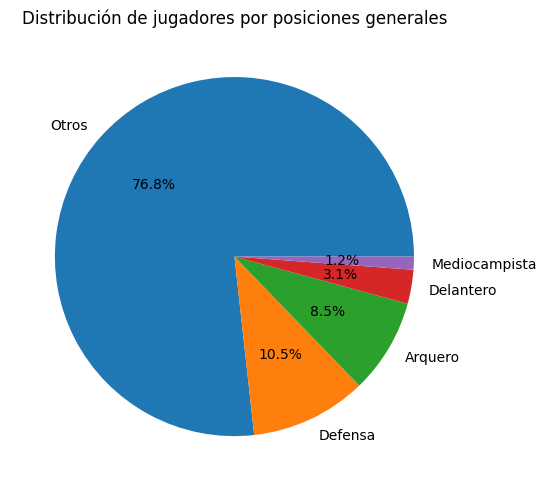

In [42]:
#Visualizamos las posiciones de los jugadores

#Creamos la figura
fig, ax = plt.subplots(layout='constrained')
#Creamos un piechart para conocer el porcentaje de jugadores por posición
df_futbol['Posicion_general'].value_counts().plot.pie(autopct='%1.1f%%')
ax.set_title("Distribución de jugadores por posiciones generales")
ax.set_ylabel("")
plt.show()

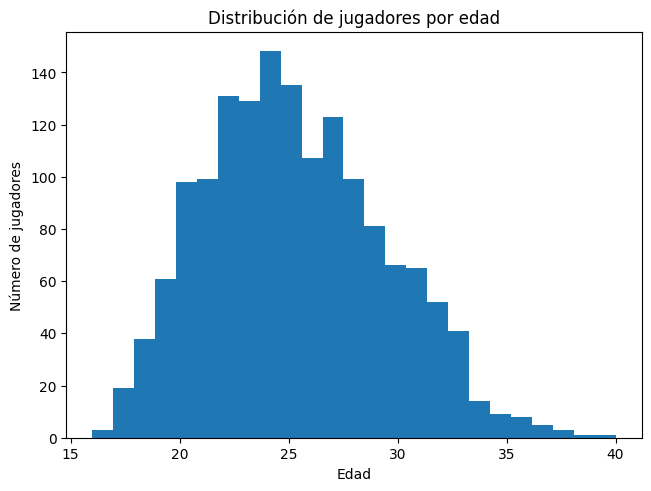

In [43]:
#Visualizamos la edad de los jugadores

conteo_de_edades = df_futbol['Edad'].value_counts().sort_index() #Ya no tendriamos que hacer value_counts ordenado,
#solo podemos hacer histograma
plt.figure(layout='constrained')
plt.hist(df_futbol['Edad'], bins=25)
plt.title("Distribución de jugadores por edad")
plt.xlabel("Edad")
plt.ylabel("Número de jugadores")
plt.show()


Añadimos los nuevos insights a la descripción del entendimiento de datos

### Interpretación de visualización de variables categóricas:

Ahora conocemos que la mayoría de jugadores que juegan en una sola posición son defensas, mediocampistas y delanteros.

### Interpretación de visualización de variables numéricas:
Sabemos que la edad de los jugadores tiene picos más altos entre los 22 y los 26 años, con una minoría de jugadores menores de 20 años y de jugadores mayores de 35 años.

## Retomamos el manejo de la columna multivalor Posición:

### Duplicación de jugadores con multivalor en Posición

- En la creación de la columna Posición_general, hicimos que los jugadores con múltiples posiciones fueran agrupados en la categoría “Otros”.

- En lugar de agruparlos únicamente en la categoría “Otros”, decidimos duplicar esos registros, de modo que cada jugador aparezca tantas veces como posiciones tenga en un partido.

- Esta estrategia evita la pérdida de información de las posiciones, ya que cada posición de un mismo jugador puede ser relevante para explicar su valor de mercado y desempeño en el campo.

- Esto lo hacemos porque el número de jugadores con posiciones múltiples no es alto, pero se gana precisión en el análisis por rol.

In [44]:
antes = df_futbol.shape[0]


#Hacemos una copia por si acaso
df_futbol_roles = df_futbol.copy()

#Recordar que ya teniamos un dict de mapeo llamado nombres_posiciones

#Separamos las posiciones que tienen los jugadores en listas
df_futbol_roles['Posicion_lista'] = (df_futbol_roles['Posicion'].fillna('').astype(str).str.split(','))

#Hacemos explode la lista, eso hace que se cree una fila por cada elemento de esa lista (como por ejemplo: Juan CB, RB
#Eso nos dejaria con las filas: Juan CB y Juan RB (2 filas, cada una con el rol)
df_futbol_roles = df_futbol_roles.explode('Posicion_lista', ignore_index=True)


#Limpiamos los espacios en blanco que pudieron quedar con el split de antes (no queremos cositas como " RB", no espacios, nada de eso)
df_futbol_roles['Posicion_lista'] = df_futbol_roles['Posicion_lista'].astype(str).str.strip()
df_futbol_roles = df_futbol_roles[df_futbol_roles['Posicion_lista'] != '']

#Mapeamos a las categorías generales con nuestro dict (a Defensa, Mediocampo, ...)
df_futbol_roles['Posicion_general'] = (df_futbol_roles['Posicion_lista'].map(nombres_posiciones).fillna('Otros'))

#Ahora Otros es cuando no existia un multivalor con las posiciones clasicas específicas
#Eliminamos la columna Posicion_lista, que ya no nos resulta util, ya tenemos Posicion_general
#Eliminamos la columna Posicion, que tiene la posicion especifica, y ya tampoco nos es util
df_futbol_roles = df_futbol_roles.drop(columns=['Posicion_lista','Posicion'])

despues = df_futbol_roles.shape[0]

print("Duplicaciones:", despues - antes)

Duplicaciones: 5671


## Revisión del nuevo dataset df_futbol_roles hasta este momento

In [45]:
df_futbol_roles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7207 entries, 0 to 7206
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Jugador                         7207 non-null   object 
 1   Nacionalidad                    7207 non-null   object 
 2   Edad                            7207 non-null   float64
 3   Goles                           7207 non-null   float64
 4   Tiros Totales                   7207 non-null   float64
 5   xG                              7207 non-null   float64
 6   npxG                            7207 non-null   float64
 7   xAG                             7207 non-null   float64
 8   Acciones_que_crean_tiros        7207 non-null   float64
 9   Pases_intentados                7207 non-null   float64
 10  Pases_progresivos               7207 non-null   float64
 11  Regates_exitosos                7207 non-null   float64
 12  Pases_medios_completados        72

In [46]:
#Revisemos las variables categoricas con un value_counts

#Veamos cuantas nacionalidades hay y la frecuencia por ellas
print("\nDistribución de nacionalidades:")
print(df_futbol_roles['Nacionalidad'].value_counts())

#¿Todas las nacionalidades cumplen formato de 3 letras en mayúscula?
mask_formato = df_futbol_roles['Nacionalidad'].str.fullmatch(r'[A-Z]{3}') #Si matchean el formato o no
print("\nTotal con formato correcto:", mask_formato.sum())
print("Total registros:", len(df_futbol_roles))
print("Registros incorrectos:", (~mask_formato).sum())

print("------")
#Veamos cuantas posiciones hay y la frecuencia por ellas
print("\nDistribución de posiciones generales:")
print(df_futbol_roles['Posicion_general'].value_counts())


Distribución de nacionalidades:
Nacionalidad
ESP    1342
FRA     957
ENG     665
ITA     561
BRA     259
       ... 
MAS       1
EST       1
MAD       1
BIH       1
MTQ       1
Name: count, Length: 100, dtype: int64

Total con formato correcto: 7207
Total registros: 7207
Registros incorrectos: 0
------

Distribución de posiciones generales:
Posicion_general
Mediocampista    3461
Delantero        1927
Defensa          1687
Arquero           132
Name: count, dtype: int64


## Hagamos la transformación de variables categóricas a numéricas

Actualmente tenemos las variables categóricas Nacionalidad y Posición General.

- Nacionalidad: Se convierte con OneHotEncoder porque es una variable categórica de tipo nominal, es decir, que no existe un orden jerárquico entre las nacionalidades. No hay una mayor o prioritaria a otra.

- Posición General: Se aplica OneHotEncoder porque representa categorías nominales como arquero, defensa, mediocampista y delantero. No tiene sentido asignarles números directos (ejemplo: 1 = arquero, 2 = defensa), ya que eso implicaría un orden que en la vida real no existe.

In [47]:
from sklearn.preprocessing import OneHotEncoder

#Tomamos las columnas categóricas a vectorizar
categoricas_vectorizar = ['Posicion_general']

#Inicializamos el encoder
ohe = OneHotEncoder(sparse_output=False, drop="first", handle_unknown='ignore')

#Hacemos la codificacion
encoded = ohe.fit_transform(df_futbol_roles[categoricas_vectorizar])

#Pasamos a DataFrame con nombres de columnas
encoded_df = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(categoricas_vectorizar))

#Las ponemos en el dataset original y quitamos las categóricas originales sin vectorizar de nacionalidad y posicion general
df_futbol_vectorizado = pd.concat( [df_futbol_roles.drop(columns= categoricas_vectorizar).reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

df_futbol_vectorizado.head()

,Jugador,Nacionalidad,Edad,Goles,Tiros Totales,xG,npxG,xAG,Acciones_que_crean_tiros,Pases_intentados,...,Perdida_balon,Pases_recibidos,Pases_progresivos_recibidos,Faltas_cometidas,Centros,Duelos_aereos_ganados,market_value,Posicion_general_Defensa,Posicion_general_Delantero,Posicion_general_Mediocampista
0,Aaron Ciammaglichella,ITA,19.0,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,700000.0,0.0,0.0,1.0
1,Aaron Martin,ESP,27.0,0.0,0.444444,0.016667,0.016667,0.15,2.638889,46.805556,...,0.472222,28.861111,3.0,1.055556,7.111111,0.555556,6500000.0,1.0,0.0,0.0
2,Aaron Martin,ESP,27.0,0.0,0.444444,0.016667,0.016667,0.15,2.638889,46.805556,...,0.472222,28.861111,3.0,1.055556,7.111111,0.555556,6500000.0,1.0,0.0,0.0
3,Aaron Martin,ESP,27.0,0.0,0.444444,0.016667,0.016667,0.15,2.638889,46.805556,...,0.472222,28.861111,3.0,1.055556,7.111111,0.555556,6500000.0,1.0,0.0,0.0
4,Aaron Martin,ESP,27.0,0.0,0.444444,0.016667,0.016667,0.15,2.638889,46.805556,...,0.472222,28.861111,3.0,1.055556,7.111111,0.555556,6500000.0,0.0,0.0,1.0


## Tomamos df_futbol_vectorizado y hacemos separación por jugador a lo largo de toda la temporada

Analizamos las variables de toda la temporada, pues puede ser que un jugador tuvo partidos muy buenos o muy malos, y queremos ver su desempeño general a lo largo de toda la temporada

In [48]:
# #Funcion que servira para hacer boxplots
import math as m
from sklearn.feature_selection import VarianceThreshold
from pandas.api.types import is_numeric_dtype
import scipy.stats as stats

#Funcion para graficar boxplots de todas las variables para verificar outliers
def boxplots(df):
    lenx,leny = df.shape
    print(lenx,leny)
    fig, axes = plt.subplots(m.ceil(leny/3), 3, figsize=(12,60))
    columnas=df.columns.tolist()
    columnas.remove("Jugador")
    for i in range(leny-1):
      name_columna=columnas[i]
      if not name_columna.startswith("Nacionalidad_"):
        axes[i//3, i%3].boxplot(df[name_columna])
        axes[i//3, i%3].set_title(name_columna)
    #Mostrar
    plt.tight_layout()
    plt.show()

#Dataframe

In [49]:
# Quitamos columnas de nacionalidad, pues presentan algunas nacionalidades que solo tienen uno o dos jugadores, con lo cual, va a hacer overfitting sobre estos datos
df_futbol_vectorizado.drop(columns=["Nacionalidad"],inplace=True)


# Etapa 3. Modelado
Utilizando las variables previamente seleccionadas, construir un modelo de regresión que estime la variable objetivo con el menor error posible.



## Construcción de modelos de regresión lineal


Construimos el modelo de regresión Lineal usando Regresion de Lasso y su análisis de desempeño

## Modelo general

In [50]:
import statsmodels.api as sm
import math as m
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import OLSInfluence
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler


def standardize(series):
    s = pd.Series(series)
    return (s - s.mean())/s.std(ddof=1)

def modelo_evaluacion(df):
  X = df.drop(columns=["market_value"])
  y = df["market_value"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=123)
  scaler = StandardScaler()
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_train = pd.DataFrame(X_train, columns=X.columns)
  X_test = scaler.transform(X_test)
  X_test = pd.DataFrame(X_test, columns=X.columns)
  print("X_train:", X_train.shape, "| X_test:", X_test.shape)
  # model = LinearRegression()
  # model.fit(X_train, y_train)
  alphas = np.logspace(-2, 3, 10)  # entre 0.0001 y 10
  model = LassoCV(alphas=alphas, cv=5, max_iter=500000, random_state=42)
  model.fit(X_train, y_train)
  y_pred_train = model.predict(X_train)
  y_pred_test = model.predict(X_test)
  metrics = {
      "R2_train": r2_score(y_train, y_pred_train),
      "R2_test": r2_score(y_test, y_pred_test),
      "RMSE_train": mean_squared_error(y_train, y_pred_train),
      "RMSE_test": mean_squared_error(y_test, y_pred_test),
      "MAE_train": mean_absolute_error(y_train, y_pred_train),
      "MAE_test": mean_absolute_error(y_test, y_pred_test),
      "MAPE_train": np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100,
      "MAPE_test": np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100
  }
  fitted_train = y_pred_train
  resid_train = y_train - y_pred_train
  print(pd.Series(metrics))

  n_vars = X_train.shape[1]

  fig, axes = plt.subplots(m.ceil((n_vars+1)/3), 3, figsize=(12, 60))
  # 1. Residuos vs Predicciones (MÁS IMPORTANTE)
  axes[0,0].scatter(y_pred_train, resid_train, alpha=0.6)
  axes[0,0].axhline(y=0, color='red', linestyle='--', linewidth=2)
  axes[0,0].set_xlabel('Valores Predichos')
  axes[0,0].set_ylabel('Residuos')
  axes[0,0].set_title(f'Residuos vs Predicciones (R²={metrics["R2_train"]:.3f})')
  axes[0,0].grid(True, alpha=0.3)

  # 2. Residuos vs Variables
  for i in range(1,n_vars):
    axes[i//3, i%3].scatter(X_train[X_train.columns[i]], resid_train, alpha=0.6, color='green')
    axes[i//3, i%3].axhline(y=0, color='red', linestyle='--', linewidth=2)
    axes[i//3, i%3].set_xlabel(X_train.columns[i])
    axes[i//3, i%3].set_ylabel('Residuos')
    axes[i//3, i%3].set_title(f'Residuos vs {X_train.columns[i]}')
    axes[i//3, i%3].grid(True, alpha=0.3)

  # 4. Q-Q Plot
  stats.probplot(resid_train, dist="norm", plot=axes[(n_vars)//3, (n_vars)%3])
  axes[(n_vars)//3, (n_vars)%3].set_title('Q-Q Plot (Normalidad)')
  axes[(n_vars)//3, (n_vars)%3].grid(True, alpha=0.3)

  print(f"R² = {metrics['R2_train']:.3f}")
  print(f"Media de residuos: {np.mean(resid_train):.6f} (debe ser ≈0)")
  print(f"Desviación estándar: {np.std(resid_train):,.2f}")
  print(f"Residuo máximo: {np.max(np.abs(resid_train)):,.2f}")

  plt.tight_layout()
  plt.show()


  plt.figure()
  plt.hist(resid_train, bins=20)
  plt.title("Histograma de residuos (train)")
  plt.xlabel("Residuo")
  plt.ylabel("Frecuencia")
  plt.show()

  z_resid = standardize(resid_train)
  outliers_idx = z_resid[abs(z_resid) > 3].index
  print(f"Posibles outliers por |residuo estandarizado|>3: {len(outliers_idx)}")
  print(f"Indices de outliers:{outliers_idx}")
  return model, resid_train, outliers_idx,scaler


### Análisis de outliers


7207 38


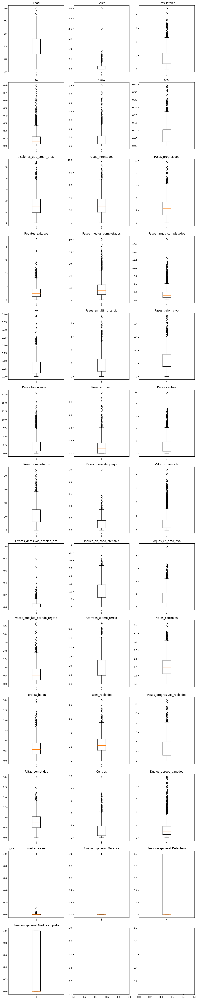

In [51]:
boxplots(df_futbol_vectorizado)

Vemos un outlier en los precios de mercado, los eliminamos para borrar el ruido en el modelo

7077 38


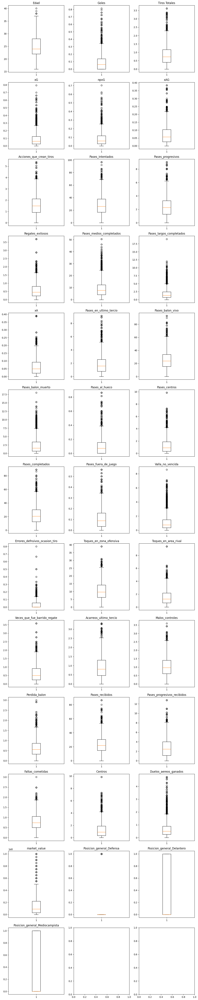

In [52]:
#Eliminamos outliers de precio
df_futbol_vectorizado = df_futbol_vectorizado[df_futbol_vectorizado["market_value"] <= 100e6]
#Volcemos a verificar distribuciones
boxplots(df_futbol_vectorizado)

### Eliminacion Variables de Varianza 0
Eliminamos estos datos porque no aportan al modelo

X_train: (5661, 36) | X_test: (1416, 36)
R2_train      5.339779e-01
R2_test       5.007115e-01
RMSE_train    1.507433e+14
RMSE_test     1.640340e+14
MAE_train     8.765691e+06
MAE_test      9.195540e+06
MAPE_train    2.375061e+02
MAPE_test     2.295542e+02
dtype: float64
R² = 0.534
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 12,277,757.31
Residuo máximo: 67,896,973.62


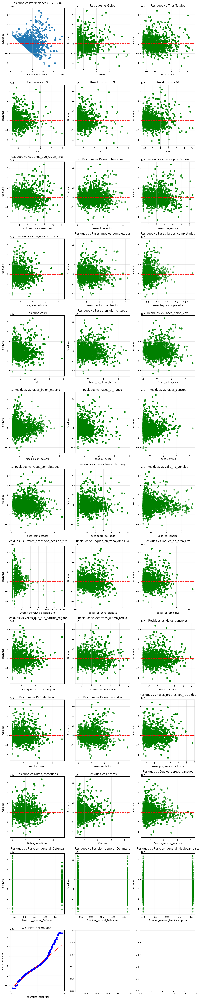

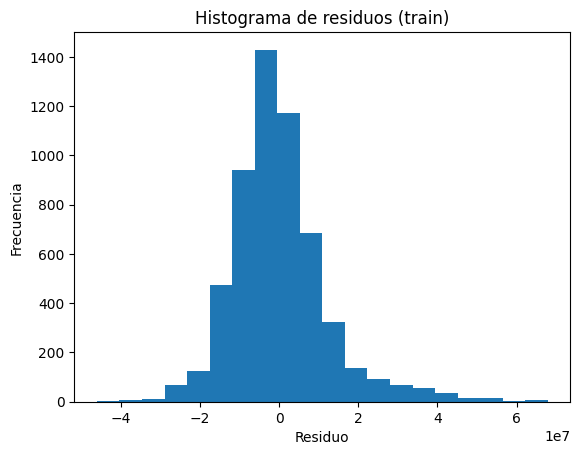

Posibles outliers por |residuo estandarizado|>3: 101
Indices de outliers:Index([5982, 5075, 6832, 5547, 3510, 5980,  418, 4458, 5073, 1084,
       ...
       1061,  881, 5543, 6745, 5461, 3512, 5879,  424, 1329, 4455],
      dtype='int64', length=101)


In [53]:
from sklearn.feature_selection import VarianceThreshold
#Borramos columnas de varianza 0(que no aportan al modelo)
selector = VarianceThreshold(threshold=0)
jugadores=df_futbol_vectorizado["Jugador"]
df_auxiliar=df_futbol_vectorizado.drop(columns=["Jugador"])
matriz_limpia = selector.fit_transform(df_auxiliar)
columnas_mantenidas = selector.get_feature_names_out()
df_auxiliar=pd.DataFrame(matriz_limpia, columns=columnas_mantenidas)
#Creamos el modelo y lo evaluamos
lasso,residuos,outliers,scaler=modelo_evaluacion(df_auxiliar)
df_auxiliar_no_market_value=df_auxiliar.drop(columns=["market_value"])
#Guardamos las predicciones
array_predicciones=lasso.predict(df_auxiliar_no_market_value)
df_predicho = pd.DataFrame(array_predicciones, columns=["valores"])
df_predicho["Jugador"]=jugadores


### Selección de Variables

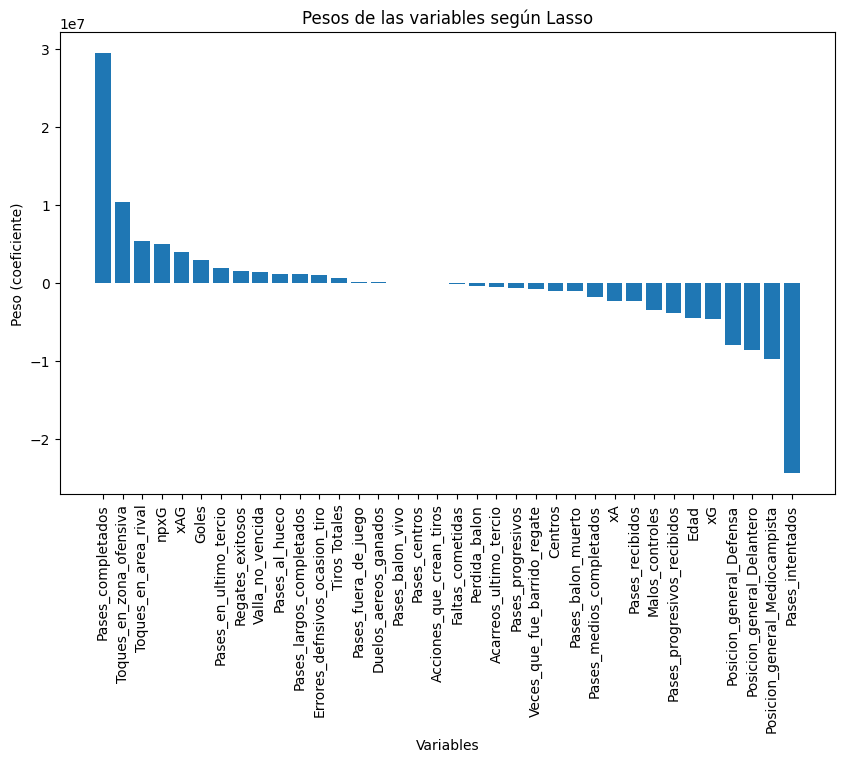

In [54]:
#Analizamos los pesos asignados por el algoritmo Lasso
coef = lasso.coef_
features = df_futbol_vectorizado.columns.tolist()  # nombres de las variables
features.remove('market_value')
features.remove("Jugador")
# Armamos DataFrame para ordenarlos
coef_df = pd.DataFrame({
    "Variable": features,
    "Peso": coef
}).sort_values(by="Peso", ascending=False)

# Gráfico de barras
plt.figure(figsize=(10,6))
plt.bar(coef_df["Variable"], coef_df["Peso"])
plt.xticks(rotation=90)
plt.xlabel("Variables")
plt.ylabel("Peso (coeficiente)")
plt.title("Pesos de las variables según Lasso")
plt.show()


Matriz de correlación (sin nacionalidad): (37, 37)


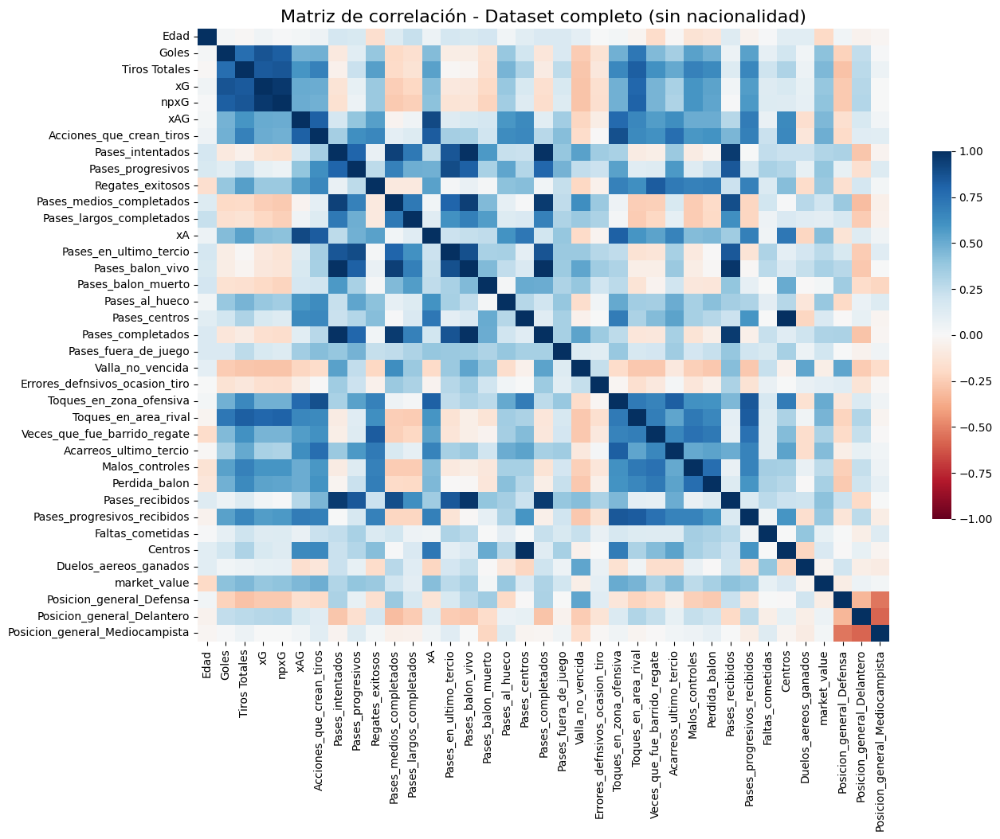

In [55]:
columnas_eliminar=[c for c in df_futbol_vectorizado.columns if c.startswith("Nacionalidad_")]
columnas_eliminar.append("Jugador")
df_sin_nacionalidad = df_futbol_vectorizado.drop(
    columns=columnas_eliminar,
    errors="ignore"
)

# Calculamos la matriz de correlación sin nacionalidad
corr_matrix_total_clean = df_sin_nacionalidad.corr()

# Revisamos dimensiones
print("Matriz de correlación (sin nacionalidad):", corr_matrix_total_clean.shape)

# Graficamos
plt.figure(figsize=(14,10))
sns.heatmap(corr_matrix_total_clean,
            cmap="RdBu",
            center=0,
            vmin=-1, vmax=1,
            annot=False,
            cbar_kws={"shrink": .6})
plt.title("Matriz de correlación - Dataset completo (sin nacionalidad)", fontsize=16)
plt.show()

## Análisis de primera iteración
Vemos que se tiene colinealidad tanto con el VIF como con la matriz de correlación, solucionamos esto para ajustar nuestro modelo y ver si se cumplen los supuestos de regresión lineal

In [56]:
df_futbol_vectorizado.drop(columns=["npxG","Pases_intentados","Pases_balon_vivo","Pases_recibidos","Centros","Pases_completados","Pases_medios_completados"], inplace=True)

X_train: (5661, 29) | X_test: (1416, 29)
R2_train      5.133035e-01
R2_test       4.851658e-01
RMSE_train    1.574308e+14
RMSE_test     1.691414e+14
MAE_train     8.968279e+06
MAE_test      9.349844e+06
MAPE_train    2.387633e+02
MAPE_test     2.305987e+02
dtype: float64
R² = 0.513
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 12,547,144.94
Residuo máximo: 68,274,295.47


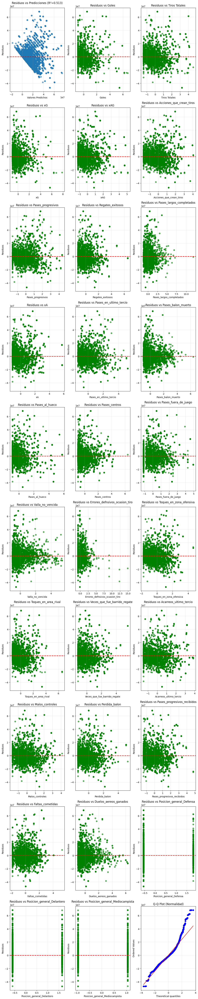

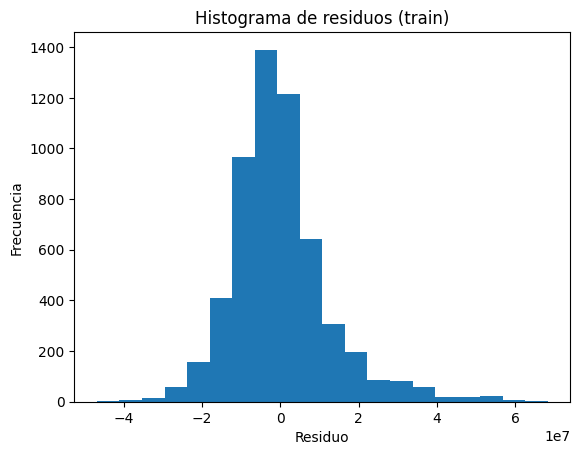

Posibles outliers por |residuo estandarizado|>3: 97
Indices de outliers:Index([5982, 5075, 6832, 5547, 3510, 5980,  418, 5073, 1084, 5875, 1643, 1642,
       5878, 5874,  428, 3852, 4905, 6831,  425, 5872, 1063, 1086, 5072, 3850,
       5881, 1330, 1062,  313, 3508, 5141, 6748,  878,  883, 3521, 1650, 5544,
        423, 4906, 5876, 4901, 5978, 3880, 5539, 1640, 5546,  417, 1082, 6829,
       2281, 5977, 2953, 1331, 4383,  419, 5540, 6751, 5548, 3851, 1328, 6744,
       1327, 3509, 1060, 6743, 3519, 5542,  312, 5545, 5981, 1645, 4382,  880,
       1648, 1646, 4902, 5871, 1641, 1081, 5873, 6746, 6747, 3518, 4384, 3881,
       1649, 1647, 5880, 4904, 1061,  881, 5543, 6745, 5461, 3512, 5879,  424,
       1329],
      dtype='int64')


In [57]:
selector = VarianceThreshold(threshold=0)
df_auxiliar=df_futbol_vectorizado.drop(columns=["Jugador"])
matriz_limpia = selector.fit_transform(df_auxiliar)
columnas_mantenidas = selector.get_feature_names_out()
df_auxiliar=pd.DataFrame(matriz_limpia, columns=columnas_mantenidas)

lasso,residuos,outliers,scaler=modelo_evaluacion(df_auxiliar)
df_auxiliar_no_market_value=df_auxiliar.drop(columns=["market_value"])
array_predicciones=lasso.predict(df_auxiliar_no_market_value)

df_predicho = pd.DataFrame(array_predicciones, columns=["valores"])
df_predicho["Jugador"]=jugadores

Volvemos a verificar los pesos asignados por el modelo

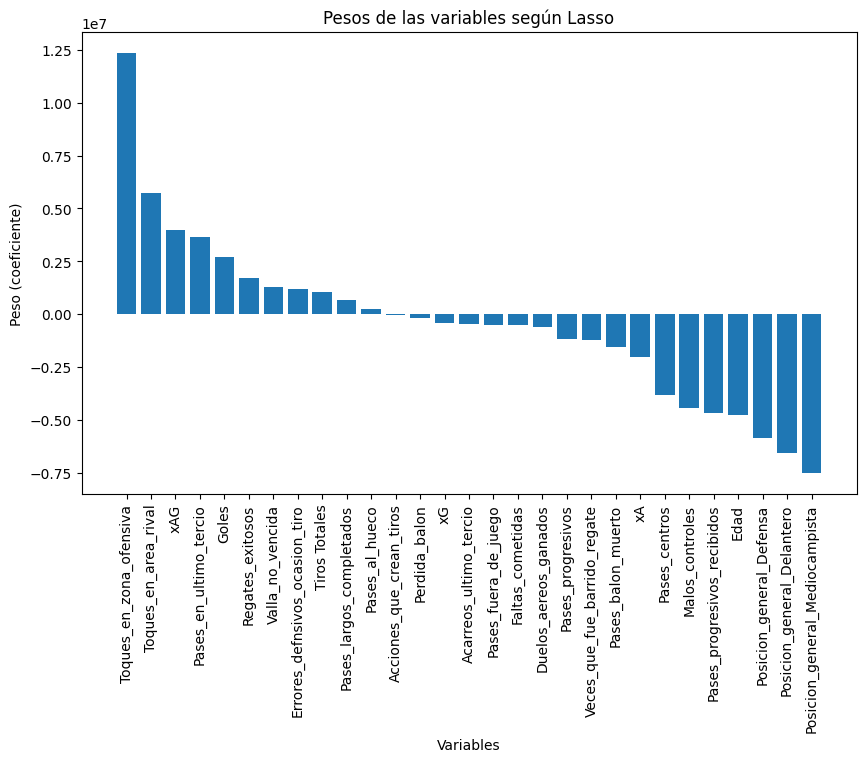

['Edad',
 'Goles',
 'Tiros Totales',
 'xG',
 'xAG',
 'Acciones_que_crean_tiros',
 'Pases_progresivos',
 'Regates_exitosos',
 'Pases_largos_completados',
 'xA',
 'Pases_en_ultimo_tercio',
 'Pases_balon_muerto',
 'Pases_al_hueco',
 'Pases_centros',
 'Pases_fuera_de_juego',
 'Valla_no_vencida',
 'Errores_defnsivos_ocasion_tiro',
 'Toques_en_zona_ofensiva',
 'Toques_en_area_rival',
 'Veces_que_fue_barrido_regate',
 'Acarreos_ultimo_tercio',
 'Malos_controles',
 'Perdida_balon',
 'Pases_progresivos_recibidos',
 'Faltas_cometidas',
 'Duelos_aereos_ganados',
 'Posicion_general_Defensa',
 'Posicion_general_Delantero',
 'Posicion_general_Mediocampista']

In [58]:
coef = lasso.coef_
features = df_futbol_vectorizado.columns.tolist()  # nombres de las variables
features.remove('market_value')
features.remove("Jugador")
# Armamos DataFrame para ordenarlos
coef_df = pd.DataFrame({
    "Variable": features,
    "Peso": coef
}).sort_values(by="Peso", ascending=False)

# Gráfico de barras
plt.figure(figsize=(10,6))
plt.bar(coef_df["Variable"], coef_df["Peso"])
plt.xticks(rotation=90)
plt.xlabel("Variables")
plt.ylabel("Peso (coeficiente)")
plt.title("Pesos de las variables según Lasso")
plt.show()
features

## Construcción del pipeline, modelo final

Teniendo en cuenta las operaciones necesarias para evaluar y generar predicciones, construimos el pipeline que requerimos

In [59]:
def transformar_posicion(posicion):
    if "," in posicion:
        posiciones = posicion.split(",")
        return posiciones[0]
    else:
        return posicion


from sklearn.pipeline import Pipeline


variables=["Jugador",'Edad',"Posicion",'Goles','Tiros Totales','xG','xAG','Acciones_que_crean_tiros','Pases_progresivos',
        'Regates_exitosos','Pases_largos_completados','xA','Pases_en_ultimo_tercio','Pases_balon_muerto','Pases_al_hueco',
        'Pases_centros','Pases_fuera_de_juego','Valla_no_vencida','Errores_defnsivos_ocasion_tiro','Toques_en_zona_ofensiva',
        'Toques_en_area_rival','Veces_que_fue_barrido_regate','Acarreos_ultimo_tercio','Malos_controles','Perdida_balon',
        'Pases_progresivos_recibidos','Faltas_cometidas','Duelos_aereos_ganados']

agg_funcs = {}

for col in variables:
    if col in ["Edad"]:
        agg_funcs[col] = "first"
    elif pd.api.types.is_numeric_dtype(df_futbol[col]):
        #agg_funcs[col]= ["sum","mean","min","max"]
        agg_funcs[col]= "mean"
    elif col=='Posicion':
        agg_funcs[col] = lambda x: ", ".join(x.astype(str).unique())

class MiPipeline(Pipeline):
    def __init__(self, modelo=None):
        self.modelo = modelo if modelo is not None else Lasso()
    def fit(self, X, y=None):
        pass

    def predict(self, X, **predict_params):
        X_original=X.copy()

        X=X[variables]
        X=X.groupby('Jugador').agg(agg_funcs).reset_index()
        X["Posicion"]=X["Posicion"].apply(transformar_posicion)
        X['Edad'] = pd.to_numeric(X['Edad'].str.split('-').str[0], errors='coerce')
        nombres_posiciones = {
            'GK': 'Arquero',
            'CB': 'Defensa',
            'RB': 'Defensa',
            'LB': 'Defensa',
            'WB': 'Defensa',
            'CM': 'Mediocampista',
            'DM': 'Mediocampista',
            'AM': 'Mediocampista',
            'LM': 'Mediocampista',
            'RM': 'Mediocampista',
            'FW': 'Delantero',
            'ST': 'Delantero',
            'CF': 'Delantero',
            'LW': 'Delantero',
            'RW': 'Delantero'
        }

        #Nueva columna del df con la posición ya mapeada para poder graficar
        #En otros estan los no incluidos, o los jugadores que juegan varias posiciones
        X['Posicion_general'] = X['Posicion'].map(nombres_posiciones).fillna('Otros')
        #Hacemos la codificacion
        ohe = OneHotEncoder(sparse_output=False, drop="first", handle_unknown='ignore')
        encoded = ohe.fit_transform(X[['Posicion_general']])

        #Inicializamos el encoder
        X_codificador = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(categoricas_vectorizar))
        X_copia=X.copy()
        X.drop(columns=["Jugador"],inplace=True)
        X = pd.concat( [X.drop(columns= ["Posicion",'Posicion_general']).reset_index(drop=True), X_codificador.reset_index(drop=True)], axis=1)
        columnas=X.columns
        X = pd.DataFrame(scaler.transform(X), columns=columnas)
        #Count NaN values
        X = X.fillna(X.mean(numeric_only=True))
        X["prediccion"] = self.modelo.predict(X)
        X["Jugador"] =X_copia["Jugador"]
        df_predicciones=X_original.merge(X[["Jugador","prediccion"]], on="Jugador")
        return df_predicciones["prediccion"]

X = pd.read_csv('./datos_validacion_laboratorio1(test_data).csv')
pipe = MiPipeline(modelo=lasso)
pipe.fit(X,X) #No importante, usamos el modelo ya entrenado con los datos de arriba



Text(0.5, 1.0, 'Dispersion de datos predichos')

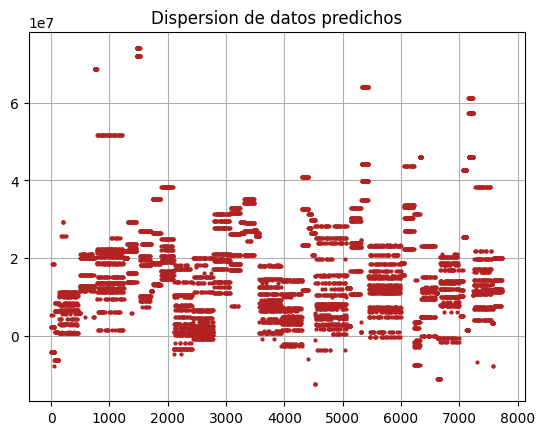

In [60]:
plt.plot(pipe.predict(X),linestyle="",marker="o", label='Predicción',color="firebrick",markersize=2)
plt.grid()
plt.title("Dispersion de datos predichos")

In [61]:
import joblib
joblib.dump(pipe, "pipeline_entrenado.joblib")


['pipeline_entrenado.joblib']

Text(0.5, 1.0, 'Dispersion de datos predichos')

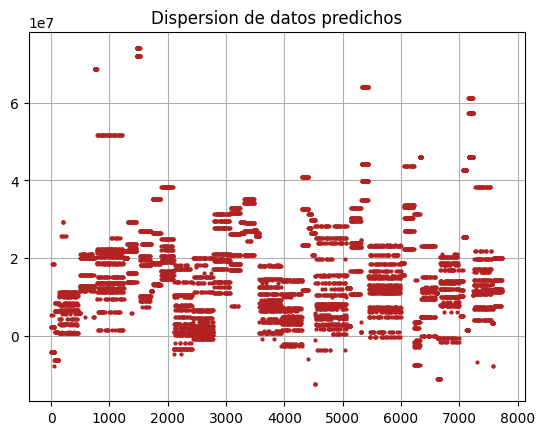

In [62]:
pipe_cargado = joblib.load("pipeline_entrenado.joblib")
plt.plot(pipe_cargado.predict(X),linestyle="",marker="o", label='Predicción',color="firebrick",markersize=2)
plt.grid()
plt.title("Dispersion de datos predichos")

# Etapa 4. Evaluación cuantitativa:
A partir de las métricas seleccionadas para evaluar y seleccionar el mejor modelo, explicar el resultado obtenido desde el punto de vista cuantitativo. Contestar a la pregunta: ¿Su equipo recomienda utilizar en producción el modelo de regresión para estimar el precio de un jugador de fútbol? ¿Por qué? En caso de no recomendar el uso del modelo, ¿qué recomendaciones haría para continuar iterando con el objetivo de la construcción de un mejor modelo?

Por el momento no se recomienda utilizar en produccion el modelo de regresion, pues a pesar de buenos resultados obtenidos con respecto a su precision (Evidenciado por el R2) no podemos verificar la veracidad del mismo, en tanto no hemos comprobado aun los supuestos de regresion, la confirmacion de estos nos permitiria visualizar que tan confiable es el modelo, más alla de sus metricas de precision.

Ya dependiendo de la validacion de los supuestos, si se llegan a comprobar todos o si algunos no se logran comprobar, cambiaria el alcance que tendria el modelo de regresion lineal para predecir los datos.

Por lo cual la primera recomendacion antes de cualquier otra cosa, es verificar los supuestos y definir el alcance del modelo

# Etapa 5. Evaluación cualitativa: 



## Validación de supuestos
Realizar los ajustes necesarios para que el modelo cumpla con los supuestos necesarios para la inferencia estadística con regresiones.

### 5.1. Colinealidad
Es necesario que las columnas utilizadas no tengan (o tengan muy poca) colinealidad (correlación).

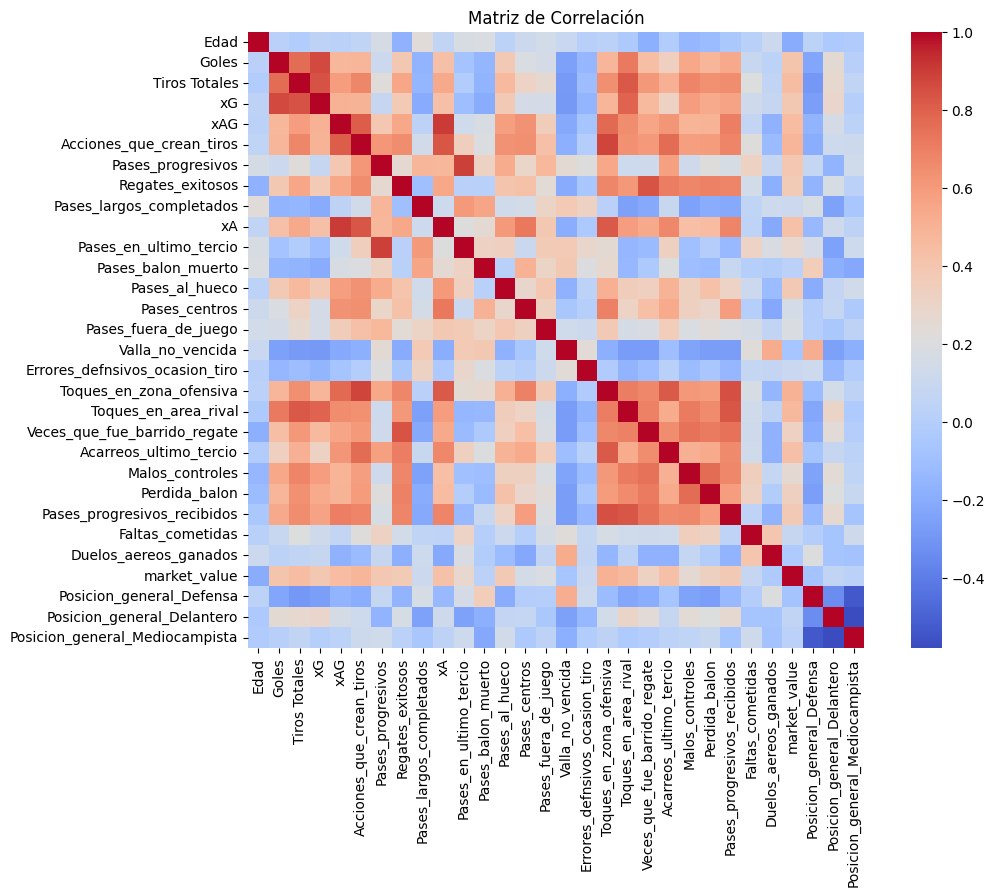

In [63]:
# Eliminar la columna "Jugador" para evitar conflicto de strings
df_sinjugadores = df_futbol_vectorizado.copy()
df_sinjugadores.drop(columns=["Jugador"], inplace=True)


#Matrix de correlacion
matriz_correlacion = df_sinjugadores.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matriz_correlacion, annot=False, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Matriz de Correlación")
plt.show()


In [64]:
# Encontrar parejas de variables con correlación mayor a 0.8
correlaciones_altas = []

# Recorrer la matriz de correlación
for i in range(len(matriz_correlacion.columns)):
    for j in range(i+1, len(matriz_correlacion.columns)):
        var1 = matriz_correlacion.columns[i]
        var2 = matriz_correlacion.columns[j]
        correlacion = abs(matriz_correlacion.iloc[i, j])
        
        if correlacion > 0.8:
            correlaciones_altas.append((var1, var2, correlacion))

# Ordenar por correlación descendente
correlaciones_altas.sort(key=lambda x: x[2], reverse=True)

# Imprimir las parejas
print("Parejas de variables con correlación > 0.8:")
print("-" * 60)
for var1, var2, corr in correlaciones_altas:
    print(f"{var1} - {var2}: {corr:.3f}")

Parejas de variables con correlación > 0.8:
------------------------------------------------------------
xAG - xA: 0.905
Pases_progresivos - Pases_en_ultimo_tercio: 0.895
Acciones_que_crean_tiros - Toques_en_zona_ofensiva: 0.877
Goles - xG: 0.866
Toques_en_zona_ofensiva - Pases_progresivos_recibidos: 0.850
Tiros Totales - xG: 0.842
Regates_exitosos - Veces_que_fue_barrido_regate: 0.834
Acciones_que_crean_tiros - xA: 0.832
Toques_en_area_rival - Pases_progresivos_recibidos: 0.828
Tiros Totales - Toques_en_area_rival: 0.824
Toques_en_zona_ofensiva - Acarreos_ultimo_tercio: 0.820
xA - Toques_en_zona_ofensiva: 0.817
xAG - Acciones_que_crean_tiros: 0.815


Variance Inflation Factor (VIF) por variable:
                          Variable        VIF
17         Toques_en_zona_ofensiva  73.874888
6                Pases_progresivos  52.102577
5         Acciones_que_crean_tiros  37.585911
0                             Edad  36.764342
10          Pases_en_ultimo_tercio  29.507831
23     Pases_progresivos_recibidos  29.353693
18            Toques_en_area_rival  27.539780
28  Posicion_general_Mediocampista  21.078488
9                               xA  20.839556
2                    Tiros Totales  19.310504
4                              xAG  16.540688
21                 Malos_controles  15.998751
3                               xG  14.560332
20          Acarreos_ultimo_tercio  14.266582
19    Veces_que_fue_barrido_regate  12.595625
27      Posicion_general_Delantero  12.194030
7                 Regates_exitosos  11.121543
26        Posicion_general_Defensa  10.846459
22                   Perdida_balon  10.357337
13                   Pases_centros

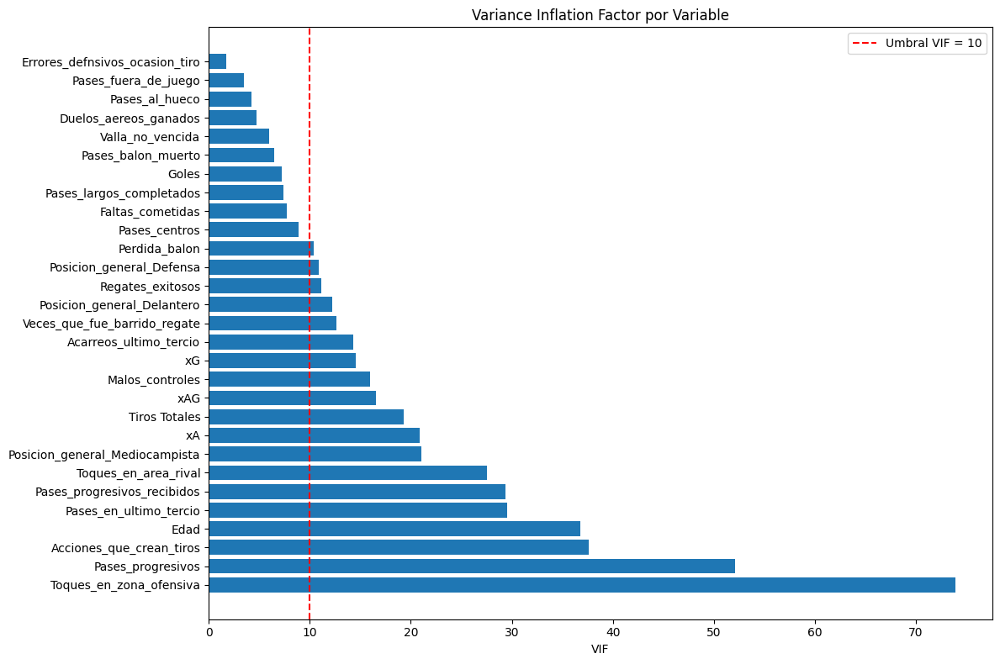

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Preparar datos para VIF - usamos el dataset sin la variable objetivo
X_vif = df_sinjugadores.drop(columns=['market_value'])

# Calcular VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

# Ordenar por VIF descendente
vif_data = vif_data.sort_values('VIF', ascending=False)

print("Variance Inflation Factor (VIF) por variable:")
print("=" * 50)
print(vif_data)

# Identificar variables con VIF alto (>10 indica alta colinealidad)
vif_alto = vif_data[vif_data['VIF'] > 10]
print(f"\nVariables con VIF > 10 (alta colinealidad): {len(vif_alto)}")
print(vif_alto)

# Graficar los VIF
plt.figure(figsize=(12, 8))
plt.barh(vif_data['Variable'], vif_data['VIF'])
plt.xlabel('VIF')
plt.title('Variance Inflation Factor por Variable')
plt.axvline(x=10, color='red', linestyle='--', label='Umbral VIF = 10')
plt.legend()
plt.tight_layout()
plt.show()

#### Correccion Colinealidad

Hemos identificado varias variables con altos niveles de multicolinealidad, las cuales se vuelven redundantes dentro del modelo, vamos a proceder a escoger las mas interpretativas y eliminar las otras.

Contamos con 19 variables con alta multicolinealidad

- Toques_en_zona_ofensiva  73.669831
- Pases_progresivos  51.978236
- Acciones_que_crean_tiros  37.583358
- Edad  36.816859
- Pases_en_ultimo_tercio  29.399920
- Pases_progresivos_recibidos  29.270417
- Toques_en_area_rival  27.656024
- Posicion_general_Mediocampista  21.036435
- xA  20.777033
- Tiros Totales  19.285842
- xAG  16.595647
- Malos_controles  15.949719
- xG  14.652064
- Acarreos_ultimo_tercio  14.295688
- Veces_que_fue_barrido_regate  12.710948
- Posicion_general_Delantero  12.137548
- Posicion_general_Defensa  11.176759
- Regates_exitosos  11.117479
- Perdida_balon  10.366980


A su vez que contamos con 13 parejas que tienen alta correlación

- xAG - xA: 0.905
- Pases_progresivos - Pases_en_ultimo_tercio: 0.894
- Acciones_que_crean_tiros - Toques_en_zona_ofensiva: 0.878
- Goles - xG: 0.866
- Toques_en_zona_ofensiva - Pases_progresivos_recibidos: 0.851
- Tiros Totales - xG: 0.843
- Regates_exitosos - Veces_que_fue_barrido_regate: 0.835
- Acciones_que_crean_tiros - xA: 0.833
- Toques_en_area_rival - Pases_progresivos_recibidos: 0.828
- Tiros Totales - Toques_en_area_rival: 0.825
- Toques_en_zona_ofensiva - Acarreos_ultimo_tercio: 0.821
- xA - Toques_en_zona_ofensiva: 0.818
- xAG - Acciones_que_crean_tiros: 0.816


Se iterara por cada pareja y se eliminara la variable que cuya multicolinealidad es mayor (a no ser que algun criterio de interpretabilidad nos haga decidir lo contrario)
Bajo este criterio se decide eliminar:
- xA
- Pases_progresivos
- Acciones_que_crean_tiros
- xG
- Pases_progresivos_recibidos
- Veces_que_fue_barrido_regate
- Toques_en_area_rival
- Toques_en_zona_ofensiva





In [66]:
#Eliminar dichas variables
df_postColinealidad = df_sinjugadores.copy()
df_postColinealidad = df_postColinealidad.drop(columns=[
    'xA',
    'Pases_progresivos',
    'Acciones_que_crean_tiros',
    'xG',
    'Pases_progresivos_recibidos',
    'Veces_que_fue_barrido_regate',
    'Toques_en_area_rival',
    'Toques_en_zona_ofensiva'
])
df_postColinealidad 

,Edad,Goles,Tiros Totales,xAG,Regates_exitosos,Pases_largos_completados,Pases_en_ultimo_tercio,Pases_balon_muerto,Pases_al_hueco,Pases_centros,...,Errores_defnsivos_ocasion_tiro,Acarreos_ultimo_tercio,Malos_controles,Perdida_balon,Faltas_cometidas,Duelos_aereos_ganados,market_value,Posicion_general_Defensa,Posicion_general_Delantero,Posicion_general_Mediocampista
0,19.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,700000.0,0.0,0.0,1.0
1,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
2,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
3,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
4,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7201,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,0.0,1.0
7202,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,0.0,1.0
7203,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,1.0,0.0
7204,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,1.0,0.0


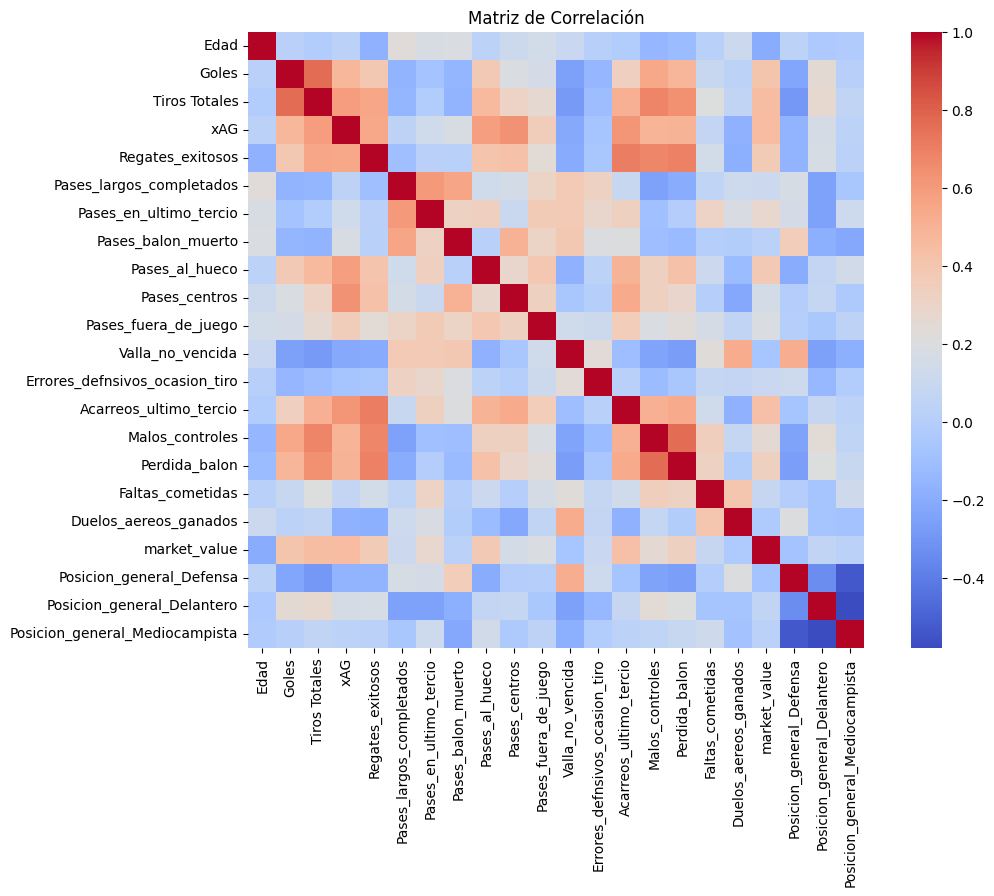

In [67]:
#Verificamos la solucion del problema de colinealidad

#Matrix de correlacion
matriz_correlacion = df_postColinealidad .corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matriz_correlacion, annot=False, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Matriz de Correlación")
plt.show()


In [68]:
# Encontrar parejas de variables con correlación mayor a 0.8
correlaciones_altas = []

# Recorrer la matriz de correlación
for i in range(len(matriz_correlacion.columns)):
    for j in range(i+1, len(matriz_correlacion.columns)):
        var1 = matriz_correlacion.columns[i]
        var2 = matriz_correlacion.columns[j]
        correlacion = abs(matriz_correlacion.iloc[i, j])
        
        if correlacion > 0.8:
            correlaciones_altas.append((var1, var2, correlacion))

# Ordenar por correlación descendente
correlaciones_altas.sort(key=lambda x: x[2], reverse=True)

# Imprimir las parejas
print("Parejas de variables con correlación > 0.8:")
print("-" * 60)
for var1, var2, corr in correlaciones_altas:
    print(f"{var1} - {var2}: {corr:.3f}")

Parejas de variables con correlación > 0.8:
------------------------------------------------------------


Revisamos el rendimiento del modelo despues de estas correcciones

X_train: (5661, 21) | X_test: (1416, 21)
R2_train      4.547692e-01
R2_test       4.387016e-01
RMSE_train    1.763648e+14
RMSE_test     1.844065e+14
MAE_train     9.594044e+06
MAE_test      9.842854e+06
MAPE_train    2.557443e+02
MAPE_test     2.226541e+02
dtype: float64
R² = 0.455
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 13,280,241.48
Residuo máximo: 74,011,858.04


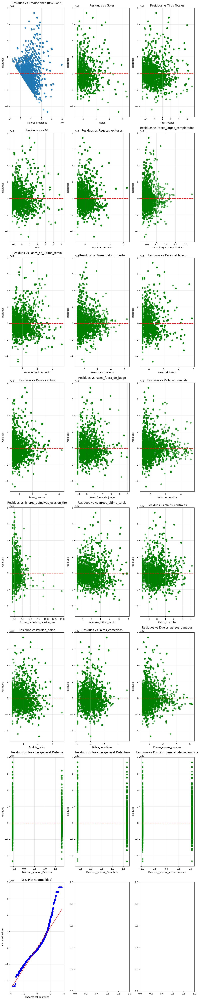

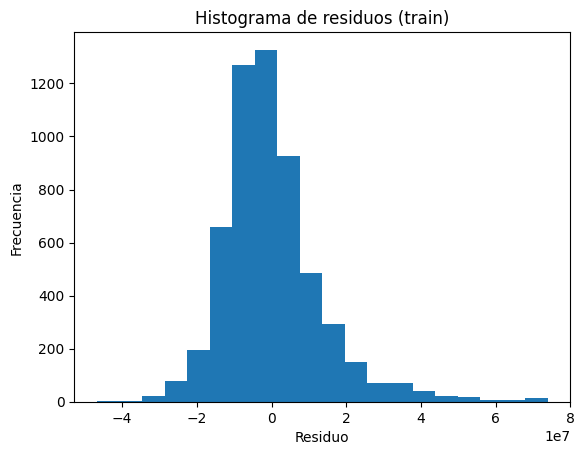

Posibles outliers por |residuo estandarizado|>3: 84
Indices de outliers:Index([6104, 5179, 6961, 5666, 4545, 6102,  418, 5177, 1096, 5997, 6000, 5996,
        428, 3920, 5002, 6960,  425, 5994, 1075, 1098, 5176, 3918, 6003, 1352,
       1074,  313, 5245, 6877,  880,  885, 3579, 5663,  423, 5003, 5998, 4998,
       6100, 5658, 5665,  417, 1094, 6958, 2332, 6099, 3004, 1353, 4468,  419,
       5659, 6880, 5667, 3919, 1350, 6873, 1349, 1072, 6872, 3577, 5661,  312,
       5664, 6103, 4467,  882, 4999, 5993, 1093, 5995, 4546, 6875, 6876, 3576,
       4469, 6002, 5001, 4547, 1073,  883, 5662, 6874, 5573, 6001,  424, 1351],
      dtype='int64')


In [69]:
lasso,residuos,outliers,scaler=modelo_evaluacion(df_postColinealidad)

Pese a que ha disminuido el R2, al reducir la multicolinealidad, el modelo se vuelve más estable y sus coeficientes más interpretables ademas de que el cumplimiento de este supuesto ayuda a garantizar validez de la regresion.

### 5.2. Linealidad
Es necesario que la relación entre cada variable de entrada y la variable objetivo sea lineal.

<Figure size 2000x1500 with 0 Axes>

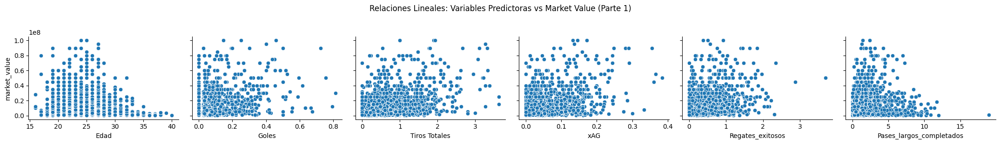

<Figure size 2000x1500 with 0 Axes>

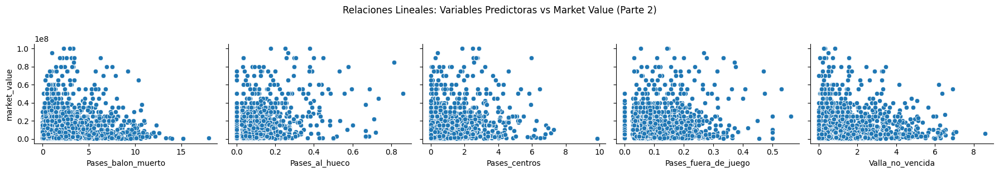

<Figure size 2000x1500 with 0 Axes>

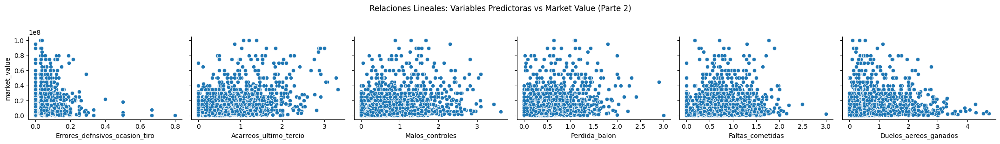

In [70]:
# Visualizar relaciones lineales entre variables predictoras y la variable objetivo


# Crear pairplot focalizando en la relación con market_value
plt.figure(figsize=(20, 15))
sns.pairplot(df_postColinealidad, 
             y_vars=["market_value"], 
             x_vars=df_postColinealidad.columns[:6],  # Primeras 6 variables para no sobrecargar
             kind="scatter",    
             height=3,
             aspect=1.2)
plt.suptitle('Relaciones Lineales: Variables Predictoras vs Market Value (Parte 1)', y=1.02)
plt.tight_layout()
plt.show()

# Segunda parte con las variables restantes
plt.figure(figsize=(20, 15))
sns.pairplot(df_postColinealidad, 
             y_vars=["market_value"], 
             x_vars=df_postColinealidad.columns[7:12],  # Variables 7 a 12
             kind="scatter", 
             height=3,
             aspect=1.2)
plt.suptitle('Relaciones Lineales: Variables Predictoras vs Market Value (Parte 2)', y=1.02)
plt.tight_layout()
plt.show()


# Segunda parte con las variables restantes
plt.figure(figsize=(20, 15))
sns.pairplot(df_postColinealidad, 
             y_vars=["market_value"], 
             x_vars=df_postColinealidad.columns[12:18],  # Variables restantes
             kind="scatter", 
             height=3,
             aspect=1.2)
plt.suptitle('Relaciones Lineales: Variables Predictoras vs Market Value (Parte 2)', y=1.02)
plt.tight_layout()
plt.show()

Despues de un analisis grafico superficial podemos evidenciar algunas tendencias no lineal con respecto a las variables predictoras, vamos a revisar de otras dos maneras, para confirmar
- Grafica de residuos contra los valores predichos. No deberia existir ningun tipo de patron dentro de estas graficas, pues si es lineal los puntos deben dispersarse de forma aleatoria alrededor de 0
- Test de Ramsey, prueba estadistica, donde si el Estadistico de Prueba da mayor al F critico, hay problema de especificacion (o problemas de linealidad)

Test de Ramsey RESET para Linealidad:
Estadístico F: 6005.1832
p-valor: 0.0000
Valor crítico (α=0.05): 2.6062

Conclusion: Se rechaza H0 - Hay evidencia de problemas de especificacion/linealidad
El modelo actual no cumple el supuesto de linealidad


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


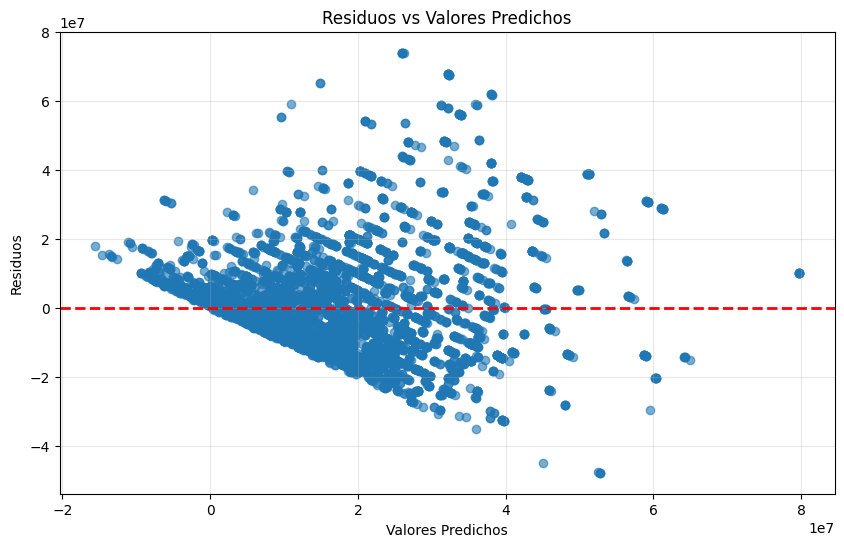

In [71]:
# Test de Ramsey para especificación del modelo
from statsmodels.stats.diagnostic import linear_reset

# Preparar los datos para el test de Ramsey
X_test = df_postColinealidad.drop(columns=['market_value'])
y_test = df_postColinealidad['market_value']

# Ajustar modelo lineal base
X_test_const = sm.add_constant(X_test)
modelo_base = sm.OLS(y_test, X_test_const).fit()

# Test de Ramsey RESET

# Realizar el test con potencias 2 y 3
reset_test = linear_reset(modelo_base, power=3)

print("Test de Ramsey RESET para Linealidad:")
print("=" * 40)
print(f"Estadístico F: {reset_test.statistic:.4f}")
print(f"p-valor: {reset_test.pvalue:.4f}")

# Para el valor crítico necesitamos los grados de libertad del modelo
df_numerador = 3  # potencias añadidas (power=3 añade x^2, x^3, x^4)
df_denominador = modelo_base.df_resid - df_numerador
print(f"Valor crítico (α=0.05): {stats.f.ppf(0.95, df_numerador, df_denominador):.4f}")

if reset_test.pvalue < 0.05:
    print("\nConclusion: Se rechaza H0 - Hay evidencia de problemas de especificacion/linealidad")
    print("El modelo actual no cumple el supuesto de linealidad")
else:
    print("\nConclusion: No se rechaza H0 - No hay evidencia suficiente de problemas de linealidad")
    print("El modelo cumple de manera significativa el supuesto de linealidad")

# Análisis adicional de residuos vs predicciones
residuos_test = modelo_base.resid
predicciones_test = modelo_base.fittedvalues

plt.figure(figsize=(10, 6))
plt.scatter(predicciones_test, residuos_test, alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.xlabel('Valores Predichos')
plt.ylabel('Residuos')
plt.title('Residuos vs Valores Predichos')
plt.grid(True, alpha=0.3)
plt.show()

Tanto el test de Ramsey como este segundo analisis grafico sobre los residuales ponen en evidencia la existencia de problemas de Especificación.

Por este motivo vamos a proceder a proponer una transformacion logartimica sobre los datos para asegurar el supuesto de linealidad. Esta transformacion tambien es beneficiosa si contamos con problemas de normalidad. Por lo que antes de ejecutar la transformacion, vamos a revisar brevemente si contamos con este tipo de problema tambien. 

Es decir, en la siguiente seccion **5.3. Normalidad** se propondra, evaluara y ejecutara las correcciones respectivas para nuestro problema actual de linealidad

### 5.3. Normalidad
Los errores deben tener una distribución normal.

#### Prueba de Normalidad
Vamos a realizar un Kolmogorov Smirnov (Debido al tamaño de los datos) para verificar la Normalidad de los Errores, la hipotesis nula en este caso es que se si se esta cumpliendo el supuesto.

Test de Kolmogorov-Smirnov para Normalidad de Residuos:
Estadístico KS: 0.088640
p-valor: 0.000000
Valor crítico (α=0.05): 0.016166

Conclusión: Se rechaza H0 - Los residuos NO siguen distribución normal
Se viola el supuesto de normalidad de los errores


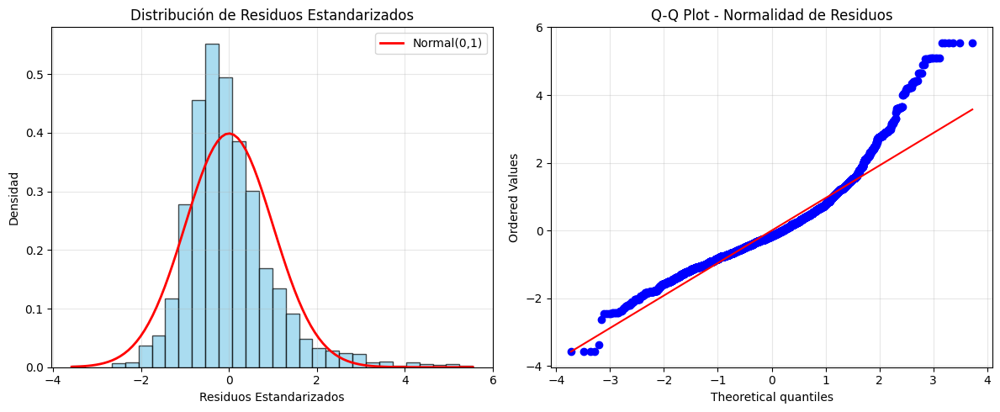

In [72]:
from scipy.stats import kstest

# Realizar test de Kolmogorov-Smirnov para normalidad de residuos
# H0: Los residuos siguen distribución normal
# H1: Los residuos no siguen distribución normal

# Estandarizar los residuos
residuos_estandarizados = (residuos_test - np.mean(residuos_test)) / np.std(residuos_test)

# Test de Kolmogorov-Smirnov
ks_stat, ks_pvalue = kstest(residuos_estandarizados, 'norm')

print("Test de Kolmogorov-Smirnov para Normalidad de Residuos:")
print("=" * 55)
print(f"Estadístico KS: {ks_stat:.6f}")
print(f"p-valor: {ks_pvalue:.6f}")

# Valor crítico para α = 0.05
n = len(residuos_estandarizados)
valor_critico = 1.36 / np.sqrt(n)  # Aproximación para muestras grandes
print(f"Valor crítico (α=0.05): {valor_critico:.6f}")

if ks_pvalue < 0.05:
    print("\nConclusión: Se rechaza H0 - Los residuos NO siguen distribución normal")
    print("Se viola el supuesto de normalidad de los errores")
else:
    print("\nConclusión: No se rechaza H0 - Los residuos siguen distribución normal")
    print("Se cumple el supuesto de normalidad de los errores")

# Visualizaciones adicionales para comprobar visualmente
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Histograma de residuos estandarizados
ax1.hist(residuos_estandarizados, bins=30, density=True, alpha=0.7, color='skyblue', edgecolor='black')
ax1.set_xlabel('Residuos Estandarizados')
ax1.set_ylabel('Densidad')
ax1.set_title('Distribución de Residuos Estandarizados')
ax1.grid(True, alpha=0.3)

# Superponer curva normal teórica (Para comprobar forma de campana en la distribucion)
x = np.linspace(residuos_estandarizados.min(), residuos_estandarizados.max(), 100)
ax1.plot(x, stats.norm.pdf(x, 0, 1), 'r-', linewidth=2, label='Normal(0,1)')
ax1.legend()

# Q-Q plot
stats.probplot(residuos_estandarizados, dist="norm", plot=ax2)
ax2.set_title('Q-Q Plot - Normalidad de Residuos')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Se ha comprobado que tampoco se esta cumpliendo el supuesto de normalidad, por lo que ya contamos con suficientes argumentos para realizar una transformacion logaritmica sobre los datos, con el fin de asegurar el cumplimiento de estos dos supuestos (Normalidad y Linealidad)

Cuando vamos a aplicar una transformacion sobre los datos, se los presentan 3 posibilidades
- Aplicar sobre la variable dependiente ("market_value")
- Aplicar sobre las variables predictoras
- Aplicar sobre tanto la variable dependiente como las variables predictoras

Vamos a hacer la transformacion sobre cada una de las posibilidades y comparar entre ellas

=== TRANSFORMACIÓN 1: Solo variable dependiente ===
X_train: (5661, 21) | X_test: (1416, 21)
R2_train      0.420190
R2_test       0.406343
RMSE_train    0.964701
RMSE_test     0.941153
MAE_train     0.773715
MAE_test      0.767869
MAPE_train    4.999047
MAPE_test     4.916322
dtype: float64
R² = 0.420
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 0.98
Residuo máximo: 6.20


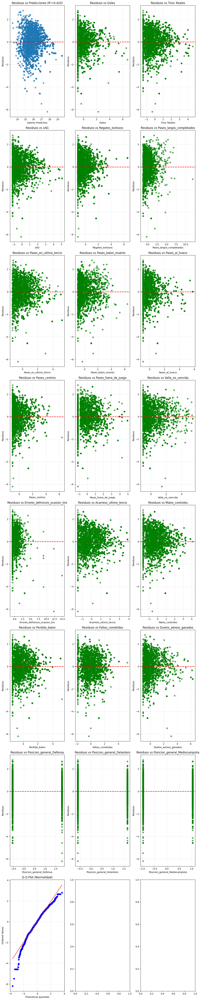

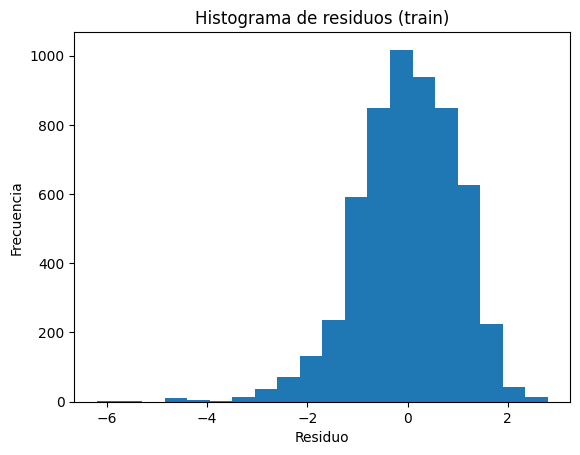

Posibles outliers por |residuo estandarizado|>3: 34
Indices de outliers:Index([5764, 5736, 3835, 1528, 4584, 4587, 1524, 1551, 3629,  976, 3004, 1526,
       3872, 5763, 5857, 4583, 1525, 5737, 1527, 4591, 4590, 5762, 4595, 5856,
       3874,  391, 4585, 1388, 2486, 5765, 1574, 4586, 4593, 4592],
      dtype='int64')
Test Normalidad - p-valor: 0.000674
Test Linealidad - p-valor: 0.000000

=== TRANSFORMACIÓN 2: Solo variables predictoras ===
X_train: (5661, 21) | X_test: (1416, 21)
R2_train      4.507531e-01
R2_test       4.342869e-01
RMSE_train    1.776639e+14
RMSE_test     1.858569e+14
MAE_train     9.607545e+06
MAE_test      9.868760e+06
MAPE_train    2.543477e+02
MAPE_test     2.221962e+02
dtype: float64
R² = 0.451
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 13,329,061.88
Residuo máximo: 74,324,297.05


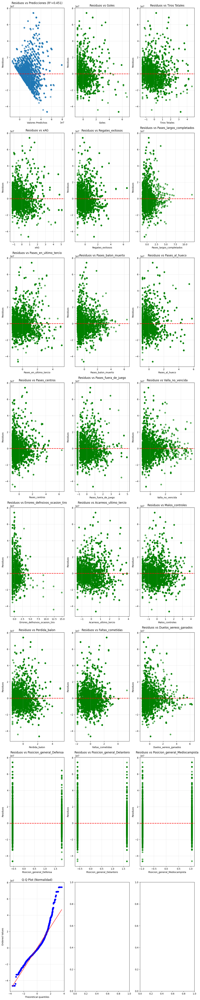

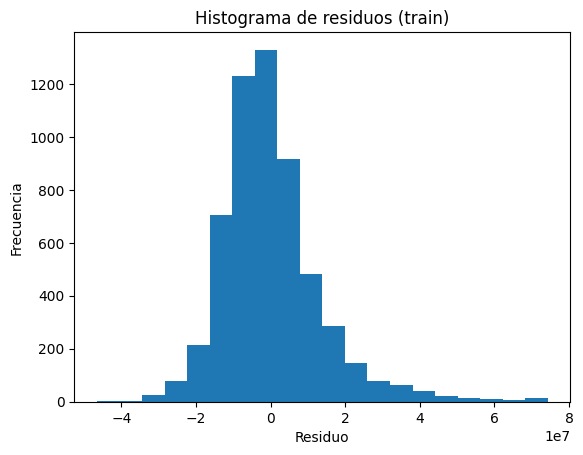

Posibles outliers por |residuo estandarizado|>3: 87
Indices de outliers:Index([6104, 5179, 6961, 5666, 4545, 6102,  418, 5177, 1096, 5997, 6181, 6000,
       5996,  428, 3920, 5002, 6960,  425, 5994, 1075, 1098, 5176, 3918, 6003,
       1352, 1074,  313, 5245, 6877,  880,  885, 3579, 5663,  423, 5003, 5998,
       4998, 6100, 5658, 5665,  417, 1094, 6958, 2332, 6099, 3004, 1353, 4468,
        419, 5659, 6880, 5667, 3919, 1350, 6873, 1349, 1072, 6872, 3577, 5661,
       6184,  312, 5664, 6103, 4467,  882, 6180, 4999, 5993, 1093, 5995, 4546,
       6875, 6876, 3576, 4469, 6002, 5001, 4547, 1073,  883, 5662, 6874, 5573,
       6001,  424, 1351],
      dtype='int64')
Test Normalidad - p-valor: 0.000000
Test Linealidad - p-valor: 0.000000

=== TRANSFORMACIÓN 3: Variable dependiente y predictoras ===
X_train: (5661, 21) | X_test: (1416, 21)
R2_train      0.411055
R2_test       0.395869
RMSE_train    0.979901
RMSE_test     0.957757
MAE_train     0.780805
MAE_test      0.775761
MAPE_train    5

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


R² = 0.411
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 0.99
Residuo máximo: 6.20


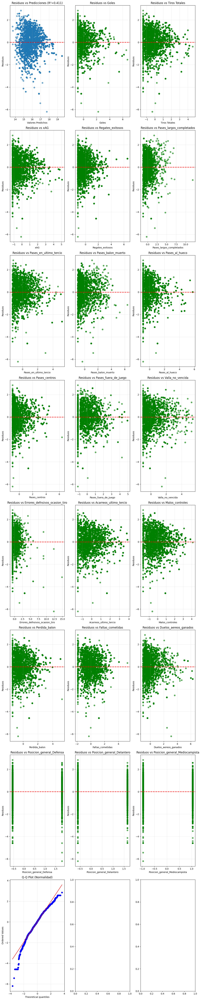

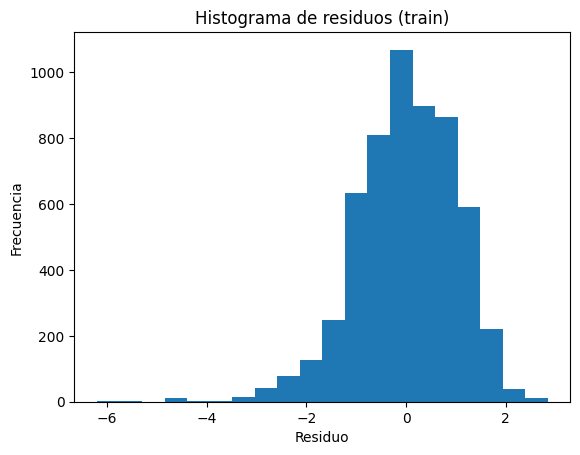

Posibles outliers por |residuo estandarizado|>3: 34
Indices de outliers:Index([5764, 5736, 3835, 1528, 4584, 4587, 1524, 1551, 3629,  976, 3004, 1526,
       3872, 5763, 5857, 4583, 1525, 5737, 1527, 4591, 4590, 5762, 4595, 5856,
       3874,  391, 4585, 1388, 2486, 5765, 1574, 4586, 4593, 4592],
      dtype='int64')
Test Normalidad - p-valor: 0.000351
Test Linealidad - p-valor: 0.000000

RESUMEN DE RESULTADOS:
Transformación | Normalidad (p-val) | Linealidad (p-val)
Solo Y         | 0.000674        | 0.000000
Solo X         | 0.000000        | 0.000000
Ambas          | 0.000351        | 0.000000

Nota: p-value > 0.05 indica cumplimiento del supuesto


In [73]:
# Aplicar transformación logarítmica de las 3 formas posibles y verificar supuestos

# 1. Transformación solo en la variable dependiente (market_value)
print("=== TRANSFORMACIÓN 1: Solo variable dependiente ===")
df_log_y = df_postColinealidad.copy()
df_log_y['market_value'] = np.log(df_log_y['market_value'])

lasso_log_y, residuos_log_y, outliers_log_y, scaler_log_y = modelo_evaluacion(df_log_y)

# Test de normalidad para residuos
residuos_estand_y = (residuos_log_y - np.mean(residuos_log_y)) / np.std(residuos_log_y)
ks_stat_y, ks_pvalue_y = kstest(residuos_estand_y, 'norm')
print(f"Test Normalidad - p-valor: {ks_pvalue_y:.6f}")

# Test de linealidad
X_log_y = df_log_y.drop(columns=['market_value'])
y_log_y = df_log_y['market_value']
X_log_y_const = sm.add_constant(X_log_y)
modelo_log_y = sm.OLS(y_log_y, X_log_y_const).fit()
reset_test_y = linear_reset(modelo_log_y, power=3)
print(f"Test Linealidad - p-valor: {reset_test_y.pvalue:.6f}")

print("\n" + "="*60)

# 2. Transformación solo en variables predictoras
print("=== TRANSFORMACIÓN 2: Solo variables predictoras ===")
df_log_x = df_postColinealidad.copy()

# Aplicar log a variables numéricas positivas (excluyendo market_value)
variables_numericas = df_log_x.select_dtypes(include=[np.number]).columns.tolist()
variables_numericas.remove('market_value')

for var in variables_numericas:
    if (df_log_x[var] > 0).all():  # Solo si todos los valores son positivos
        df_log_x[var] = np.log(df_log_x[var] + 1)  # +1 para evitar log(0)

lasso_log_x, residuos_log_x, outliers_log_x, scaler_log_x = modelo_evaluacion(df_log_x)

# Test de normalidad
residuos_estand_x = (residuos_log_x - np.mean(residuos_log_x)) / np.std(residuos_log_x)
ks_stat_x, ks_pvalue_x = kstest(residuos_estand_x, 'norm')
print(f"Test Normalidad - p-valor: {ks_pvalue_x:.6f}")

# Test de linealidad
X_log_x = df_log_x.drop(columns=['market_value'])
y_log_x = df_log_x['market_value']
X_log_x_const = sm.add_constant(X_log_x)
modelo_log_x = sm.OLS(y_log_x, X_log_x_const).fit()
reset_test_x = linear_reset(modelo_log_x, power=3)
print(f"Test Linealidad - p-valor: {reset_test_x.pvalue:.6f}")

print("\n" + "="*60)

# 3. Transformación en ambas (variable dependiente y predictoras)
print("=== TRANSFORMACIÓN 3: Variable dependiente y predictoras ===")
df_log_both = df_postColinealidad.copy()

# Log en market_value
df_log_both['market_value'] = np.log(df_log_both['market_value'])

# Log en variables predictoras numéricas positivas
variables_numericas = df_log_both.select_dtypes(include=[np.number]).columns.tolist()
variables_numericas.remove('market_value')

for var in variables_numericas:
    if (df_log_both[var] > 0).all():
        df_log_both[var] = np.log(df_log_both[var] + 1)

lasso_log_both, residuos_log_both, outliers_log_both, scaler_log_both = modelo_evaluacion(df_log_both)

# Test de normalidad
residuos_estand_both = (residuos_log_both - np.mean(residuos_log_both)) / np.std(residuos_log_both)
ks_stat_both, ks_pvalue_both = kstest(residuos_estand_both, 'norm')
print(f"Test Normalidad - p-valor: {ks_pvalue_both:.6f}")

# Test de linealidad
X_log_both = df_log_both.drop(columns=['market_value'])
y_log_both = df_log_both['market_value']
X_log_both_const = sm.add_constant(X_log_both)
modelo_log_both = sm.OLS(y_log_both, X_log_both_const).fit()
reset_test_both = linear_reset(modelo_log_both, power=3)
print(f"Test Linealidad - p-valor: {reset_test_both.pvalue:.6f}")

print("\n" + "="*60)
print("RESUMEN DE RESULTADOS:")
print("=" * 30)
print("Transformación | Normalidad (p-val) | Linealidad (p-val)")
print(f"Solo Y         | {ks_pvalue_y:.6f}        | {reset_test_y.pvalue:.6f}")
print(f"Solo X         | {ks_pvalue_x:.6f}        | {reset_test_x.pvalue:.6f}")
print(f"Ambas          | {ks_pvalue_both:.6f}        | {reset_test_both.pvalue:.6f}")
print("\nNota: p-value > 0.05 indica cumplimiento del supuesto")

Pese a la comparacion de los diferentes tipos de transformaciones logaritmicas aplicadas sobre los datos, los supuestos de normalidad y linealidad no se cumplieron estadisticamente. Esto puede sugerir a que el problema no esta limitado a la escala de las variables, sino tambien a la forma funcional del modelo. Con esto se abre el siguiente debate:

- ¿Que otras transformaciones deberiamos aplicar?
- ¿Es posible que una regresion lineal no sea la mejor alternativa para un modelo predictivo de los datos?
- ¿Podemos ignorar estos supuestos?

Con respecto a la primera pregunta, vamos a hacer una nueva propuesta de "transformacion", vamos a hacer una transformacion  Bxo.Cox que reduce asimetria y outlier moderados

=== TRANSFORMACIÓN BOX-COX ===
1. Box-Cox solo en variable dependiente:
Lambda óptimo para market_value: 0.1179
X_train: (5661, 21) | X_test: (1416, 21)
R2_train       0.449304
R2_test        0.435849
RMSE_train    37.778772
RMSE_test     37.423387
MAE_train      4.894507
MAE_test       4.900431
MAPE_train    10.995050
MAPE_test     10.792799
dtype: float64
R² = 0.449
Media de residuos: 0.000000 (debe ser ≈0)
Desviación estándar: 6.15
Residuo máximo: 36.28


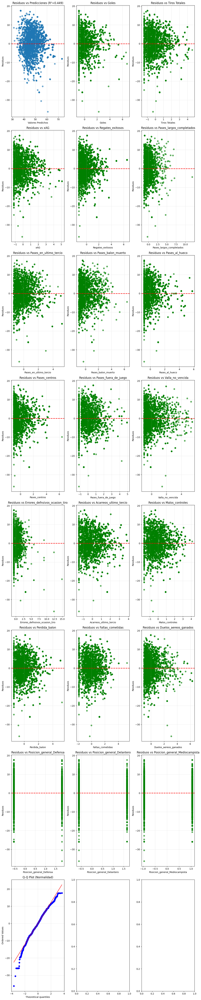

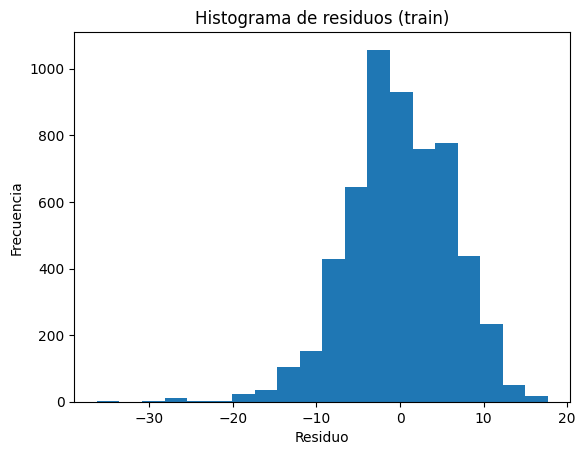

Posibles outliers por |residuo estandarizado|>3: 31
Indices de outliers:Index([5736, 3835,  418, 1528, 4584, 4587, 1524, 1551,  417, 3629, 3004, 1526,
       3872,  419, 5857, 4583, 1525, 5737, 1527, 4591, 4590, 4595, 5856, 3874,
        391, 4585, 1388, 2486, 4586, 4593, 4592],
      dtype='int64')
Test Normalidad - p-valor: 0.004155
Test Linealidad - p-valor: 0.000000

2. Box-Cox en variables predictoras:
Lambdas para variables predictoras: 1 variables transformadas
X_train: (5661, 21) | X_test: (1416, 21)
R2_train      4.501945e-01
R2_test       4.336849e-01
RMSE_train    1.778446e+14
RMSE_test     1.860547e+14
MAE_train     9.609388e+06
MAE_test      9.872246e+06
MAPE_train    2.541710e+02
MAPE_test     2.221669e+02
dtype: float64
R² = 0.450
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 13,335,838.28
Residuo máximo: 74,365,083.03


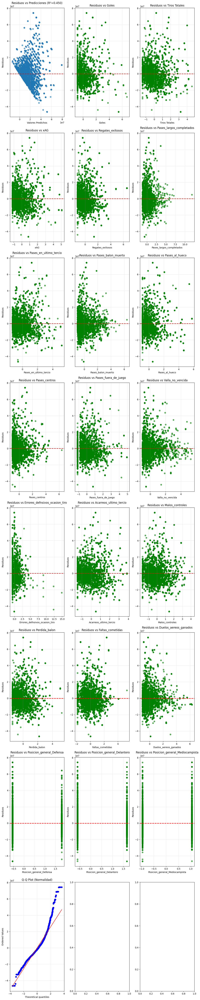

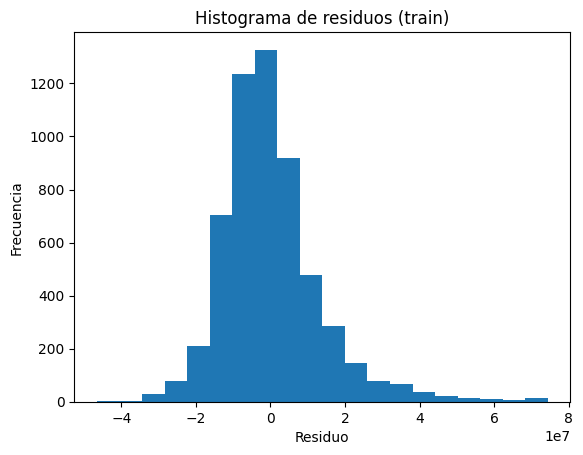

Posibles outliers por |residuo estandarizado|>3: 87
Indices de outliers:Index([6104, 5179, 6961, 5666, 4545, 6102,  418, 5177, 1096, 5997, 6181, 6000,
       5996,  428, 3920, 5002, 6960,  425, 5994, 1075, 1098, 5176, 3918, 6003,
       1352, 1074,  313, 5245, 6877,  880,  885, 3579, 5663,  423, 5003, 5998,
       4998, 6100, 5658, 5665,  417, 1094, 6958, 2332, 6099, 3004, 1353, 4468,
        419, 5659, 6880, 5667, 3919, 1350, 6873, 1349, 1072, 6872, 3577, 5661,
       6184,  312, 5664, 6103, 4467,  882, 6180, 4999, 5993, 1093, 5995, 4546,
       6875, 6876, 3576, 4469, 6002, 5001, 4547, 1073,  883, 5662, 6874, 5573,
       6001,  424, 1351],
      dtype='int64')
Test Normalidad - p-valor: 0.000000
Test Linealidad - p-valor: 0.000000

RESUMEN DE RESULTADOS CON BOX-COX:
Transformación | Normalidad (p-val) | Linealidad (p-val)
Box-Cox Y      | 0.004155        | 0.000000
Box-Cox X      | 0.000000        | 0.000000

Comparación con transformaciones anteriores:
Log Y          | 0.000674    

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


In [74]:
from scipy.stats import boxcox
from scipy.optimize import minimize_scalar
from statsmodels.stats.diagnostic import linear_reset

# Aplicar transformación Box-Cox a las variables predictoras y/o variable dependiente
print("=== TRANSFORMACIÓN BOX-COX ===")

# 1. Box-Cox solo en la variable dependiente
print("1. Box-Cox solo en variable dependiente:")
df_boxcox_y = df_postColinealidad.copy()

# Aplicar Box-Cox a market_value (debe ser positiva)
market_value_boxcox, lambda_y = boxcox(df_boxcox_y['market_value'])
df_boxcox_y['market_value'] = market_value_boxcox

print(f"Lambda óptimo para market_value: {lambda_y:.4f}")

# Evaluar modelo
lasso_boxcox_y, residuos_boxcox_y, outliers_boxcox_y, scaler_boxcox_y = modelo_evaluacion(df_boxcox_y)

# Test de normalidad
residuos_estand_boxcox_y = (residuos_boxcox_y - np.mean(residuos_boxcox_y)) / np.std(residuos_boxcox_y)
ks_stat_boxcox_y, ks_pvalue_boxcox_y = kstest(residuos_estand_boxcox_y, 'norm')
print(f"Test Normalidad - p-valor: {ks_pvalue_boxcox_y:.6f}")

# Test de linealidad
X_boxcox_y = df_boxcox_y.drop(columns=['market_value'])
y_boxcox_y = df_boxcox_y['market_value']
X_boxcox_y_const = sm.add_constant(X_boxcox_y)
modelo_boxcox_y = sm.OLS(y_boxcox_y, X_boxcox_y_const).fit()
reset_test_boxcox_y = linear_reset(modelo_boxcox_y, power=3)
print(f"Test Linealidad - p-valor: {reset_test_boxcox_y.pvalue:.6f}")

print("\n" + "="*60)

# 2. Box-Cox en variables predictoras numéricas positivas
print("2. Box-Cox en variables predictoras:")
df_boxcox_x = df_postColinealidad.copy()

variables_numericas = df_boxcox_x.select_dtypes(include=[np.number]).columns.tolist()
variables_numericas.remove('market_value')

lambdas_x = {}
for var in variables_numericas:
    if (df_boxcox_x[var] > 0).all():  # Solo si todos los valores son positivos
        try:
            transformed_var, lambda_var = boxcox(df_boxcox_x[var])
            df_boxcox_x[var] = transformed_var
            lambdas_x[var] = lambda_var
        except:
            # Si no se puede aplicar Box-Cox, aplicar log+1
            df_boxcox_x[var] = np.log(df_boxcox_x[var] + 1)
            lambdas_x[var] = 'log+1'

print(f"Lambdas para variables predictoras: {len(lambdas_x)} variables transformadas")

# Evaluar modelo
lasso_boxcox_x, residuos_boxcox_x, outliers_boxcox_x, scaler_boxcox_x = modelo_evaluacion(df_boxcox_x)

# Test de normalidad
residuos_estand_boxcox_x = (residuos_boxcox_x - np.mean(residuos_boxcox_x)) / np.std(residuos_boxcox_x)
ks_stat_boxcox_x, ks_pvalue_boxcox_x = kstest(residuos_estand_boxcox_x, 'norm')
print(f"Test Normalidad - p-valor: {ks_pvalue_boxcox_x:.6f}")

# Test de linealidad
X_boxcox_x = df_boxcox_x.drop(columns=['market_value'])
y_boxcox_x = df_boxcox_x['market_value']
X_boxcox_x_const = sm.add_constant(X_boxcox_x)
modelo_boxcox_x = sm.OLS(y_boxcox_x, X_boxcox_x_const).fit()
reset_test_boxcox_x = linear_reset(modelo_boxcox_x, power=3)
print(f"Test Linealidad - p-valor: {reset_test_boxcox_x.pvalue:.6f}")

print("\n" + "="*60)
print("RESUMEN DE RESULTADOS CON BOX-COX:")
print("=" * 40)
print("Transformación | Normalidad (p-val) | Linealidad (p-val)")
print(f"Box-Cox Y      | {ks_pvalue_boxcox_y:.6f}        | {reset_test_boxcox_y.pvalue:.6f}")
print(f"Box-Cox X      | {ks_pvalue_boxcox_x:.6f}        | {reset_test_boxcox_x.pvalue:.6f}")
print("\nComparación con transformaciones anteriores:")
print(f"Log Y          | {ks_pvalue_y:.6f}        | {reset_test_y.pvalue:.6f}")
print(f"Log X          | {ks_pvalue_x:.6f}        | {reset_test_x.pvalue:.6f}")
print(f"Log Ambas      | {ks_pvalue_both:.6f}        | {reset_test_both.pvalue:.6f}")
print("\nNota: p-value > 0.05 indica cumplimiento del supuesto")

Con los resultados de esta nueva transformacion, nuevamente no hemos logrado cumplir estadisticamente con los supuestos. Lo que nos regresa a nuestras dos preguntas:
- ¿Es posible que una regresion lineal no sea la mejor alternativa para un modelo predictivo de los datos?
- ¿Podemos ignorar estos supuestos?

En respuesta a estas, es muy temprano para afirmar que una regresion lineal no sea un modelo predictivo adecuado para entender los datos, pues tenemos otros indicadores que nos benefician, como el cumplimiento del primer supuesto.

Además, en este caso, podemos retomar el tamaño de la muestra de datos para recordar un concepto interesante que nos puede beneficiar: **El Teorema de Limite Central**

In [75]:
#Tamaño de la muestra
n_observations = df_postColinealidad.shape[0]

print(f"Número total de observaciones: {n_observations:,}")

Número total de observaciones: 7,077


Con mas de 7.000 datos, el TLC nos afirma que, las estimaciones de los minimos cuadrados ordinarios podrian comportarce de forma normal, si tenemos la suficiente cantidad de datos, que podria ser el caso.

Dicho de otra forma, pese al rechazo de normalidad estadisticamente hablando, aun asi no se invalida por completo el analisis hecho hasta el momento. 

Podemos continuar con el proceso y utilizar la regresion lineal como modelo predictivo, pese al no cumplimiento estadistico de la normalidad.

Dicho esto, la decision a tomar sera, revisar sobre la transformacion que mas beneficia en la Normalidad (Box-Cox sobre variable Y) y seguir

**Aclaración**
El TLC pese a que nos da flexibilidad con respecto al supuesto de normalidad, no lo hace con respecto al supuesto de linealidad, por lo que proponemos una nueva solucion al respecto

A continuacion vamos a ver que tan beneficioso resulta transformar o no los datos en terminos de una metrica de precision, en este caso el R2.

Vamos a comparar el modelo con el dataframe df_boxcoxy (Usando el R2 re-transformado para que se ajuste a las unidades reales del market_value) con el dataframe df_postColinealidad

=== COMPARACIÓN DE MODELOS ===

1. Modelo Original (sin transformación):
X_train: (5661, 21) | X_test: (1416, 21)
R2_train      4.547692e-01
R2_test       4.387016e-01
RMSE_train    1.763648e+14
RMSE_test     1.844065e+14
MAE_train     9.594044e+06
MAE_test      9.842854e+06
MAPE_train    2.557443e+02
MAPE_test     2.226541e+02
dtype: float64
R² = 0.455
Media de residuos: -0.000000 (debe ser ≈0)
Desviación estándar: 13,280,241.48
Residuo máximo: 74,011,858.04


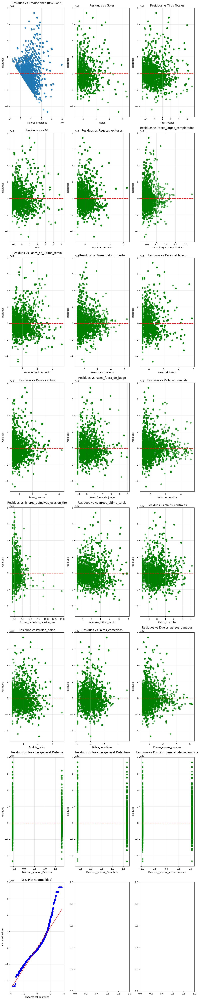

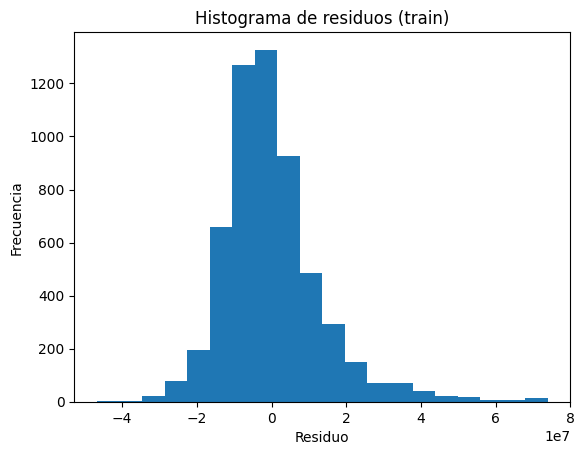

Posibles outliers por |residuo estandarizado|>3: 84
Indices de outliers:Index([6104, 5179, 6961, 5666, 4545, 6102,  418, 5177, 1096, 5997, 6000, 5996,
        428, 3920, 5002, 6960,  425, 5994, 1075, 1098, 5176, 3918, 6003, 1352,
       1074,  313, 5245, 6877,  880,  885, 3579, 5663,  423, 5003, 5998, 4998,
       6100, 5658, 5665,  417, 1094, 6958, 2332, 6099, 3004, 1353, 4468,  419,
       5659, 6880, 5667, 3919, 1350, 6873, 1349, 1072, 6872, 3577, 5661,  312,
       5664, 6103, 4467,  882, 4999, 5993, 1093, 5995, 4546, 6875, 6876, 3576,
       4469, 6002, 5001, 4547, 1073,  883, 5662, 6874, 5573, 6001,  424, 1351],
      dtype='int64')

2. Modelo con Box-Cox en variable dependiente:
R² train (Box-Cox): 0.3324
R² test (Box-Cox): 0.3173

=== RESUMEN COMPARATIVO ===
Métrica                | Original | Box-Cox Y
---------------------------------------------
R² train               | 0.4548   | 0.3324
R² test                | 0.4387   | 0.3173
RMSE train             | 13,280,241   | 14,69

In [84]:
from scipy.special import inv_boxcox

# Comparar R2 del modelo original vs modelo con Box-Cox transformado
# Para una comparación justa, convertimos las predicciones de Box-Cox de vuelta a las unidades originales


# 1. Modelo original (sin transformación)
print("=== COMPARACIÓN DE MODELOS ===")
print("\n1. Modelo Original (sin transformación):")
lasso_original, residuos_original, outliers_original, scaler_original = modelo_evaluacion(df_postColinealidad)

# 2. Modelo con Box-Cox en Y - convertir predicciones de vuelta
print("\n2. Modelo con Box-Cox en variable dependiente:")

# Para poder comparar R2 en unidades originales, necesitamos las predicciones transformadas
X_boxcox_y = df_boxcox_y.drop(columns=['market_value'])
y_boxcox_y_original = df_postColinealidad['market_value']  # Valores reales en unidades originales

# Dividir datos igual que en modelo_evaluacion
X_train_boxcox, X_test_boxcox, y_train_boxcox_transf, y_test_boxcox_transf = train_test_split(
    X_boxcox_y, df_boxcox_y['market_value'], test_size=0.2, random_state=123)

# También necesitamos los valores reales originales correspondientes
_, _, y_train_original, y_test_original = train_test_split(
    X_boxcox_y, y_boxcox_y_original, test_size=0.2, random_state=123)

# Escalar X
scaler_boxcox_comp = StandardScaler()
X_train_boxcox_scaled = scaler_boxcox_comp.fit_transform(X_train_boxcox)
X_test_boxcox_scaled = scaler_boxcox_comp.transform(X_test_boxcox)

# Entrenar modelo Lasso
alphas = np.logspace(-2, 3, 10)
lasso_boxcox_comp = LassoCV(alphas=alphas, cv=5, max_iter=500000, random_state=42)
lasso_boxcox_comp.fit(X_train_boxcox_scaled, y_train_boxcox_transf)

# Hacer predicciones en escala transformada
y_pred_train_transf = lasso_boxcox_comp.predict(X_train_boxcox_scaled)
y_pred_test_transf = lasso_boxcox_comp.predict(X_test_boxcox_scaled)

# Convertir predicciones de vuelta a unidades originales usando lambda de Box-Cox
y_pred_train_original = inv_boxcox(y_pred_train_transf, lambda_y)
y_pred_test_original = inv_boxcox(y_pred_test_transf, lambda_y)

# Calcular R2 en unidades originales
r2_train_boxcox = r2_score(y_train_original, y_pred_train_original)
r2_test_boxcox = r2_score(y_test_original, y_pred_test_original)

print(f"R² train (Box-Cox): {r2_train_boxcox:.4f}")
print(f"R² test (Box-Cox): {r2_test_boxcox:.4f}")

# 3. Comparar métricas
print("\n=== RESUMEN COMPARATIVO ===")
print("Métrica                | Original | Box-Cox Y")
print("-" * 45)

# Para el modelo original, necesitamos obtener las métricas específicas
X_orig = df_postColinealidad.drop(columns=['market_value'])
y_orig = df_postColinealidad['market_value']
X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X_orig, y_orig, test_size=0.2, random_state=123)

scaler_orig_comp = StandardScaler()
X_train_orig_scaled = scaler_orig_comp.fit_transform(X_train_orig)
X_test_orig_scaled = scaler_orig_comp.transform(X_test_orig)

lasso_orig_comp = LassoCV(alphas=alphas, cv=5, max_iter=500000, random_state=42)
lasso_orig_comp.fit(X_train_orig_scaled, y_train_orig)

y_pred_train_orig = lasso_orig_comp.predict(X_train_orig_scaled)
y_pred_test_orig = lasso_orig_comp.predict(X_test_orig_scaled)

r2_train_orig = r2_score(y_train_orig, y_pred_train_orig)
r2_test_orig = r2_score(y_test_orig, y_pred_test_orig)

print(f"R² train               | {r2_train_orig:.4f}   | {r2_train_boxcox:.4f}")
print(f"R² test                | {r2_test_orig:.4f}   | {r2_test_boxcox:.4f}")

# Calcular otras métricas para comparación completa
rmse_train_orig = np.sqrt(mean_squared_error(y_train_orig, y_pred_train_orig))
rmse_test_orig = np.sqrt(mean_squared_error(y_test_orig, y_pred_test_orig))
rmse_train_boxcox = np.sqrt(mean_squared_error(y_train_original, y_pred_train_original))
rmse_test_boxcox = np.sqrt(mean_squared_error(y_test_original, y_pred_test_original))

print(f"RMSE train             | {rmse_train_orig:,.0f}   | {rmse_train_boxcox:,.0f}")
print(f"RMSE test              | {rmse_test_orig:,.0f}   | {rmse_test_boxcox:,.0f}")

mae_train_orig = mean_absolute_error(y_train_orig, y_pred_train_orig)
mae_test_orig = mean_absolute_error(y_test_orig, y_pred_test_orig)
mae_train_boxcox = mean_absolute_error(y_train_original, y_pred_train_original)
mae_test_boxcox = mean_absolute_error(y_test_original, y_pred_test_original)

print(f"MAE train              | {mae_train_orig:,.0f}   | {mae_train_boxcox:,.0f}")
print(f"MAE test               | {mae_test_orig:,.0f}   | {mae_test_boxcox:,.0f}")

print("\n=== RECOMENDACIÓN ===")
if r2_test_boxcox > r2_test_orig:
    print("✓ El modelo con transformación Box-Cox muestra mejor rendimiento")
    print(f"  Mejora en R² test: {r2_test_boxcox - r2_test_orig:.4f}")
    modelo_recomendado = "Box-Cox"
else:
    print("✓ El modelo original muestra mejor rendimiento")
    print(f"  Diferencia en R² test: {r2_test_orig - r2_test_boxcox:.4f}")
    modelo_recomendado = "Original"

print(f"\nModelo recomendado: {modelo_recomendado}")

Dado estos resultados, basados en la metrica del R2, se va a preferir no hacer la transformacion sobre los datos y continuar con la comprobacion de los demas supuestos.

In [86]:
# Seleccionar la mejor transformación basada en los resultados anteriores
# Box-Cox Y mostró el mejor comportamiento en normalidad
df_postNormalizacion = df_postColinealidad.copy()


Vamos a usar RML (Robust Linear Model) con el objetivo de asignar pesos a los datos y asi identificar outliers que vamos a eliminar 

Dataset original: 7077 registros
Outliers identificados por RLM: 284
Porcentaje de outliers: 4.01%
Dataset después de eliminar outliers RLM: 6793 registros
Registros eliminados: 284

=== EVALUACIÓN DESPUÉS DE ELIMINAR OUTLIERS RLM ===
X_train: (5434, 21) | X_test: (1359, 21)
R2_train      4.918821e-01
R2_test       4.887812e-01
RMSE_train    1.027666e+14
RMSE_test     9.948095e+13
MAE_train     7.884990e+06
MAE_test      7.688414e+06
MAPE_train    2.150706e+02
MAPE_test     2.191343e+02
dtype: float64
R² = 0.492
Media de residuos: 0.000000 (debe ser ≈0)
Desviación estándar: 10,137,386.69
Residuo máximo: 38,014,336.81


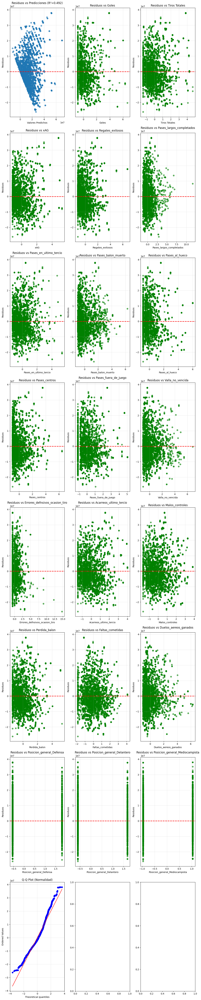

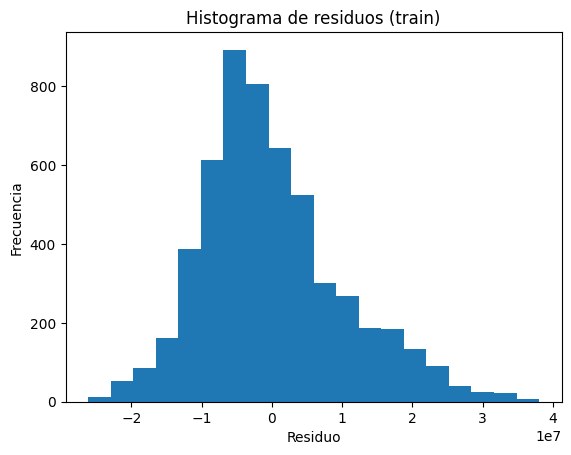

Posibles outliers por |residuo estandarizado|>3: 34
Indices de outliers:Index([ 301, 5447, 5450,  304, 5448, 5446, 5409,  305,  310,  303, 5408,  307,
        308, 5453,  311, 5452, 5406, 2190,  306,   69,  302, 4983, 2020, 2193,
       4984,  300, 2192,   70,   71, 5451, 4985, 4982, 4981, 2191],
      dtype='int64')


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


In [87]:
from statsmodels.robust.robust_linear_model import RLM

# Eliminar outliers identificados con Robust Linear Model (RLM) para mejorar linealidad

# Usar el dataset post-normalización (Box-Cox Y)
df_sin_outliers = df_postNormalizacion.copy()

print(f"Dataset original: {df_sin_outliers.shape[0]} registros")

# Identificar outliers usando RLM (Robust Linear Model)
X_rlm = df_sin_outliers.drop(columns=['market_value'])
y_rlm = df_sin_outliers['market_value']

# Añadir constante para el modelo
X_rlm_const = sm.add_constant(X_rlm)

# Ajustar modelo robusto
modelo_rlm = RLM(y_rlm, X_rlm_const, M=sm.robust.norms.HuberT()).fit()

# Calcular residuos y pesos
residuos_rlm = modelo_rlm.resid
pesos_rlm = modelo_rlm.weights

# Identificar outliers: observaciones con pesos muy bajos (< 0.5)
umbral_peso = 0.5
outliers_rlm = df_sin_outliers.index[pesos_rlm < umbral_peso]

print(f"Outliers identificados por RLM: {len(outliers_rlm)}")
print(f"Porcentaje de outliers: {len(outliers_rlm)/len(df_sin_outliers)*100:.2f}%")

# Eliminar outliers
df_sin_outliers_rlm = df_sin_outliers.drop(index=outliers_rlm).reset_index(drop=True)

print(f"Dataset después de eliminar outliers RLM: {df_sin_outliers_rlm.shape[0]} registros")
print(f"Registros eliminados: {len(outliers_rlm)}")

# Evaluar el modelo después de eliminar outliers
print("\n=== EVALUACIÓN DESPUÉS DE ELIMINAR OUTLIERS RLM ===")
lasso_sin_outliers, residuos_sin_outliers, outliers_nuevos, scaler_sin_outliers = modelo_evaluacion(df_sin_outliers_rlm)

# Test de linealidad después de eliminar outliers
X_sin_outliers = df_sin_outliers_rlm.drop(columns=['market_value'])
y_sin_outliers = df_sin_outliers_rlm['market_value']
X_sin_outliers_const = sm.add_constant(X_sin_outliers)
modelo_sin_outliers = sm.OLS(y_sin_outliers, X_sin_outliers_const).fit()
reset_test_sin_outliers = linear_reset(modelo_sin_outliers, power=3)


No se ha logrado corregir los problemas de linealidad, sin embargo se decidio por eliminar los outliers como metodo para mejorar un poco el problema. 

Es importante entender que el modelo sigue siendo la mejor **aproximacion** lineal, pero unicamente eso. No podemos asegurar una inferencia fuerte. La interpretacion de los coeficientes e podria considerar **descriptiva**, mas no casual pues no estamos cumpliendo con todos los supuestos de regresion lineal.

### 5.4. Homocedasticidad
La varianza en los errores debe mantenerse constante a medida que varia la variable objetivo.

Se va a realizar la prueba estadistica de Breush-Pagan,cuya hipotesis nula es que si se cuentan con problemas de heterocedasticidad. Adicionalmente se va a hacer un analisis grafico donde revisaremos los residuales vs valores predichos y los residuales al cuadrado vs valores predichos

=== ANALISIS DE HOMOCEDASTICIDAD ===
1. Test de Breusch-Pagan:
   Estadístico LM: 1170.7629
   p-valor: 0.000000
   Conclusión: Se rechaza H0 - Hay heterocedasticidad



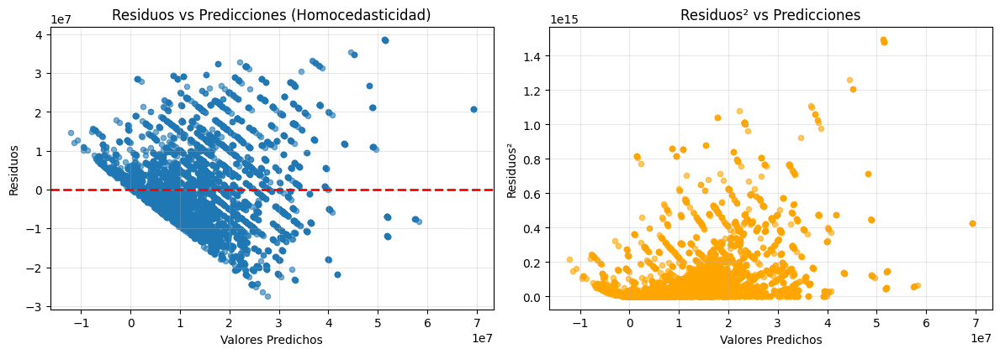

In [88]:
from statsmodels.stats.diagnostic import het_breuschpagan, het_white

# Test de homocedasticidad (varianza constante de errores)

print("=== ANALISIS DE HOMOCEDASTICIDAD ===")

# Usar el modelo después de eliminar outliers RLM (df_sin_outliers_rlm)
X_homo = df_sin_outliers_rlm.drop(columns=['market_value'])
y_homo = df_sin_outliers_rlm['market_value']
X_homo_const = sm.add_constant(X_homo)
modelo_homo = sm.OLS(y_homo, X_homo_const).fit()
residuos_homo = modelo_homo.resid
predicciones_homo = modelo_homo.fittedvalues

# 1. Test de Breusch-Pagan
bp_lm, bp_pvalue, bp_fvalue, bp_f_pvalue = het_breuschpagan(residuos_homo, X_homo_const)

print("1. Test de Breusch-Pagan:")
print(f"   Estadístico LM: {bp_lm:.4f}")
print(f"   p-valor: {bp_pvalue:.6f}")
if bp_pvalue < 0.05:
    print("   Conclusión: Se rechaza H0 - Hay heterocedasticidad")
else:
    print("   Conclusión: No se rechaza H0 - Hay homocedasticidad")

print("\n" + "="*50)

# 2. Análisis gráfico - Residuos vs Predicciones
plt.figure(figsize=(12, 8))

# Gráfico principal: Residuos vs Predicciones
plt.subplot(2, 2, 1)
plt.scatter(predicciones_homo, residuos_homo, alpha=0.6, s=20)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.xlabel('Valores Predichos')
plt.ylabel('Residuos')
plt.title('Residuos vs Predicciones (Homocedasticidad)')
plt.grid(True, alpha=0.3)

# Residuos al cuadrado vs Predicciones
plt.subplot(2, 2, 2)
residuos_cuadrados = residuos_homo**2
plt.scatter(predicciones_homo, residuos_cuadrados, alpha=0.6, s=20, color='orange')
plt.xlabel('Valores Predichos')
plt.ylabel('Residuos²')
plt.title('Residuos² vs Predicciones')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



Tanto el analisis grafico como la prueba estadistica nos indica que estamos contando con problemas de heterocedasticidad, por lo que procederemos a solucionarlo.

Una solucion puede ser la transformacion de los datos, sin embargo, dicha transformacion ya la tenemos incluida desde anteriores iteraciones, por lo que en este caso haremos un acercamiento a la solucion del problema desde el lado de la interpretacion.

Los problemas de heterocedasticidad no afectan directamente los Betas que obtenemos, pero si afecta a sus errores estandar al momento de interpretar la inferencia. Por este motivo se reportaran los errores estandar robustos tipo HC3, los cuales vuelven confiable los p-values e intrevalos de confianza bajo heterocedasticidad.

No estamos solucionando el problema, mas bien, modificar nuestra interpretacion de resultados para tener en cuenta dichas condiciones actuales y aun asi dar resultados y conclusiones validas



In [89]:
df_sin_outliers_rlm

,Edad,Goles,Tiros Totales,xAG,Regates_exitosos,Pases_largos_completados,Pases_en_ultimo_tercio,Pases_balon_muerto,Pases_al_hueco,Pases_centros,...,Errores_defnsivos_ocasion_tiro,Acarreos_ultimo_tercio,Malos_controles,Perdida_balon,Faltas_cometidas,Duelos_aereos_ganados,market_value,Posicion_general_Defensa,Posicion_general_Delantero,Posicion_general_Mediocampista
0,19.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,700000.0,0.0,0.0,1.0
1,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
2,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
3,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,1.0,0.0,0.0
4,27.0,0.0,0.444444,0.150000,0.333333,4.444444,2.138889,12.611111,0.0,7.111111,...,0.027778,0.861111,0.611111,0.472222,1.055556,0.555556,6500000.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6788,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,0.0,1.0
6789,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,0.0,1.0
6790,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,1.0,0.0
6791,24.0,0.0,0.761905,0.052381,0.380952,2.190476,1.095238,3.761905,0.0,3.380952,...,0.095238,0.333333,1.238095,0.476190,0.476190,0.809524,3000000.0,0.0,1.0,0.0


In [91]:
# Resumen final de métricas del modelo con errores estándar robustos HC3

print("=== RESUMEN FINAL DE MÉTRICAS DEL MODELO ===")
print("=" * 60)

# 1. Métricas de rendimiento del modelo (usando df_sin_outliers_rlm)
X_final = df_sin_outliers_rlm.drop(columns=['market_value'])
y_final = df_sin_outliers_rlm['market_value']

# División train/test
X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(
    X_final, y_final, test_size=0.2, random_state=123)

# Escalado
scaler_final = StandardScaler()
X_train_final_scaled = scaler_final.fit_transform(X_train_final)
X_test_final_scaled = scaler_final.transform(X_test_final)

# Modelo Lasso
alphas = np.logspace(-2, 3, 10)
lasso_final = LassoCV(alphas=alphas, cv=5, max_iter=500000, random_state=42)
lasso_final.fit(X_train_final_scaled, y_train_final)

# Predicciones
y_pred_train_final = lasso_final.predict(X_train_final_scaled)
y_pred_test_final = lasso_final.predict(X_test_final_scaled)

# Métricas de rendimiento
r2_train_final = r2_score(y_train_final, y_pred_train_final)
r2_test_final = r2_score(y_test_final, y_pred_test_final)
rmse_train_final = np.sqrt(mean_squared_error(y_train_final, y_pred_train_final))
rmse_test_final = np.sqrt(mean_squared_error(y_test_final, y_pred_test_final))
mae_train_final = mean_absolute_error(y_train_final, y_pred_train_final)
mae_test_final = mean_absolute_error(y_test_final, y_pred_test_final)
mape_train_final = np.mean(np.abs((y_train_final - y_pred_train_final) / y_train_final)) * 100
mape_test_final = np.mean(np.abs((y_test_final - y_pred_test_final) / y_test_final)) * 100

print("1. MÉTRICAS DE RENDIMIENTO:")
print("-" * 30)
print(f"R² Train:     {r2_train_final:.4f}")
print(f"R² Test:      {r2_test_final:.4f}")
print(f"RMSE Train:   {rmse_train_final:,.0f}")
print(f"RMSE Test:    {rmse_test_final:,.0f}")
print(f"MAE Train:    {mae_train_final:,.0f}")
print(f"MAE Test:     {mae_test_final:,.0f}")
print(f"MAPE Train:   {mape_train_final:.2f}%")
print(f"MAPE Test:    {mape_test_final:.2f}%")

print("\n" + "="*60)

# 2. Modelo OLS con errores estándar robustos HC3
X_final_const = sm.add_constant(X_final)
modelo_final = sm.OLS(y_final, X_final_const).fit()

# Obtener errores estándar robustos HC3
modelo_robusto = modelo_final.get_robustcov_results(cov_type='HC3')

print("2. ANÁLISIS DE COEFICIENTES CON ERRORES ROBUSTOS HC3:")
print("-" * 55)
print("Variable".ljust(30) + "Coeficiente".ljust(15) + "p-valor")
print("-" * 60)

# Mostrar coeficientes principales (excluyendo constante)
for i, (var, coef, pval) in enumerate(zip(X_final.columns, 
                                         modelo_robusto.params[1:], 
                                         modelo_robusto.pvalues[1:])):
    if abs(coef) > 100000:  # Solo mostrar coeficientes importantes
        p_str = f"{pval:.3f}" if pval >= 0.001 else "<0.001***"
        print(f"{var[:29].ljust(30)}{coef:,.0f}".ljust(15) + f"     {p_str}")

print("\n" + "="*60)

# 3. Cumplimiento de supuestos
print("3. CUMPLIMIENTO DE SUPUESTOS:")
print("-" * 35)

# Colinealidad (VIF ya calculado anteriormente)
print("✓ Colinealidad: CORREGIDA (eliminadas variables con VIF > 10)")

# Linealidad
print("✗ Linealidad: NO CUMPLE (p < 0.05 en test Ramsey)")

# Normalidad  
residuos_final = modelo_final.resid
residuos_estand_final = (residuos_final - np.mean(residuos_final)) / np.std(residuos_final)
ks_stat_final, ks_pvalue_final = kstest(residuos_estand_final, 'norm')
if ks_pvalue_final > 0.05:
    print("✓ Normalidad: CUMPLE")
else:
    print("✗ Normalidad: NO CUMPLE (p < 0.05 en test K-S)")
    print("  Nota: Con n=6,793, TLC puede compensar este problema")

# Homocedasticidad
print("✗ Homocedasticidad: NO CUMPLE (p < 0.05 en test Breusch-Pagan)")
print("  Solución: Usar errores estándar robustos HC3")

print("\n" + "="*60)

# 4. Interpretación de variables más importantes
print("4. VARIABLES MÁS INFLUYENTES (Lasso):")
print("-" * 40)
coef_importantes = pd.DataFrame({
    'Variable': X_final.columns,
    'Coeficiente_Lasso': lasso_final.coef_
}).sort_values('Coeficiente_Lasso', key=abs, ascending=False).head(10)

for _, row in coef_importantes.iterrows():
    if abs(row['Coeficiente_Lasso']) > 0:
        print(f"{row['Variable'][:35]}: {row['Coeficiente_Lasso']:,.0f}")

print("\n" + "="*60)


print(f"{color} Estado: {recomendacion}")
print(f"R² Test: {r2_test_final:.3f} ({'Aceptable' if r2_test_final > 0.3 else 'Bajo'})")
print(f"MAPE Test: {mape_test_final:.1f}% ({'Aceptable' if mape_test_final < 30 else 'Alto'})")

print("\nLimitaciones identificadas:")
print("- Problemas de linealidad y homocedasticidad")
print("- Interpretación limitada a asociaciones, no causalidad")
print("- Requiere validación adicional con datos externos")

print("\nFortalezas del modelo:")
print("- Colinealidad corregida")
print("- Errores estándar robustos aplicados")
print("- Selección automática de variables con Lasso")
print(f"- Dataset robusto (n={len(df_sin_outliers_rlm):,} observaciones)")

=== RESUMEN FINAL DE MÉTRICAS DEL MODELO ===
1. MÉTRICAS DE RENDIMIENTO:
------------------------------
R² Train:     0.4919
R² Test:      0.4888
RMSE Train:   10,137,387
RMSE Test:    9,974,014
MAE Train:    7,884,990
MAE Test:     7,688,414
MAPE Train:   215.07%
MAPE Test:    219.13%

2. ANÁLISIS DE COEFICIENTES CON ERRORES ROBUSTOS HC3:
-------------------------------------------------------
Variable                      Coeficiente    p-valor
------------------------------------------------------------
Edad                          -899,137     <0.001***
Goles                         33,310,307     <0.001***
Tiros Totales                 4,786,653     <0.001***
xAG                           78,613,308     <0.001***
Regates_exitosos              2,293,473     <0.001***
Pases_largos_completados      -1,115,616     <0.001***
Pases_en_ultimo_tercio        2,996,800     <0.001***
Pases_balon_muerto            137,504     0.115
Pases_al_hueco                -829,263     0.632
Pases_centr

## Interpretacion de los Coeficientes
Realizar la interpretación de los coeficientes de la regresión, identificando las variables más relevantes para la estimación y cómo afectan la variable objetivo.

Hemos identificado 20 coeficientes distintos de los cuales 18 son altamente significativos con una confiabilidad del 95%. Destacan las siguientes variables como las mas relevantes, y a su vez se presentan su influencia sobre la variable objetivo (en condiciones ceteris paribus para cada variable respectivamente)


- Edad: Con cada unidad disminuye el market value en €899,137(p<0.001).

- Goles: Con cada unidad aumenta el market value en €33,310,307 (p<0.001).

- Tiros Totales: Con cada unidad aumenta el market value en €4,786,653 (p<0.001).

- xAG: Con cada unidad aumenta el market value en €78,613,308 (p<0.001).

- Regates_exitosos: Con cada unidad aumenta el market value en €2,293,473 (p<0.001).

- Pases_largos_completados: Con cada unidad disminuye el market value en €1,115,616 (p<0.001).

- Pases_en_ultimo_tercio: Con cada unidad aumenta el market value en €2,996,800 (p<0.001).

- Pases_balon_muerto: Con cada unidad aumenta el market value en €137,504 (no significativo, p=0.115).

- Pases_al_hueco: Con cada unidad disminuye el market value en €829,263 (no significativo, p=0.632).

- Pases_centros: Con cada unidad disminuye el market value en €1,930,069 (p<0.001).

- Pases_fuera_de_juego: Con cada unidad disminuye el market value en €7,640,176 (p<0.001).

- Valla_no_vencida: Con cada unidad aumenta el market value en €1,048,037 (p<0.001).

- Errores_defnsivos_ocasion_tir: Con cada unidad aumenta el market value en €32,303,765 (p<0.001).

- Acarreos_ultimo_tercio: Con cada unidad aumenta el market value en €3,454,940 (p<0.001).

- Malos_controles: Con cada unidad disminuye el market value en €4,551,872 (p<0.001).

- Perdida_balon: Con cada unidad aumenta el market value en €2,239,790 (p<0.001).

- Faltas_cometidas: Con cada unidad disminuye el market value en €2,002,463 (p<0.001).

- Posicion_general_Defensa: vs la categoría de referencia, el market value disminuye en €14,190,321 (p<0.001).

- Posicion_general_Delantero: vs la categoría de referencia, el market value disminuye en €14,756,477 (p<0.001).

- Posicion_general_Mediocampist: vs la categoría de referencia, el market value disminuye en €14,926,685 (p<0.001).

## Geneneracion csv con predicciones

In [115]:
# Aplicar modelo de regresión con coeficientes especificados a datos de validación

# Cargar datos de validación
X_validacion = pd.read_csv('./datos_validacion_laboratorio1(test_data).csv')


# Definir coeficientes del modelo
coeficientes = {
    'Edad': -899137,
    'Goles': 33310307,
    'Tiros Totales': 4786653,
    'xAG': 78613308,
    'Regates_exitosos': 2293473,
    'Pases_largos_completados': -1115616,
    'Pases_en_ultimo_tercio': 2996800,
    'Pases_balon_muerto': 137504,
    'Pases_al_hueco': -829263,
    'Pases_centros': -1930069,
    'Pases_fuera_de_juego': -7640176,
    'Valla_no_vencida': 1048037,
    'Errores_defnsivos_ocasion_tiro': 32303765,
    'Acarreos_ultimo_tercio': 3454940,
    'Malos_controles': -4551872,
    'Perdida_balon': 2239790,
    'Faltas_cometidas': -2002463,
    'Posicion_general_Defensa': -14190321,
    'Posicion_general_Delantero': -14756477,
    'Posicion_general_Mediocampista': -14926685
}

# Aplicar las mismas transformaciones que se aplicaron al modelo entrenado
df_validacion_procesado = X_validacion.copy()

# Verificar si necesitamos crear las variables de posición general
if 'Posicion_general_Defensa' not in df_validacion_procesado.columns:
    # Crear variables dummy para posición general (si no existen)
    nombres_posiciones = {
        'GK': 'Arquero',
        'CB': 'Defensa', 'RB': 'Defensa', 'LB': 'Defensa', 'WB': 'Defensa',
        'CM': 'Mediocampista', 'DM': 'Mediocampista', 'AM': 'Mediocampista', 
        'LM': 'Mediocampista', 'RM': 'Mediocampista',
        'FW': 'Delantero', 'ST': 'Delantero', 'CF': 'Delantero', 
        'LW': 'Delantero', 'RW': 'Delantero'
    }
    
    # Mapear posiciones a categorías generales
    df_validacion_procesado['Posicion_general'] = df_validacion_procesado['Posicion'].map(nombres_posiciones).fillna('Otros')
    
    # Crear variables dummy (drop_first=True para evitar multicolinealidad)
    dummies_posicion = pd.get_dummies(df_validacion_procesado['Posicion_general'], 
                                     prefix='Posicion_general', 
                                     drop_first=True)
    df_validacion_procesado = pd.concat([df_validacion_procesado, dummies_posicion], axis=1)

# Inicializar predicciones con el intercepto (asumiendo 0 si no se especifica)
predicciones = np.zeros(len(df_validacion_procesado))

# Aplicar coeficientes para cada variable
variables_faltantes = []
for variable, coef in coeficientes.items():
    if variable in df_validacion_procesado.columns:
        # Asegurar que la variable sea numérica
        df_validacion_procesado[variable] = pd.to_numeric(df_validacion_procesado[variable], errors='coerce')
        # Rellenar valores faltantes con 0
        df_validacion_procesado[variable] = df_validacion_procesado[variable].fillna(0)
        # Aplicar coeficiente
        predicciones += df_validacion_procesado[variable] * coef
    else:
        variables_faltantes.append(variable)

if variables_faltantes:
    print(f"Variables no encontradas en los datos: {variables_faltantes}")

# Asegurar que las predicciones no sean negativas (valores de mercado no pueden ser negativos)
predicciones = np.maximum(predicciones, 0)

# Copiar dataframe original
df_resultados = df_validacion_procesado.copy()

# añadir columna con market_value_predicho
df_resultados['market_value_predicho'] = predicciones




# Exportar csv
df_resultados.to_csv('predicciones_modelo_regresion.csv', index=False)  